# ID5059 Group Coursework - Group 29

Firstly, load the data and required libraries.

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import copy
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, KNNImputer, SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, confusion_matrix, roc_curve, auc, log_loss, roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, NeighbourhoodCleaningRule, NearMiss
from collections import Counter
from IPython.display import HTML, display
from plotnine import ggplot, aes, geom_bar, ggtitle
from imblearn.pipeline import Pipeline as ImblearnPipeline
from xgboost import XGBClassifier
from sklearn.base import clone

In [16]:
#from google.colab import files
#from google.colab import drive

#drive.mount('/content/drive')

In [17]:
file_path_test = 'C:\\Users\\kathe\OneDrive - University of St Andrews\\ID5059\\Group Project\\test.csv'
df_test = pd.read_csv(file_path_test)

file_path_train = 'C:\\Users\\kathe\\OneDrive - University of St Andrews\\ID5059\\Group Project\\train.csv'
df_train = pd.read_csv(file_path_train)

# **1 Data Exploration**

In [18]:
# Make a copy of the training set:
df_train_copy = df_train

# Inspect the data set - how many rows and columns do we have?
print("Number of columns:", df_train_copy.shape[1])
print("Number of rows:", df_train_copy.shape[0])

Number of columns: 20
Number of rows: 7905


In [19]:
# Inspect the data set - are there null values? / which data types do the attributes have?
df_train_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7905 entries, 0 to 7904
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             7905 non-null   int64  
 1   N_Days         7905 non-null   int64  
 2   Drug           7905 non-null   object 
 3   Age            7905 non-null   int64  
 4   Sex            7905 non-null   object 
 5   Ascites        7905 non-null   object 
 6   Hepatomegaly   7905 non-null   object 
 7   Spiders        7905 non-null   object 
 8   Edema          7905 non-null   object 
 9   Bilirubin      7905 non-null   float64
 10  Cholesterol    7905 non-null   float64
 11  Albumin        7905 non-null   float64
 12  Copper         7905 non-null   float64
 13  Alk_Phos       7905 non-null   float64
 14  SGOT           7905 non-null   float64
 15  Tryglicerides  7905 non-null   float64
 16  Platelets      7905 non-null   float64
 17  Prothrombin    7905 non-null   float64
 18  Stage   

All features have 7,905 non-null values, i.e., there are no missing values.

Some features are categorical (Drug, Sex, Ascites, Heptomegaly, Spoders, Edema,Status), some features are numerical (N_Days, Age, Bilirubin, CHolesterol, Albumin, Copper, Alk_Phos, SGOT, Tryglicerides, Platelets, Stage, Prothrombin).

In [20]:
# Inspect the data set - how many distinct values do we have per attribute?
df_train_copy.nunique()

id               7905
N_Days            461
Drug                2
Age               391
Sex                 2
Ascites             2
Hepatomegaly        2
Spiders             2
Edema               3
Bilirubin         111
Cholesterol       226
Albumin           160
Copper            171
Alk_Phos          364
SGOT              206
Tryglicerides     154
Platelets         227
Prothrombin        49
Stage               4
Status              3
dtype: int64

The id column has 7905 distinct values, so this is a unique identifier which we will not further explore.

## Inspect Label

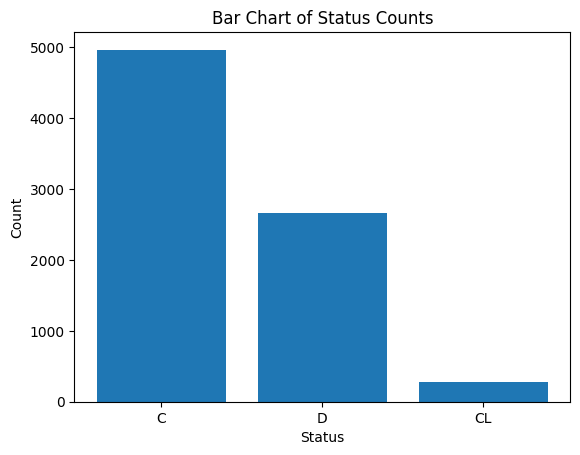

Status
C     4965
D     2665
CL     275
Name: count, dtype: int64


In [21]:
# Inspecting our label "Status"

status_counts = df_train_copy['Status'].value_counts()

plt.bar(status_counts.index, status_counts.values)
plt.xlabel('Status')
plt.ylabel('Count')
plt.title('Bar Chart of Status Counts')
plt.show()

status_counts = df_train_copy['Status'].value_counts()
status_counts.columns = ['Status', 'Count']
print(status_counts)

We can see that there are 3 different categories, C, D, and CL, so we have a multiclassification problem.

We can also see that there is a huge imbalance between classes with 4965 observations in status "C", 2665 observations in status "D", and only 275 observations in status "CL".

In [22]:
# Encode labels for further processing

labelencoder = LabelEncoder()

categorical_cols = df_train_copy[['Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema', 'Status']]
numeric_cols = ['id', 'N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Stage']

encoded_categorical_cols = pd.DataFrame()

for col in categorical_cols.columns:
    encoded_categorical_cols[col] = labelencoder.fit_transform(categorical_cols[col])

df_train_copy_processed = pd.concat([df_train_copy[numeric_cols].reset_index(drop=True), encoded_categorical_cols], axis=1)

## Histograms and Correlation Matrix


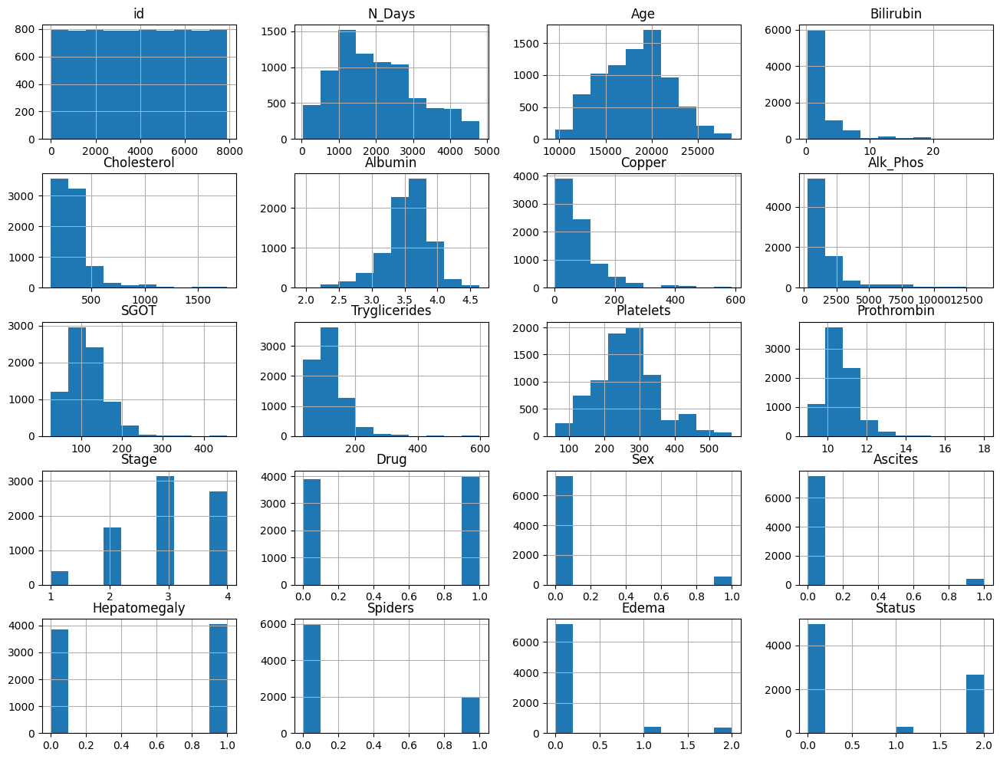

In [23]:
# Histograms of all features to see their distributions
df_train_copy_processed.hist(figsize=(16, 12));

Different distributions:
 - most continuous attributes have tails in their distribution
 - most categorical attributes are not balanced, as is our label "Status"
 - age is measured in days which is more accurate than measuring it in years, however, it will probably be easier to deal with in the model by grouping age values together

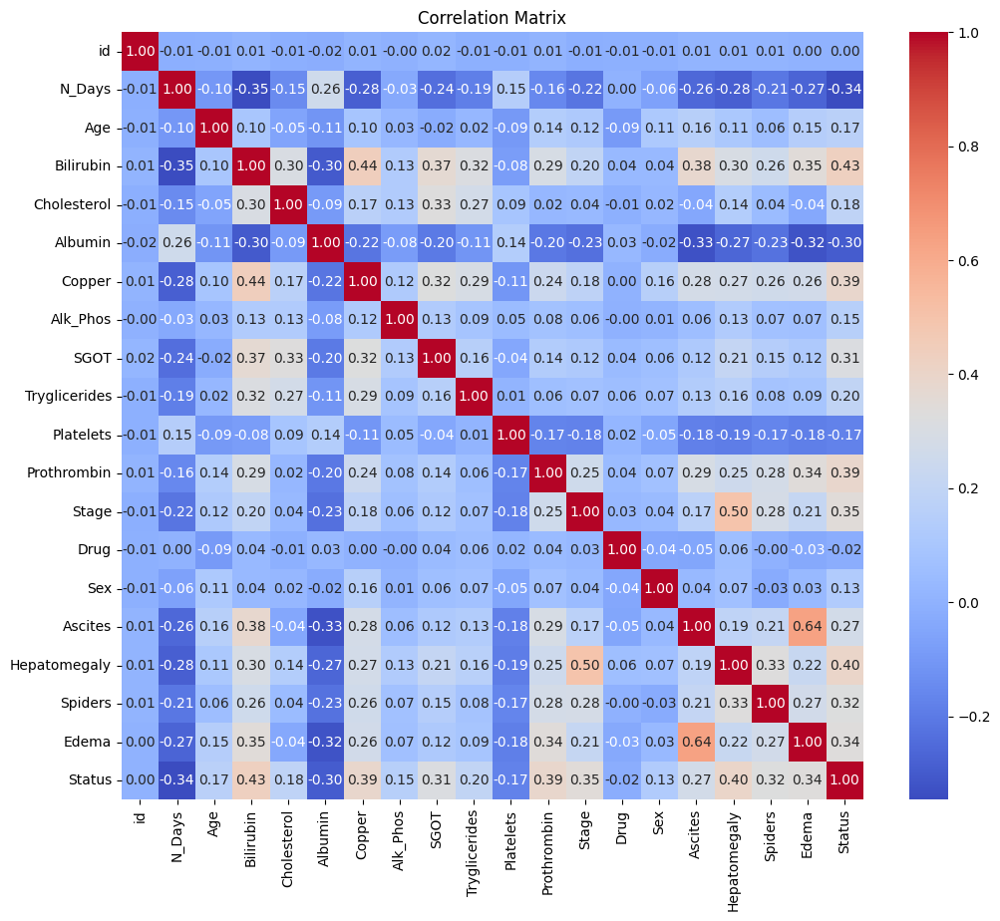

In [24]:
# Correlation matrix to identify linear correlations

correlation_matrix = df_train_copy_processed.corr()

plt.figure(figsize = (12, 10))
plt.title('Correlation Matrix')
sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm', fmt = ".2f")
plt.show()

**Correlation matrix findigs:**

The strongest linear correlations found between a feature and the status label can be observed for:
* Bilirubin (0.43)
* Heptatomegagly (0.40)
* Copper (0.39)
* Prothrombin (0.39)
* Stage (0.35)
* Edema (0.34)
* N_days (-0.34)

The strongest linear correlations found between two features can be observed for:
* Ascites and Edema (0.64)
* Stage and Hepatomegaly (0.50)
* Bilirubin and Copper (0.44)
* Bilirubin and Ascites (0.38)
* Bilirubin and Alk_phos (0.37)
* Bilirubin and Edema (0.35)
* N_days and Bilirubin (-0.35)

Overall, no strong linear correlations.

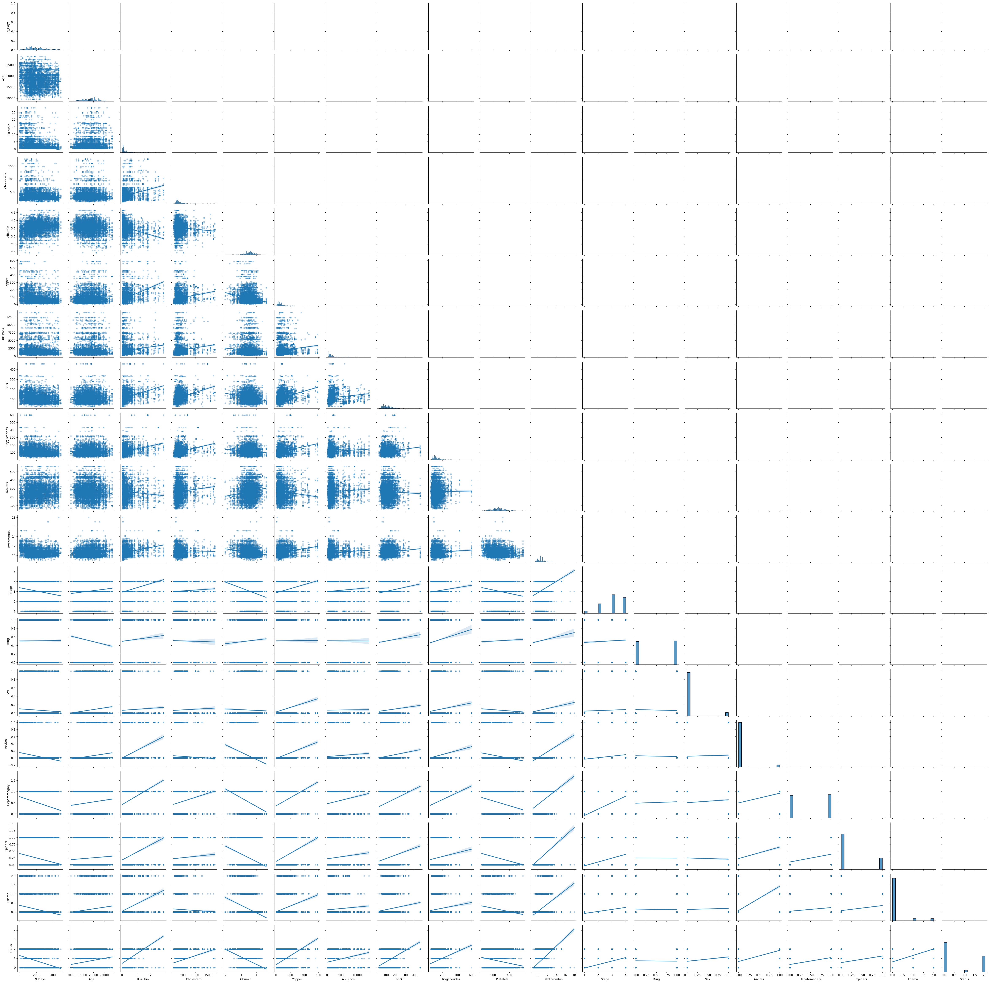

In [25]:
# Pair grid with all data attributes
pair_grid = sns.PairGrid(df_train_copy_processed, vars=['N_Days', 'Age', 'Bilirubin', 'Cholesterol', 'Albumin', 'Copper', 'Alk_Phos', 'SGOT', 'Tryglicerides', 'Platelets', 'Prothrombin', 'Stage', 'Drug', 'Sex', 'Ascites', 'Hepatomegaly', 'Spiders', 'Edema', 'Status'])
pair_grid = pair_grid.map_lower(sns.regplot, scatter_kws={'alpha': 0.3, 's': 15})
pair_grid = pair_grid.map_diag(sns.histplot, kde=False)
pair_grid = pair_grid.add_legend()
plt.show()

As indicated by the correlation matrix before, there are no strong linear correlations. In addition, it seems like there are also no strong non-linear correlations.

**Order:** looking at each attribute against the Status variable (last row of the pair grid), we can also see that there is no order in the data set (so the data points are in random order).

## Relationships between Individual Features and the Response Variable

### Categorical Features

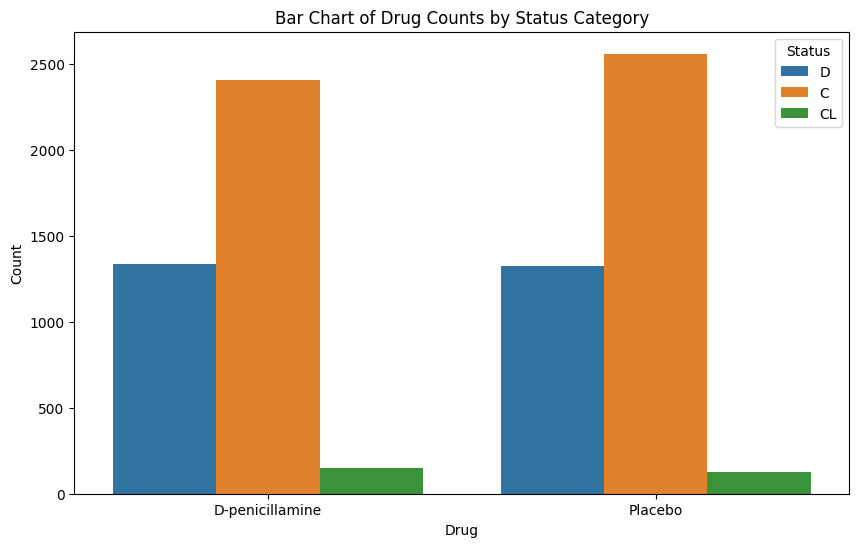

Status              C   CL     D
Drug                            
D-penicillamine  2405  151  1339
Placebo          2560  124  1326


In [26]:
# Bar Chart Drug
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Drug', hue='Status')
plt.title('Bar Chart of Drug Counts by Status Category')
plt.xlabel('Drug')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Drug'], df_train_copy['Status'])
print(cross_table)

Status is relatively equally distributed across D-penicillamine and the placebo. Whether a patient took D-penicillamine or a placebo seems therefore not to be a strong predictor for the status class.

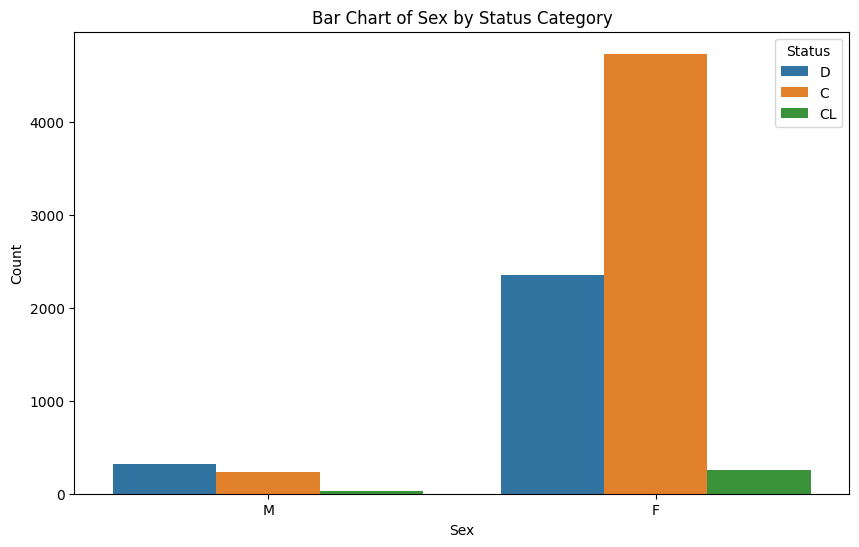

Status     C   CL     D
Sex                    
F       4735  251  2350
M        230   24   315


In [27]:
# Bar Chart Sex
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Sex', hue='Status')
plt.title('Bar Chart of Sex by Status Category')
plt.xlabel('Sex')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Sex'], df_train_copy['Status'])
print(cross_table)

We see an unequal distribution of gender in our dataset: there are significantly more observations of female than male persons in our dataset. We therefore have a class imbalance in the Sex feature.

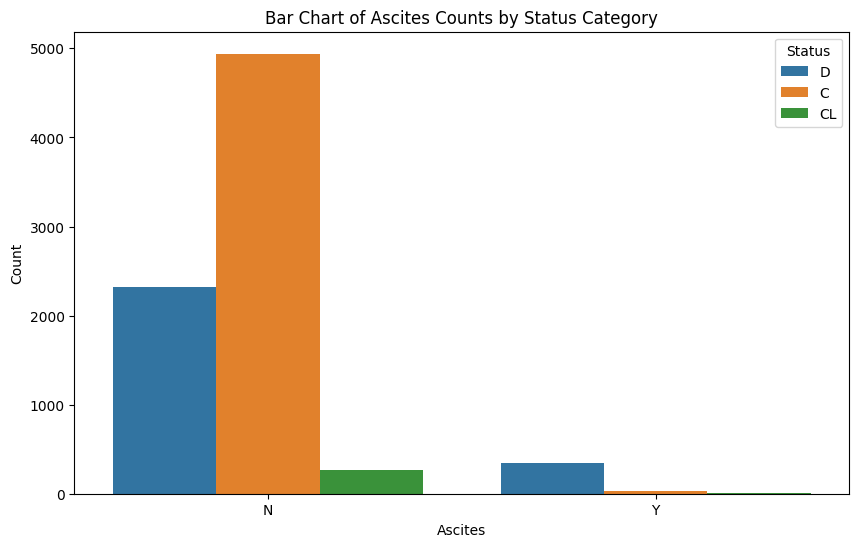

Status      C   CL     D
Ascites                 
N        4940  269  2316
Y          25    6   349


In [28]:
# Bar Chart Ascites
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Ascites', hue='Status')
plt.title('Bar Chart of Ascites Counts by Status Category')
plt.xlabel('Ascites')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Ascites'], df_train_copy['Status'])
print(cross_table)

Feature Ascites is imbalanced with more data in category "N".

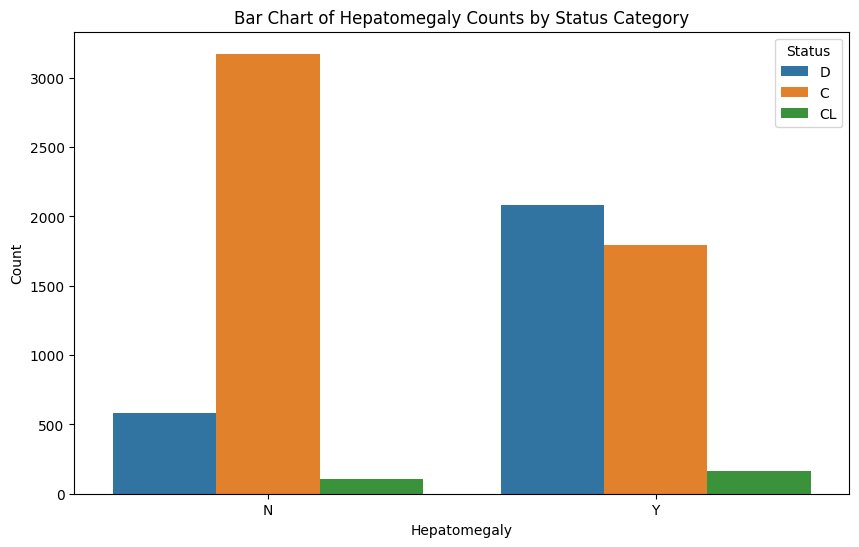

Status           C   CL     D
Hepatomegaly                 
N             3174  109   580
Y             1791  166  2085


In [29]:
# Bar Chart Hepatomegaly
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Hepatomegaly', hue='Status')
plt.title('Bar Chart of Hepatomegaly Counts by Status Category')
plt.xlabel('Hepatomegaly')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Hepatomegaly'], df_train_copy['Status'])
print(cross_table)

Different distributions of stati for Hepatomegaly. Hepatomegaly could be a weak indicator for status.

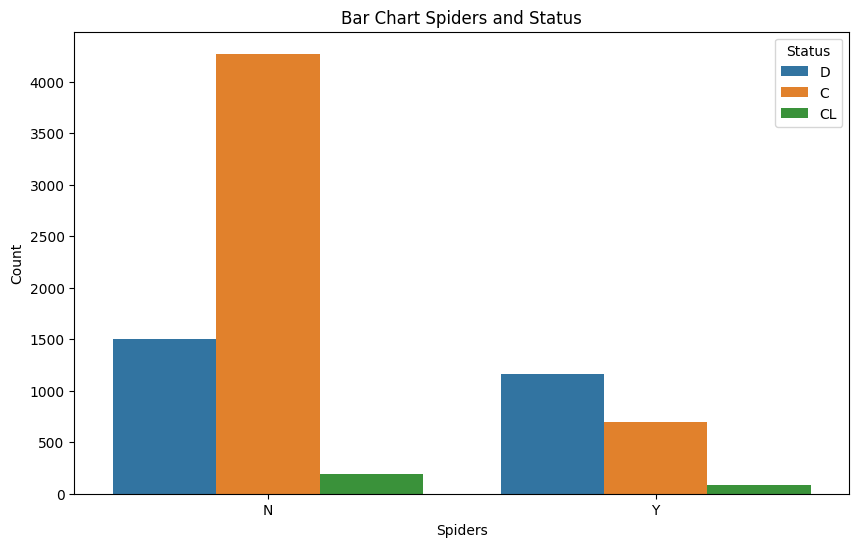

Status      C   CL     D
Spiders                 
N        4272  193  1501
Y         693   82  1164


In [30]:
# Bar Chart Spiders
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Spiders', hue='Status')
plt.title('Bar Chart Spiders and Status')
plt.xlabel('Spiders')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Spiders'], df_train_copy['Status'])
print(cross_table)

The classes are imbalanced. Status "C" counts much more observations of Spider class "N" than Spider class "Y".

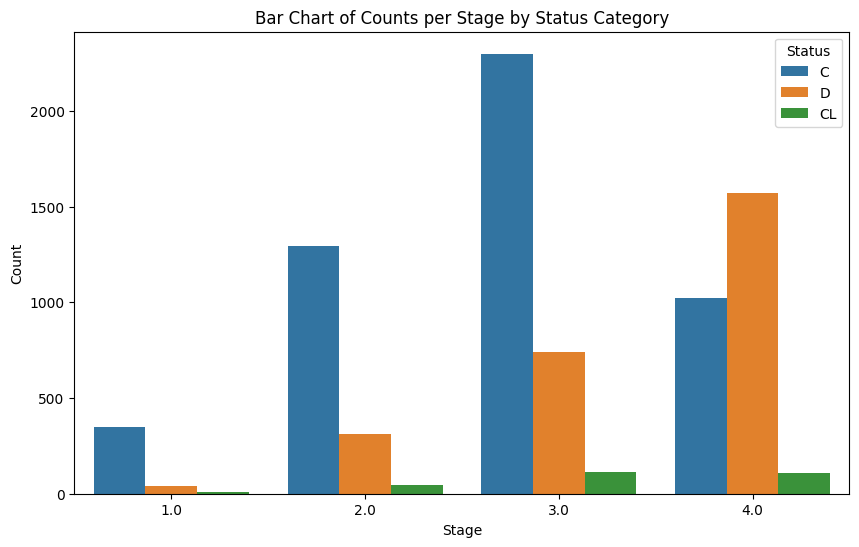

Status     C   CL     D
Stage                  
1.0      351    7    39
2.0     1293   47   312
3.0     2298  113   742
4.0     1023  108  1572


In [31]:
# Bar Chart Stage
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Stage', hue='Status')
plt.title('Bar Chart of Counts per Stage by Status Category')
plt.xlabel('Stage')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Stage'], df_train_copy['Status'])
print(cross_table)

Majority of observations fall into stage 3 and 4. Status C and CL show a peak of their distribution in stage 3 with a light tail towards lower stages. Status D shows an increasing trend.

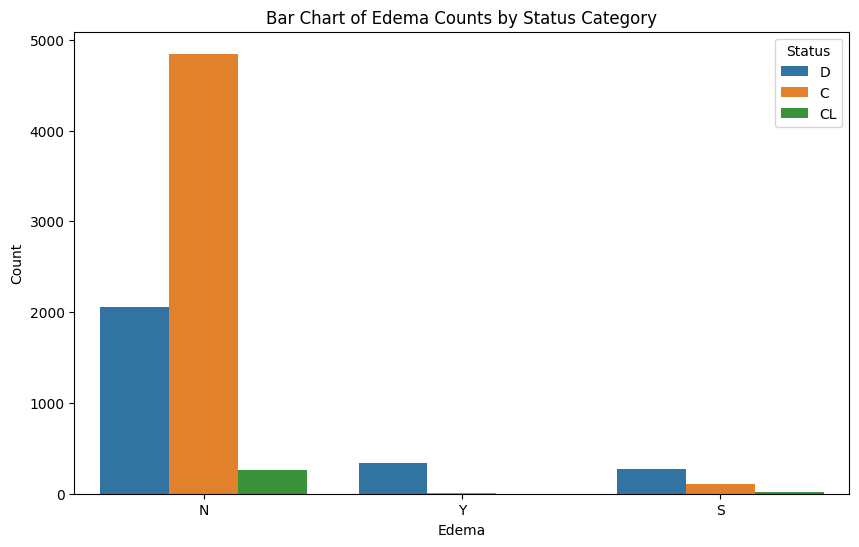

Status     C   CL     D
Edema                  
N       4847  257  2057
S        110   16   273
Y          8    2   335


In [32]:
# Bar Chart Edema
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Edema', hue='Status')
plt.title('Bar Chart of Edema Counts by Status Category')
plt.xlabel('Edema')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Edema'], df_train_copy['Status'])
print(cross_table)

We see imbalanced classes with the majority of observations in Edema category "N".

### Numerical Features

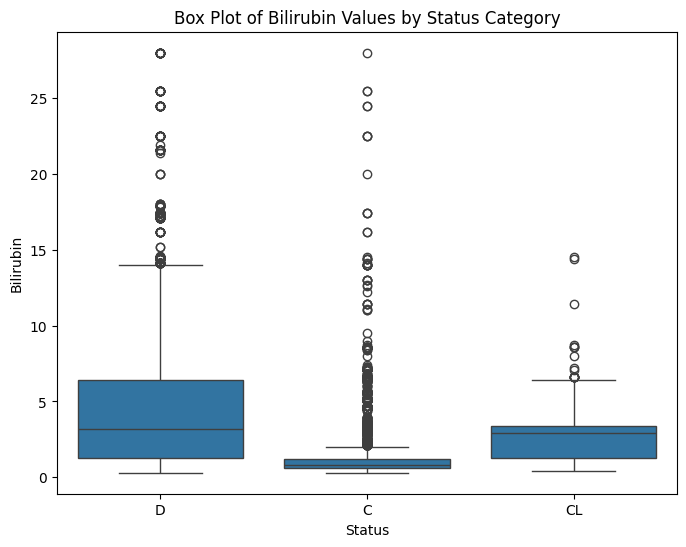

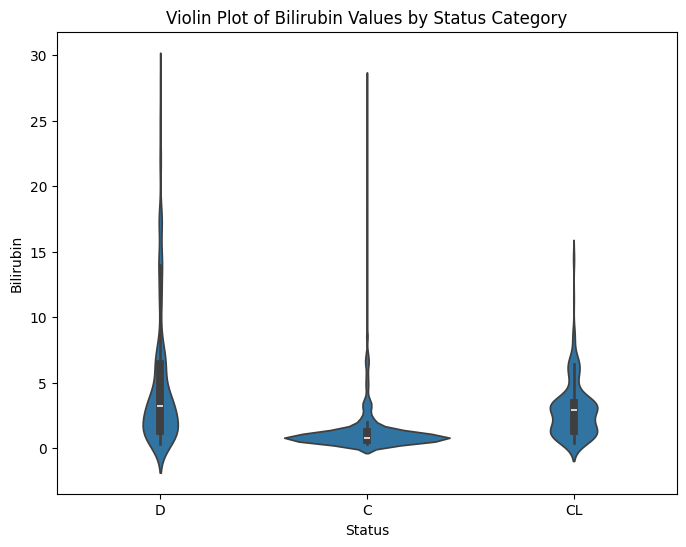

            Mean  Median
Status                  
C       1.362699     0.8
CL      2.903273     2.9
D       4.857486     3.2


In [33]:
# Bilirubin

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Bilirubin', data=df_train_copy)
plt.title('Box Plot of Bilirubin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Bilirubin')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Bilirubin', data=df_train_copy)
plt.title('Violin Plot of Bilirubin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Bilirubin')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Bilirubin'].mean()
medians = df_train_copy.groupby('Status')['Bilirubin'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)


Differences of Bilirubin value observations across different statuses:
 * We see many outliers in category C but overall low variance.
 * We see some outliers in category D with overall highest variance.
 *Only few outliers in category CL with medium variance.
 * Median lies much lower than mean in categories D and CL.

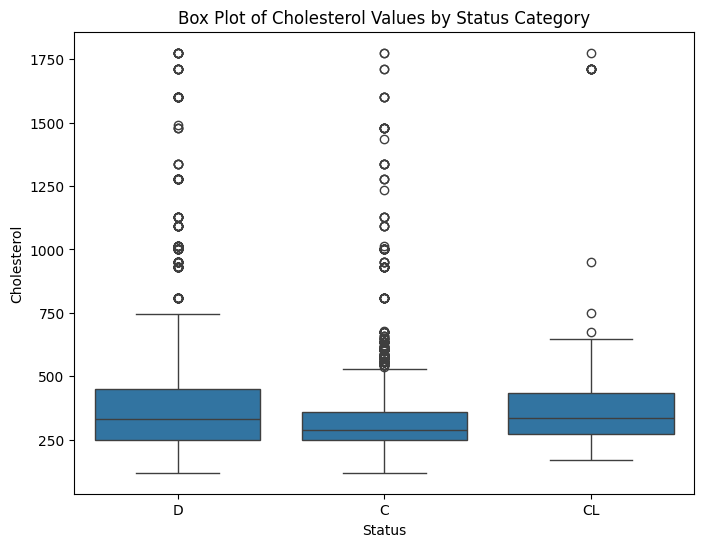

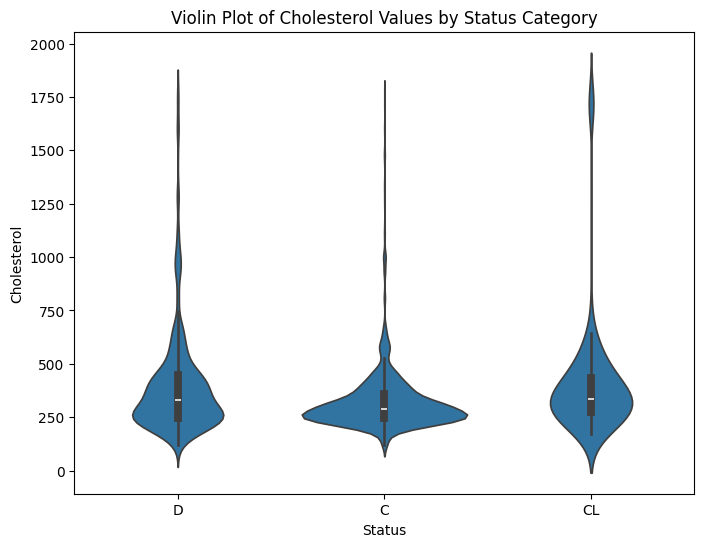

              Mean  Median
Status                    
C       322.078751   288.0
CL      404.829091   336.0
D       398.027392   331.0


In [34]:
# Cholesterol

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Cholesterol', data=df_train_copy)
plt.title('Box Plot of Cholesterol Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Cholesterol')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Cholesterol', data=df_train_copy)
plt.title('Violin Plot of Cholesterol Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Cholesterol')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Cholesterol'].mean()
medians = df_train_copy.groupby('Status')['Cholesterol'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Observations regarding Cholesterol:
* Outliers in all categories.
* Variance across categories is relatively equal.
* Median lies slightly below mean in all categories.
* Only small differences of median value across status categories.

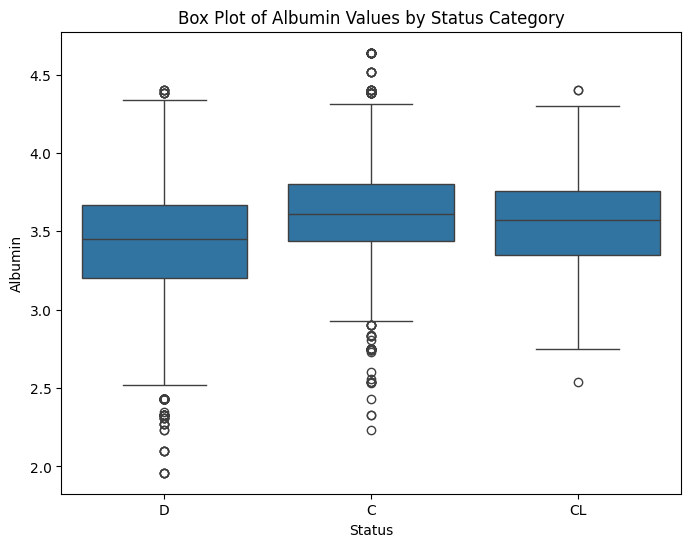

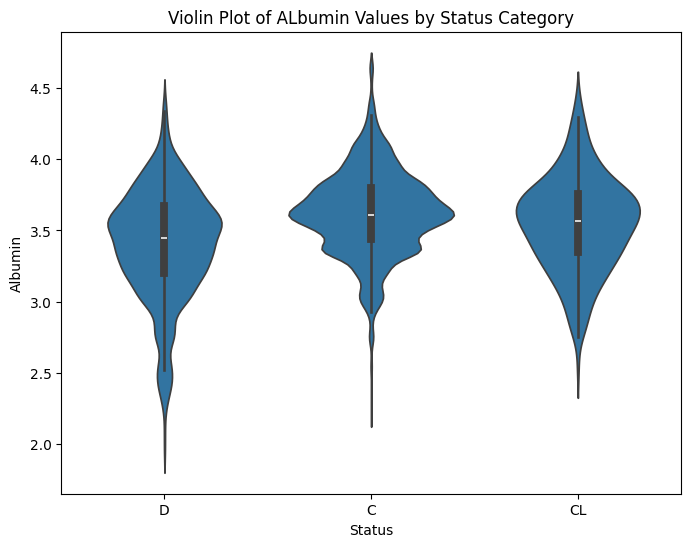

            Mean  Median
Status                  
C       3.624918    3.61
CL      3.547418    3.57
D       3.405715    3.45


In [35]:
# Albumin

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Albumin', data=df_train_copy)
plt.title('Box Plot of Albumin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Albumin')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Albumin', data=df_train_copy)
plt.title('Violin Plot of ALbumin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Albumin')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Albumin'].mean()
medians = df_train_copy.groupby('Status')['Albumin'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Albumin observations:
* Outliers in all categories in both directions.
* Variance in all status categories relatively equal.
* Median value of class D is slightly lower compared to classes C and CL.

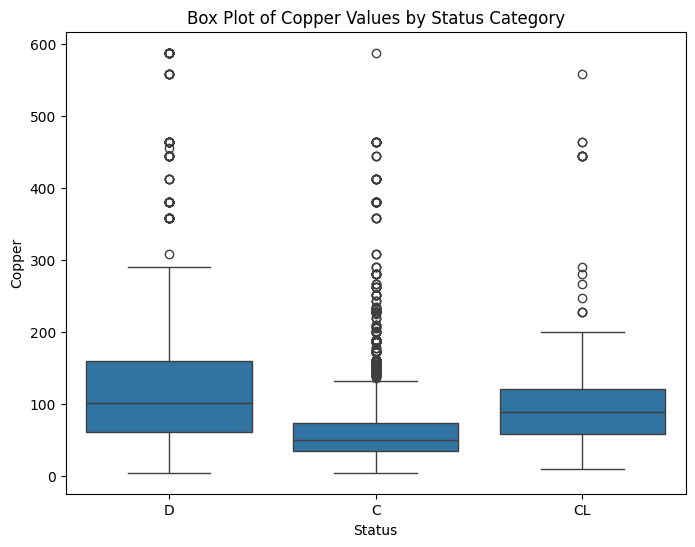

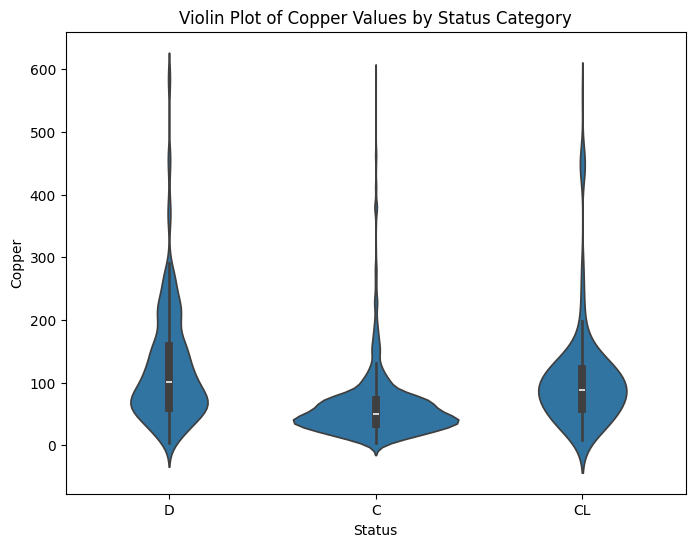

              Mean  Median
Status                    
C        61.491641    50.0
CL      102.905455    89.0
D       123.694934   101.0


In [36]:
# Copper

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Copper', data=df_train_copy)
plt.title('Box Plot of Copper Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Copper')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Copper', data=df_train_copy)
plt.title('Violin Plot of Copper Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Copper')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Copper'].mean()
medians = df_train_copy.groupby('Status')['Copper'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Copper observations:
* Outliers in all status categories.
* Variance in classes D and CL higher than in class C.
* Median values lie below mean values in all three classes.

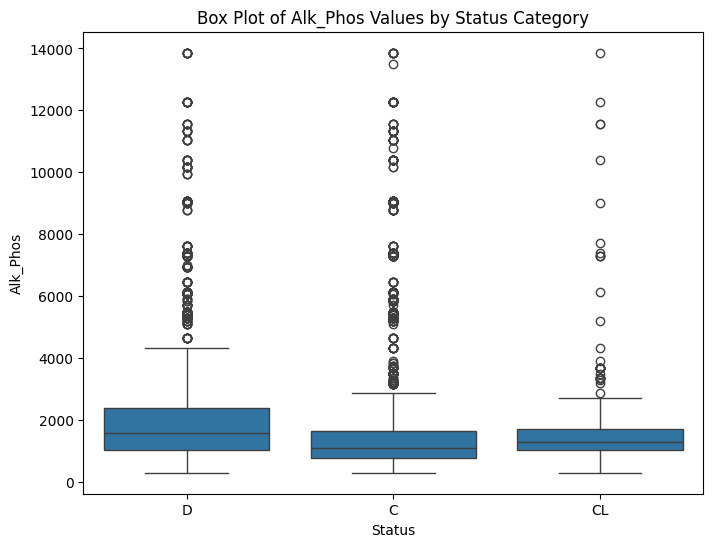

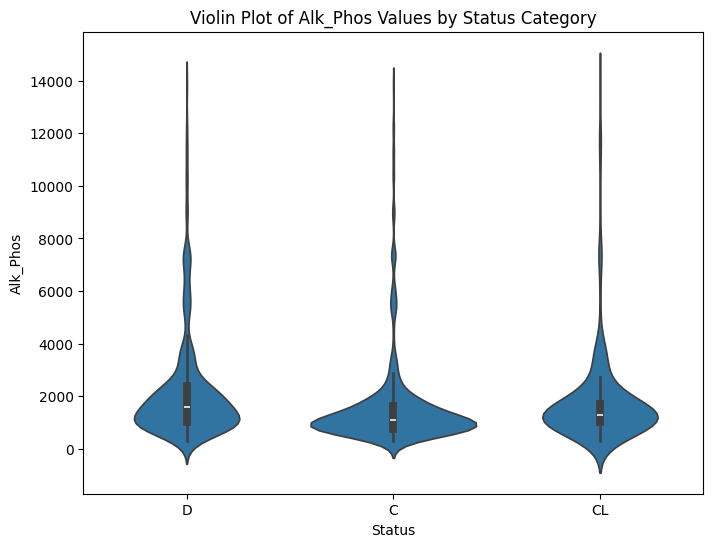

               Mean  Median
Status                     
C       1596.690715  1082.0
CL      1823.011636  1273.0
D       2226.068893  1580.0


In [37]:
# Alk_Phos

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Alk_Phos', data=df_train_copy)
plt.title('Box Plot of Alk_Phos Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Alk_Phos')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Alk_Phos', data=df_train_copy)
plt.title('Violin Plot of Alk_Phos Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Alk_Phos')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Alk_Phos'].mean()
medians = df_train_copy.groupby('Status')['Alk_Phos'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)


Alkaline phosphatase observations:
* Extreme outliers to the top in all three status classes.
* Relatively equal variance across all stati.
* Median values much lower than mean values.

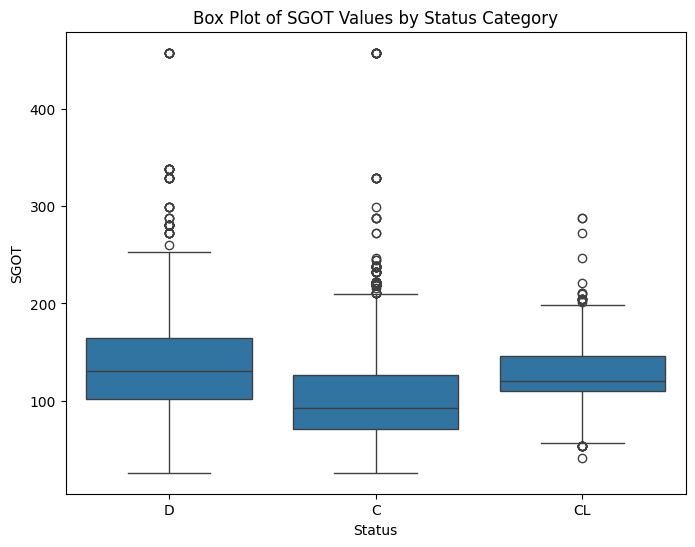

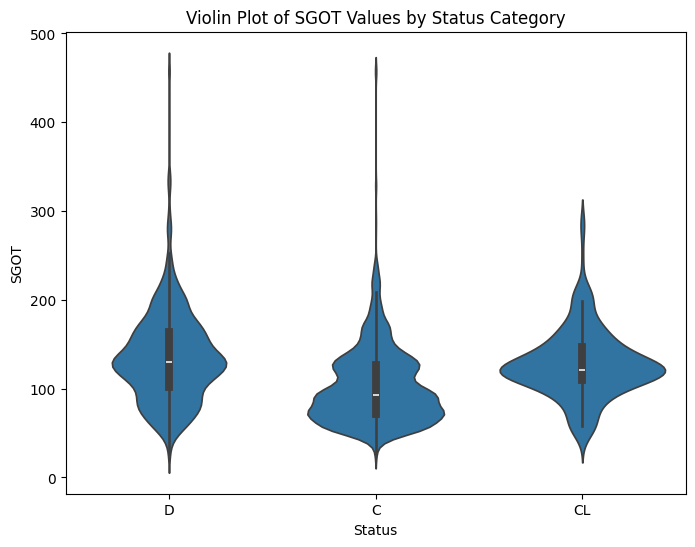

              Mean  Median
Status                    
C       102.832914    93.0
CL      127.439673   120.9
D       135.211276   130.2


In [38]:
# SGOT

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='SGOT', data=df_train_copy)
plt.title('Box Plot of SGOT Values by Status Category')
plt.xlabel('Status')
plt.ylabel('SGOT')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='SGOT', data=df_train_copy)
plt.title('Violin Plot of SGOT Values by Status Category')
plt.xlabel('Status')
plt.ylabel('SGOT')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['SGOT'].mean()
medians = df_train_copy.groupby('Status')['SGOT'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

SGOT observations:
* Outliers to the top in all status categories.
* Median and mean values are only slightly different, with median values smaller than mean values.

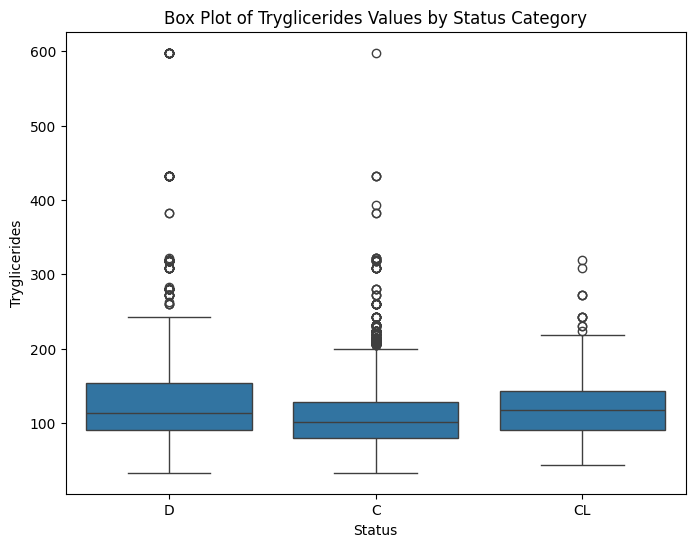

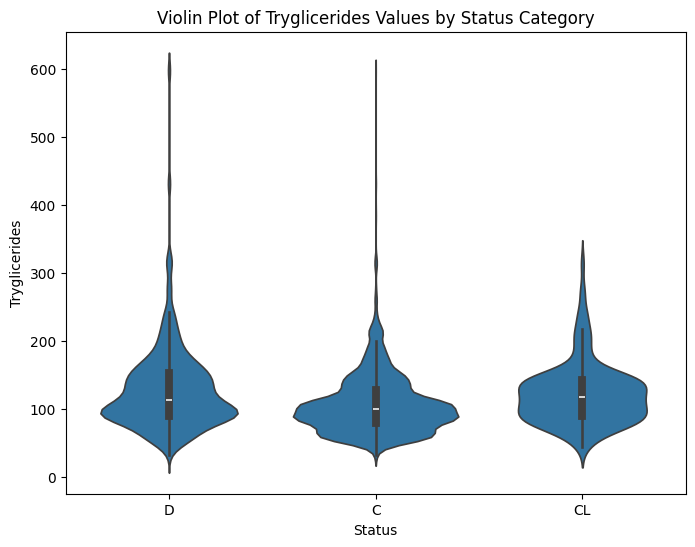

              Mean  Median
Status                    
C       107.406647   101.0
CL      122.556364   118.0
D       129.375985   114.0


In [39]:
# Tryglicerides

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Tryglicerides', data=df_train_copy)
plt.title('Box Plot of Tryglicerides Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Tryglicerides')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Tryglicerides', data=df_train_copy)
plt.title('Violin Plot of Tryglicerides Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Tryglicerides')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Tryglicerides'].mean()
medians = df_train_copy.groupby('Status')['Tryglicerides'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Tryglicerides observations:
* Outliers in all status categories, most extremely in status classes D and C.
* Moderate variance in all status classes.
* Median values (especially in class D) are a bit lower than mean values.

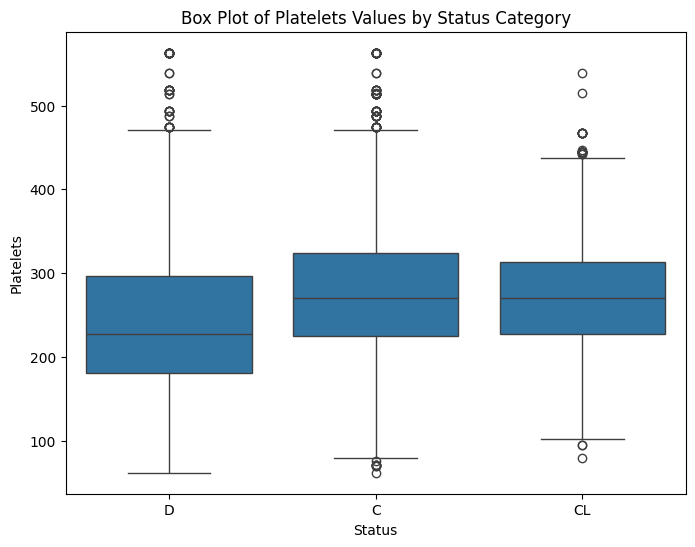

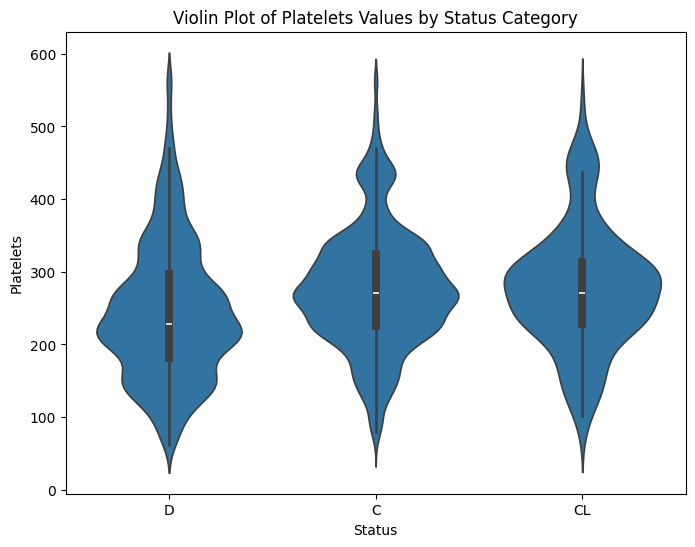

              Mean  Median
Status                    
C       276.215106   271.0
CL      277.414545   271.0
D       243.503940   228.0


In [40]:
# Platelets

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Platelets', data=df_train_copy)
plt.title('Box Plot of Platelets Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Platelets')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Platelets', data=df_train_copy)
plt.title('Violin Plot of Platelets Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Platelets')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Platelets'].mean()
medians = df_train_copy.groupby('Status')['Platelets'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Platelets observations:
* Some outliers in both directions.
* High variance in all classes.
* Median values are slightly lower than mean values.
* Status C and CL have the same median, status D a lower median compared to C and CL.

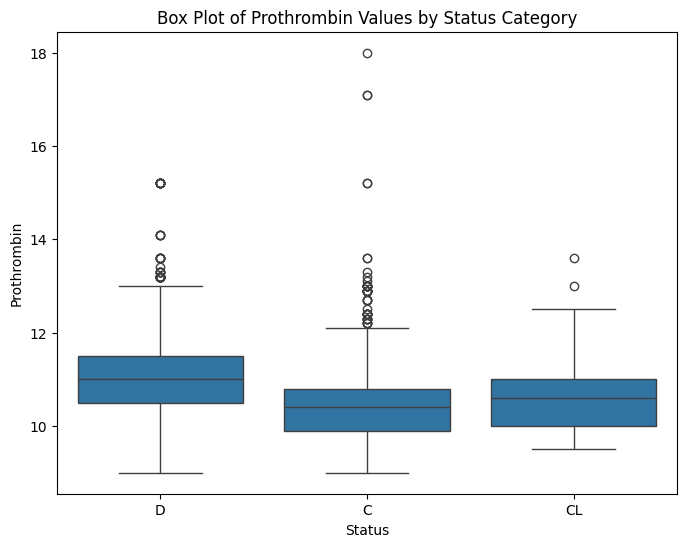

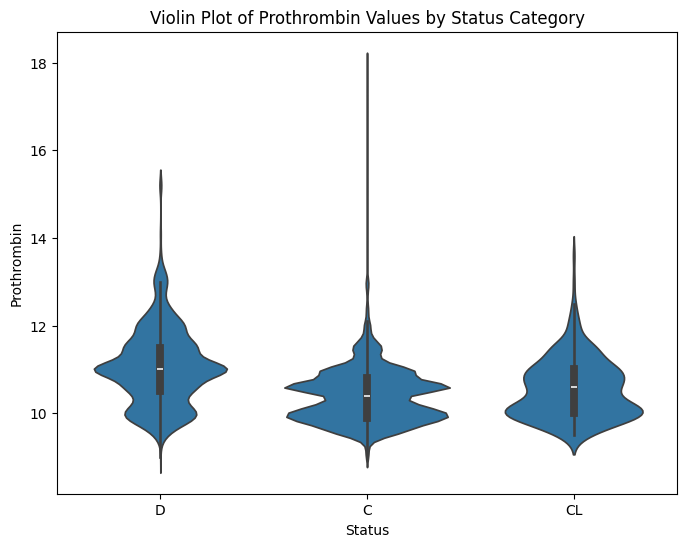

             Mean  Median
Status                   
C       10.405076    10.4
CL      10.549091    10.6
D       11.055797    11.0


In [41]:
# Prothrombin

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Prothrombin', data=df_train_copy)
plt.title('Box Plot of Prothrombin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Prothrombin')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Prothrombin', data=df_train_copy)
plt.title('Violin Plot of Prothrombin Values by Status Category')
plt.xlabel('Status')
plt.ylabel('Prothrombin')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Prothrombin'].mean()
medians = df_train_copy.groupby('Status')['Prothrombin'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Prothrombin observations:
* Some outliers, especially in status class C.
* Mean and median relatively equal.

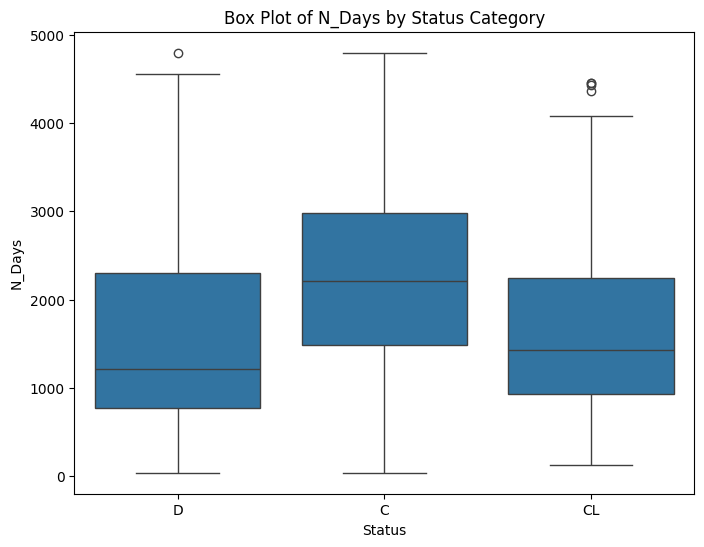

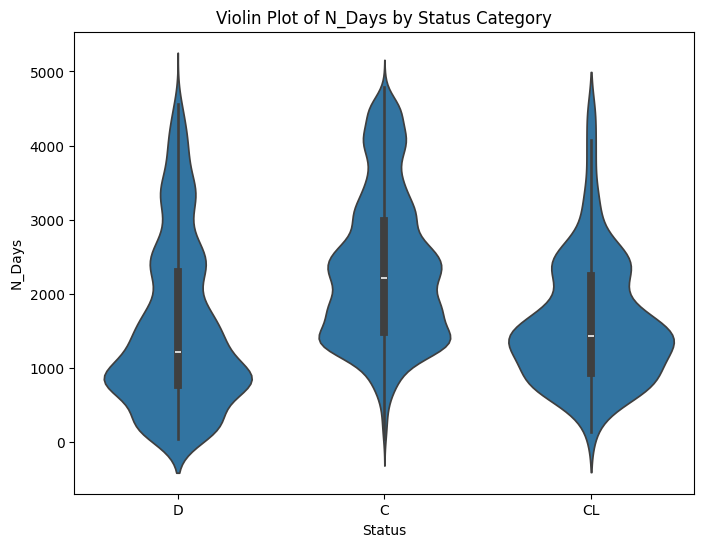

               Mean  Median
Status                     
C       2322.529305  2216.0
CL      1610.105455  1435.0
D       1528.849156  1216.0


In [42]:
# N_Days

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='N_Days', data=df_train_copy)
plt.title('Box Plot of N_Days by Status Category')
plt.xlabel('Status')
plt.ylabel('N_Days')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='N_Days', data=df_train_copy)
plt.title('Violin Plot of N_Days by Status Category')
plt.xlabel('Status')
plt.ylabel('N_Days')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['N_Days'].mean()
medians = df_train_copy.groupby('Status')['N_Days'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

N_days observations:
* Almost no outliers.
* Median values below mean values in all categories.
* High variance.

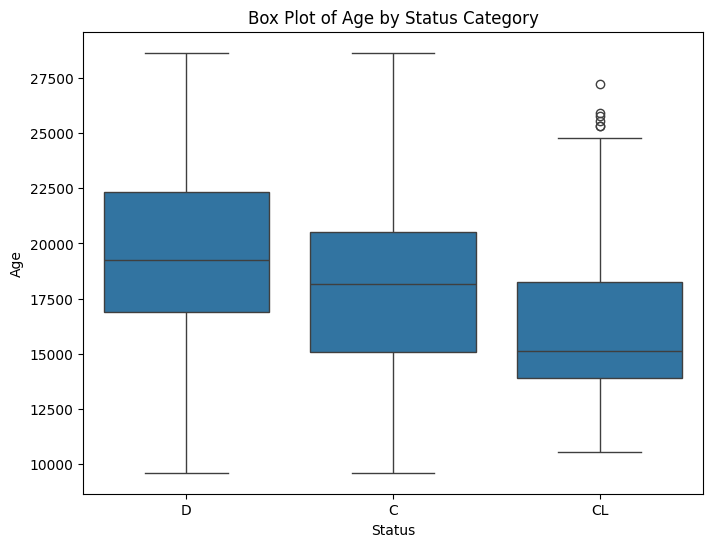

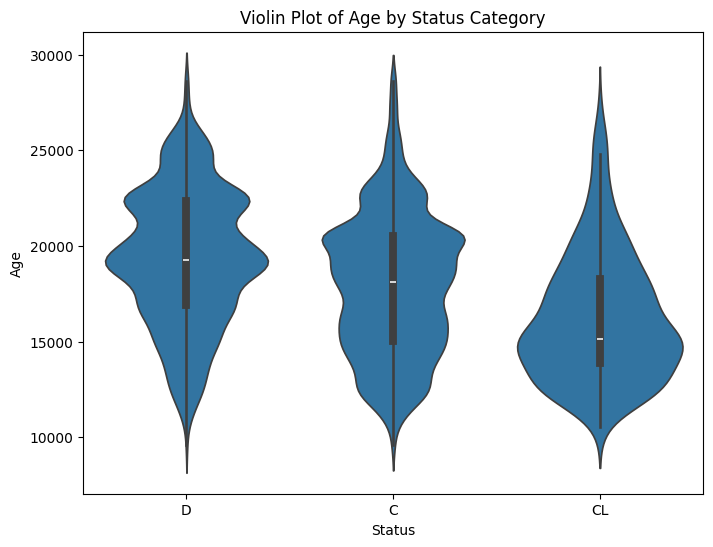

                Mean   Median
Status                       
C       17969.769587  18137.0
CL      16230.600000  15112.0
D       19345.741839  19256.0


In [43]:
# Age

# Box Plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Status', y='Age', data=df_train_copy)
plt.title('Box Plot of Age by Status Category')
plt.xlabel('Status')
plt.ylabel('Age')
plt.show()

# Violin Plot
plt.figure(figsize=(8, 6))
sns.violinplot(x='Status', y='Age', data=df_train_copy)
plt.title('Violin Plot of Age by Status Category')
plt.xlabel('Status')
plt.ylabel('Age')
plt.show()

# Mean and median
means = df_train_copy.groupby('Status')['Age'].mean()
medians = df_train_copy.groupby('Status')['Age'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Age observations:
* Some outliers in status CL.
* Some discrepancy between mean and median but not as strong as for other features.
* Very high variance.

## Relationships between two Features

Selection based on highest linear correlations.

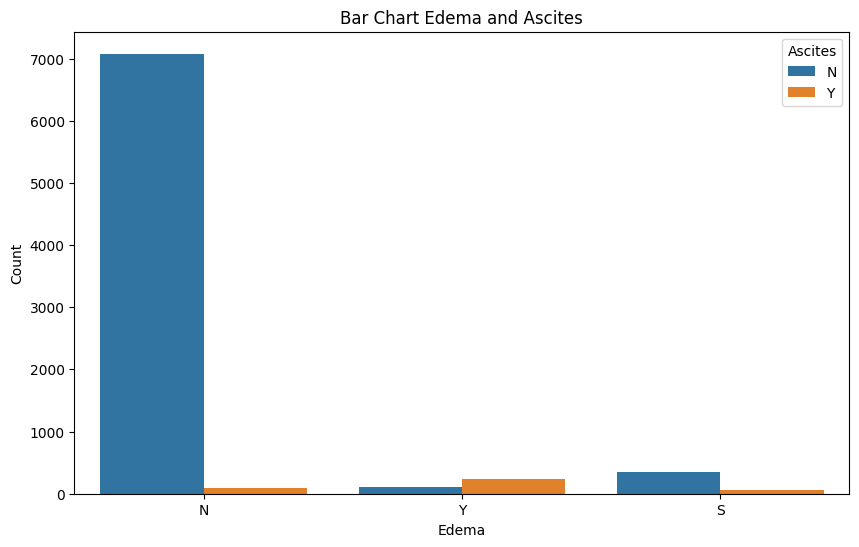

Ascites     N    Y
Edema             
N        7077   84
S         347   52
Y         101  244


In [44]:
# Bar Chart Edema and Ascites
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Edema', hue='Ascites')
plt.title('Bar Chart Edema and Ascites')
plt.xlabel('Edema')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Edema'], df_train_copy['Ascites'])
print(cross_table)

Edema vs Ascites observations:
* Most obeservations for Ascites class "N" and Edema class "N".
* Both classes are heavily unbalanced.

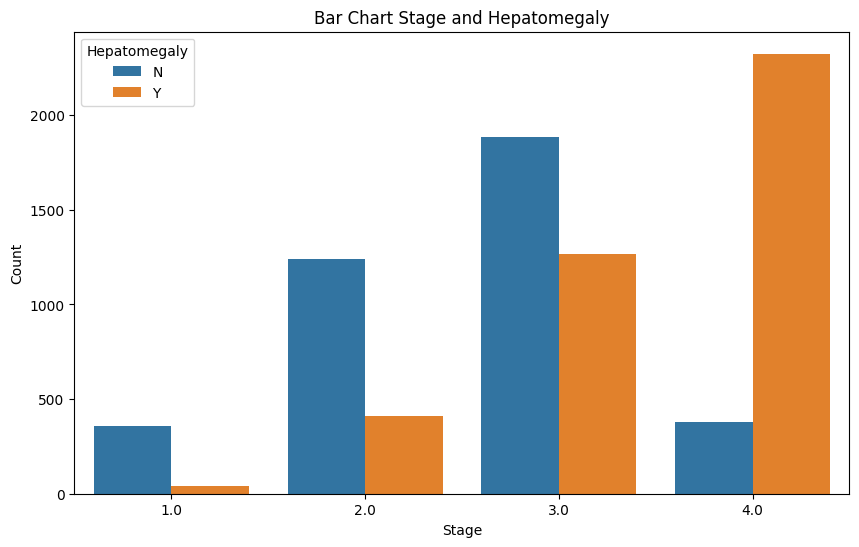

Hepatomegaly     N     Y
Stage                   
1.0            358    39
2.0           1240   412
3.0           1887  1266
4.0            378  2325


In [45]:
# Bar Chart Stage and Hepatomegaly
plt.figure(figsize=(10, 6))
sns.countplot(data=df_train_copy, x='Stage', hue='Hepatomegaly')
plt.title('Bar Chart Stage and Hepatomegaly')
plt.xlabel('Stage')
plt.ylabel('Count')
plt.show()

cross_table = pd.crosstab(df_train_copy['Stage'], df_train_copy['Hepatomegaly'])
print(cross_table)

Stage vs Hepatomegaly observations:
* Clear rising trend in Hepatomegaly class "Y".
* Hepatomegaly class "N" has a peak in stage 3, stages 1 and 4 are approximately eaqually distributed.

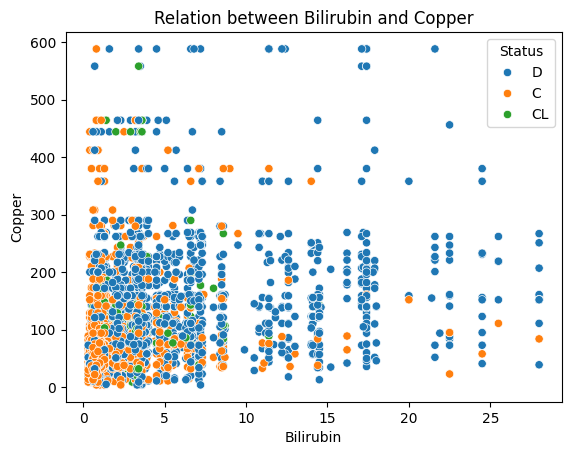

In [46]:
# Scatterplot Bilirubin vs Copper
sns.scatterplot(x="Bilirubin", y="Copper", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Bilirubin and Copper')
plt.show()

Bilirubin vs Copper observations from the scatterplot:
* Status "D" seems to be more widely distributed across the diagram than the other classes (i.e., more outliers).
* Status "C" seems to have less/no extreme outliers in both Copper and Bilirubin. If there is an outlier, then usually only either in Copper or in Bilirubin.
* Overall, the majority of data points is clustered towards the origin of the diagram, with comparably low to medium values for both Copper and Bilirubin.

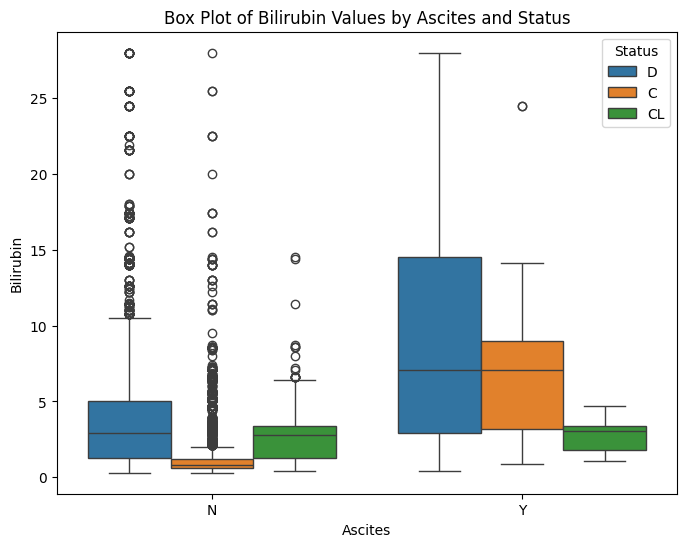

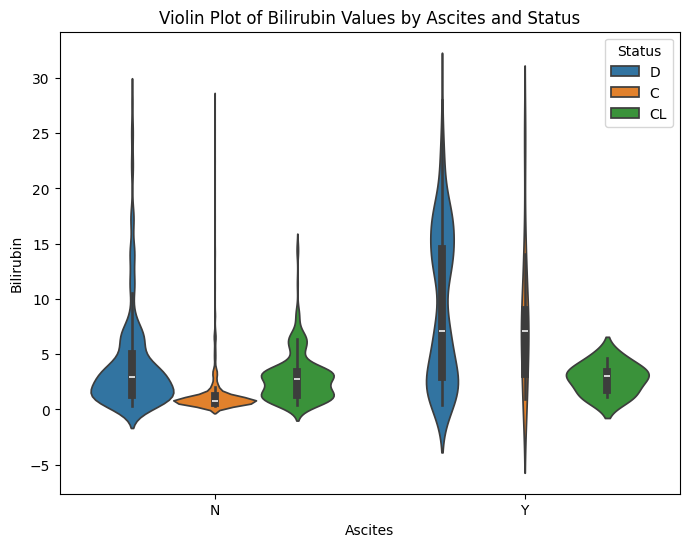

             Mean  Median
Ascites                  
N        2.265395     1.0
Y        9.111316     7.1


In [47]:
# Bilirubin values by Ascites and Status

# Box Plot Bilirubin vs Copper
plt.figure(figsize=(8, 6))
sns.boxplot(x='Ascites', y='Bilirubin', hue='Status', data=df_train_copy)
plt.title('Box Plot of Bilirubin Values by Ascites and Status')
plt.xlabel('Ascites')
plt.ylabel('Bilirubin')
plt.legend(title='Status')
plt.show()

# Violin Plot Bilirubin vs Copper
plt.figure(figsize=(8, 6))
sns.violinplot(x='Ascites', y='Bilirubin', hue='Status', data=df_train_copy)
plt.title('Violin Plot of Bilirubin Values by Ascites and Status')
plt.xlabel('Ascites')
plt.ylabel('Bilirubin')
plt.legend(title='Status')
plt.show()

# Mean and median
means = df_train_copy.groupby('Ascites')['Bilirubin'].mean()
medians = df_train_copy.groupby('Ascites')['Bilirubin'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

Bilirubin by Ascites and Status observations:
* There are major differences between Ascites categories "N" and "Y" in Bilirubin values.
* In category N, Bilirubin values have a much lower mean and median, lower variance and many (extreme) outliers.
* In category Y, Bilirubin values have a comparably higher mean and median, high variance (in Status D) and almost no outliers.

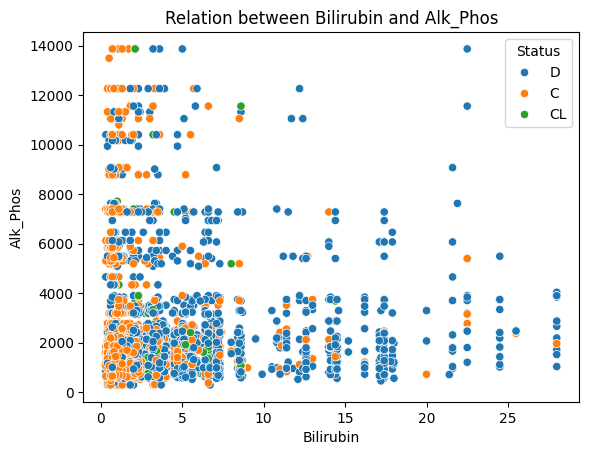

In [48]:
# Scatterplot Bilirubin vs Alk_Phos
sns.scatterplot(x="Bilirubin", y="Alk_Phos", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Bilirubin and Alk_Phos')
plt.show()

Biliribin vs Alkaline Phosphatase observations:
* Status "C" seems to be mainly clustered towards the y-axis, i.e. low Bilirubin values and high variance in Alk-Phos values.
* Overall, majority of data points is clustered towards the origin of the diagram.
* Extreme outliers with high Alk_Phos and Bilirubin values are more prevalent in status class "D"

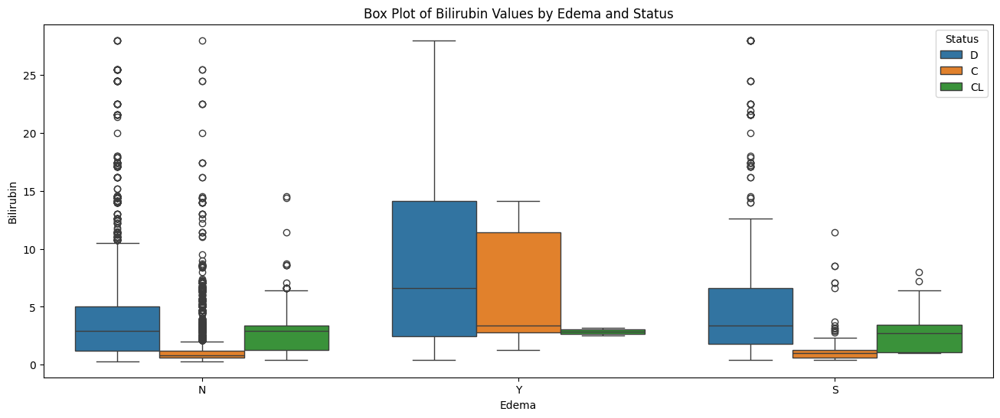

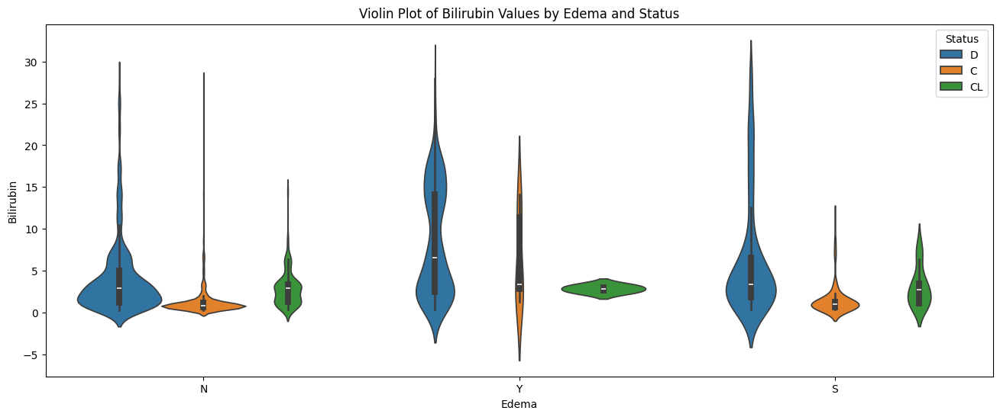

           Mean  Median
Edema                  
N      2.198841     1.0
S      4.874436     2.3
Y      8.169855     6.6


In [49]:
# Bilirubin Values by Edema and Status

# Box Plot
plt.figure(figsize=(16, 6))
sns.boxplot(x='Edema', y='Bilirubin', hue='Status', data=df_train_copy)
plt.title('Box Plot of Bilirubin Values by Edema and Status')
plt.xlabel('Edema')
plt.ylabel('Bilirubin')
plt.legend(title='Status')
plt.show()

# Violin Plot
plt.figure(figsize=(16, 6))
sns.violinplot(x='Edema', y='Bilirubin', hue='Status', data=df_train_copy)
plt.title('Violin Plot of Bilirubin Values by Edema and Status')
plt.xlabel('Edema')
plt.ylabel('Bilirubin')
plt.legend(title='Status')
plt.show()

# Mean and median
means = df_train_copy.groupby('Edema')['Bilirubin'].mean()
medians = df_train_copy.groupby('Edema')['Bilirubin'].median()
stats_df = pd.DataFrame({'Mean': means, 'Median': medians})
print(stats_df)

The plots above show high discrepancy between Edema classes and status classes in variance, distribution and outliers.

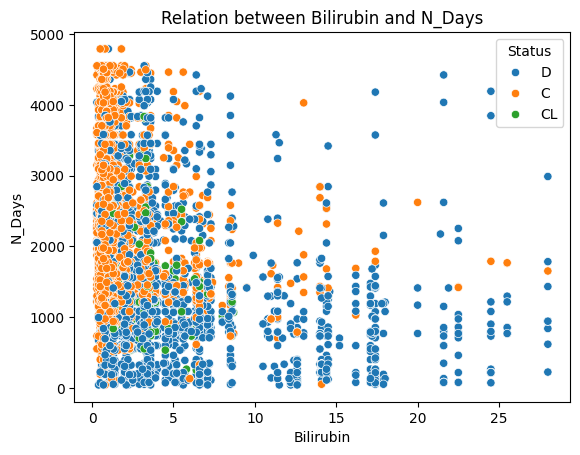

In [50]:
# Scatterplot Bilirubin vs N_Days
sns.scatterplot(x="Bilirubin", y="N_Days", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Bilirubin and N_Days')
plt.show()


Bilirubin vs N_Days observations:
* Status class C is most prevalent with low Bilirubin values and across a range of approx. 1000-4500 days.
* Status class D does not have such a dense cluster as class C, data points are more spread across the diagram, with more outliers.
* Status class D is also present in days < 1000.

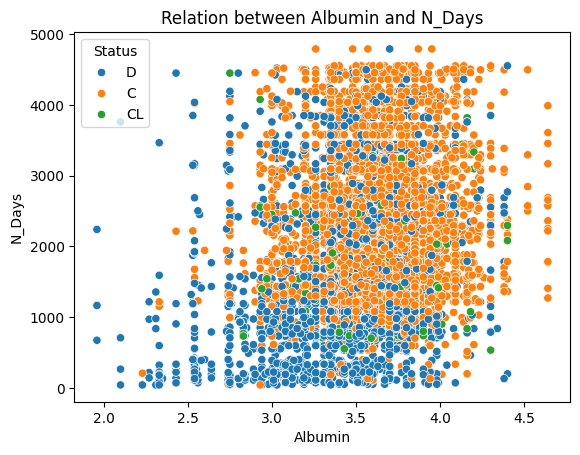

In [51]:
# Scatterplot Albumin vs N_Days
sns.scatterplot(x="Albumin", y="N_Days", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Albumin and N_Days')
plt.show()

Albumin vs N_Days observations:
* Status class "C" is more prevalent for N_Days values from approx. 1000 onwards.
* Status class "D" seems to be more prevalent for lower N_Days values.
* The majority of data points across all status classes is between 3.0 and 4.0 on the Albumin scale.
* Status class "D" seems to have more outliers towards lower Albumin values, while status class "C" seems to have more outliers towards higher Albumin values.

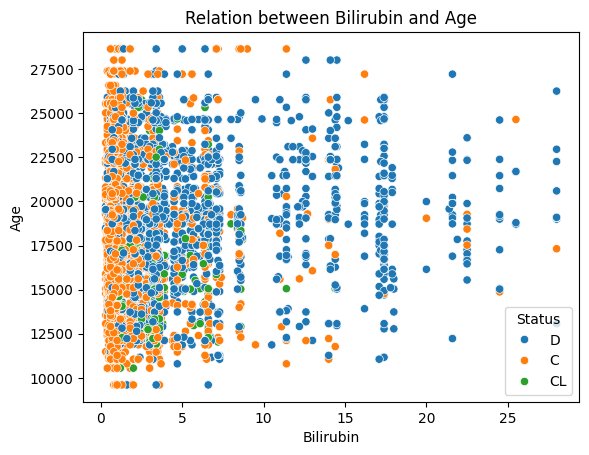

In [52]:
# Scatterplot Bilirubin vs Age
sns.scatterplot(x="Bilirubin", y="Age", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Bilirubin and Age')
plt.show()

Bilirubin vs Age observations:
* The majority of data points is clustered towards the y-axis with low Bilirubin values across different age values.
* Class "D" seems to have more outliers than the other status classes.

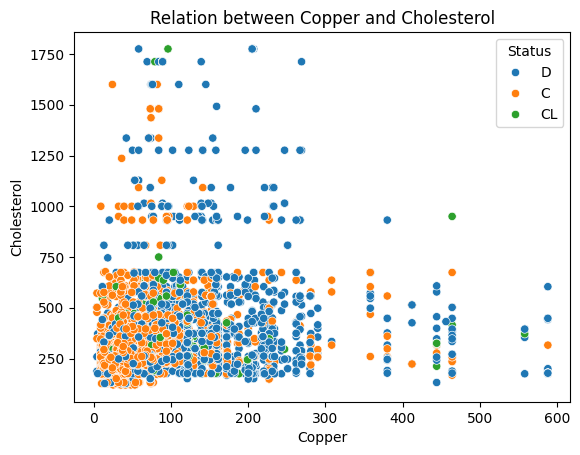

In [53]:
# Scatterplot Copper vs Cholesterol
sns.scatterplot(x="Copper", y="Cholesterol", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between Copper and Cholesterol')
plt.show()

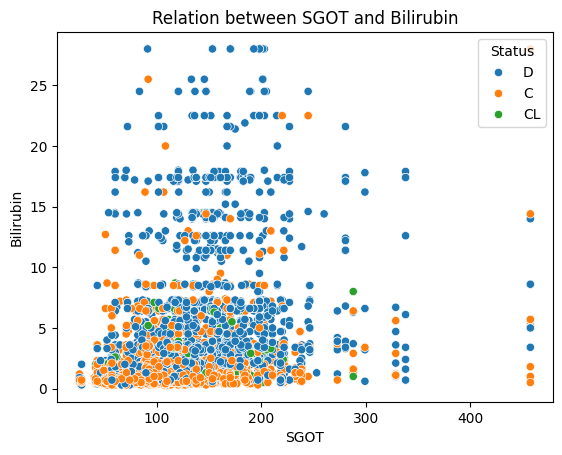

In [54]:
# Scatterplot SGOT vs Cholesterol
sns.scatterplot(x="SGOT", y="Bilirubin", hue="Status", data=df_train_copy)
plt.legend(title='Status')
plt.title('Relation between SGOT and Bilirubin')
plt.show()

## Principle Component Analysis

Principal component analysis (PCA) can unveil complexity of the data. We will explore whether a reduction in dimensionality is sensible for our dataset.

Let us fit a PCA model and see how many principal components are required to capture 95% of the variance.

In [55]:
# split data
data_X = df_train_copy_processed.drop(columns=['id', 'Status'])
data_y = df_train_copy_processed['Status']

# create train test split
data_train, data_test, data_y_train, data_y_test = train_test_split(data_X, data_y, test_size=0.2, random_state=42)

# scale data
scaler = StandardScaler()
scaler.fit(data_train)
data_scaled = scaler.transform(data_train)
data_scaled_test = scaler.transform(data_test)

# apply pca
pca = PCA(n_components=2)
pca.fit(data_scaled)
bcw_pca_x = pd.DataFrame(pca.transform(data_scaled))
bcw_pca_x.columns = ['pc1', 'pc2']

We can use a scatterplot to visualise the first two principal components:

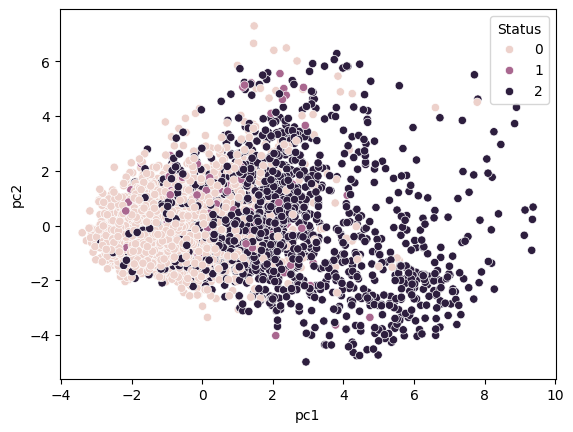

PCA explained variance ratio:


array([0.22087536, 0.09443715])

In [56]:
bcw_pca_plot = bcw_pca_x.copy(deep=True)
bcw_pca_plot['Status'] = data_y_train.reset_index(drop=True)
sns.scatterplot(data=bcw_pca_plot, x='pc1', y='pc2', hue='Status')
plt.show()

print("PCA explained variance ratio:")
pca.explained_variance_ratio_

We see clusters: Status 0 is more prevalent in the left center of the diagram, while status 2 is more prevalent in the right center of the diagram, with more variance and outliers compared to status 0.

How much variance is explained by the first two principal components?

In [57]:
print(pca.explained_variance_ratio_.sum()) # about 31.5%

0.3153125059756825


How many components do we need to explain 95% of the variance in the data?

In [58]:
pca_all = PCA(n_components=18)
pca_all.fit(data_scaled)
cumulative_sum = np.cumsum(pca_all.explained_variance_ratio_)
np.argmax(cumulative_sum > 0.95) + 1

16

Result: we need 16 out of 18 components to explain 95% of the variance.

This means that nearly all all features are important contributors in our dataset.

Dropping only 2 features to reduce dimensionality would therefore not significantly lessen the dataset's complexity.

## Conclusion: Data Exploration & PCA

General:
* Our data set consists of 7,905 rows and 20 columns.
* There are no missing values.
* Datatypes are both categorical and continous. Categorical attributes are binary or multiclass.
* Our label "Status" has three classes.

Correlation:
* There are no strong linear or non-linear relationships between features and the label, with Bilirubin (0.43) and Heptatomegagly (0.40) having the strongest linear correlation to Status.
* Ascites & Edema (0.64) and Stage & Hepatomegaly (0.50) have the strongest linear correlation in our dataset.

Distribution and Class Inbalance:
* Almost all categorical attributes, including the label, are not balanced.
* All continuous attributes have a tail-heavy distribution with outliers. Some attributes have more extreme outliers than others. Outliers are usually to the top of the scale and only sometimes to the bottom of the scale.
* As a consequence, there is a discrepancy between mean and median values for almost all continuous attributes.

PCA:
* There could be some relationship between the status of the data points and their location in the PCA plot (PCA1 vs. PCA2 scatter plot).
* The first two Principle Components explain about 30% of the total variance.
* In order to explain 95% of the total variance, we need 16 out of 18 components. Therefore, the reduction of two components will not significantly reduce the complexity of our model. It is therefore questionable whether dimension reduction is appropriate and sensible in this data set.


# **2 Imputation Methods**

**Mean/Median/Mode Imputation**

* Pros:
  * Simple and easy to implement.
  * Preserves the mean/median/mode of the observed data.
  * Can be effective for small amounts of missing data when the missingness is completely at random (MCAR).

* Cons:
  * Ignores the relationships between features.
  * May introduce bias, especially if the data is not normally d istributed or contains outliers.
  * Can underestimate the variability of the imputed values.
  * May not perform well for large amounts of missing data or when the missingness is not completely at random.


**K-Nearest Neighbors (KNN) Imputation**

* Pros:
  * Considers relationships between features by using the nearest neighbors.
  * Can handle both numerical and categorical data.
  * Robust to outliers and non-linear relationships.
  * Provides more accurate imputations compared to simple imputation methods.

* Cons:
  * Computationally expensive, especially for large datasets.
  * Sensitivity to the choice of the number of neighbors (k).
  * Requires careful preprocessing and scaling of the data.
  * May not perform well when the feature space is high-dimensional or sparse.


**Regression Imputation**

* Pros:
  * Captures complex relationships between features.
  * Provides more accurate imputations compared to simple imputation methods.
  * Can handle both numerical and categorical data.
* Cons:
  * Sensitive to the choice of the regression model.
  * Assumes a linear relationship between features, which may not hold true in all cases.
  * Can be computationally expensive for large datasets.
  * May not perform well if there are multicollinearity issues or if the data contains outliers.


**Multiple Imputation:**

* Pros:
  * Accounts for uncertainty in the imputation process.
  * Produces unbiased estimates by averaging across multiple imputed datasets.
  * Provides valid statistical inference and confidence intervals.
  * Can handle different types of missing data mechanisms (MAR, MNAR).

* Cons:
  * Requires more computational resources and time compared to single imputation methods.
  * Complexity in generating and combining multiple imputed datasets.
  * May not be suitable for all types of analyses or datasets.


**Random Forest Imputation**

* Pros:
  * Can handle both numerical and categorical data.
  * Robust to outliers and non-linear relationships.
  * Automatically handles interactions between features.
  * Provides accurate imputations even for high-dimensional data.

* Cons:
  * Computationally intensive, especially for large datasets.
  * Requires tuning of hyperparameters such as the number of trees.
  * May overfit the data if not properly regularized.


**Deep Learning-Based Imputation**

* Pros:
  * Learns complex patterns in the data and can capture non-linear relationships.
  * Suitable for high-dimensional data and large datasets.
  * Provides accurate imputations, especially for complex data structures.

* Cons:
  * Requires large amounts of data and computational resources for training.
  * Complexity in model selection, architecture design, and hyperparameter tuning.
  * May be prone to overfitting, especially for small datasets.
  * Interpretability and transparency may be limited.



---


We will assess three imputation methods:
* Mean/median imputation
* KNN Imputation
* Iterative Imputation

To test each method, we will randomly remove 5% of the data.

## 2.1 Mean Imputation


Mean/median is the simplest data imputation method which takes the mean of all the values and creates a number of missing data.

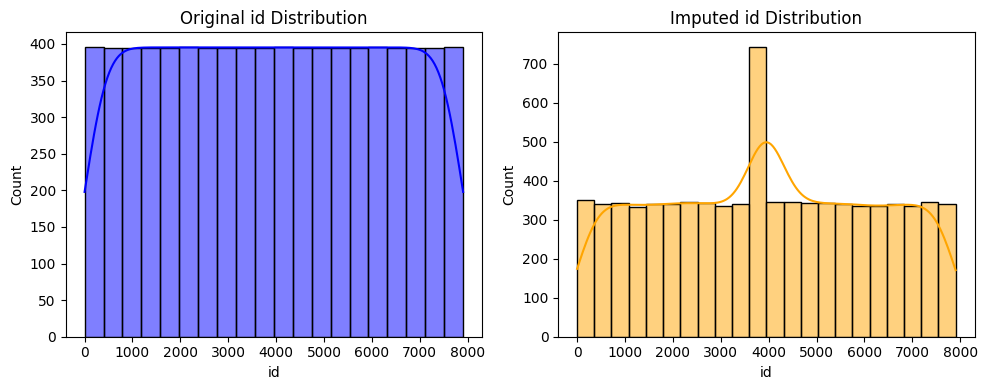

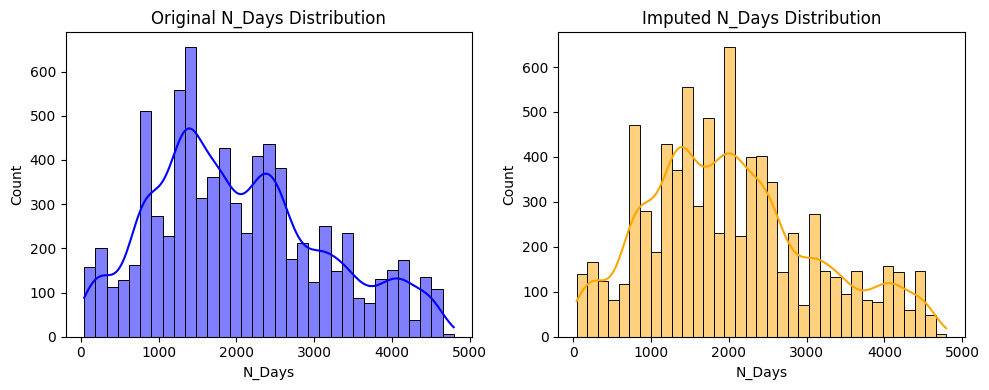

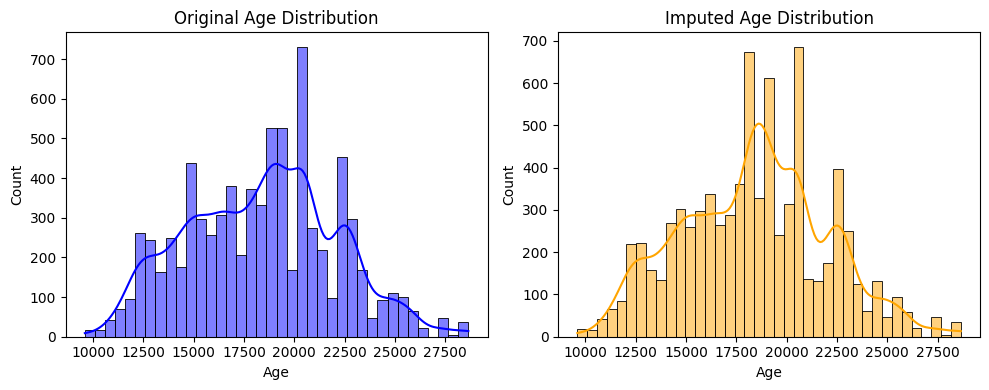

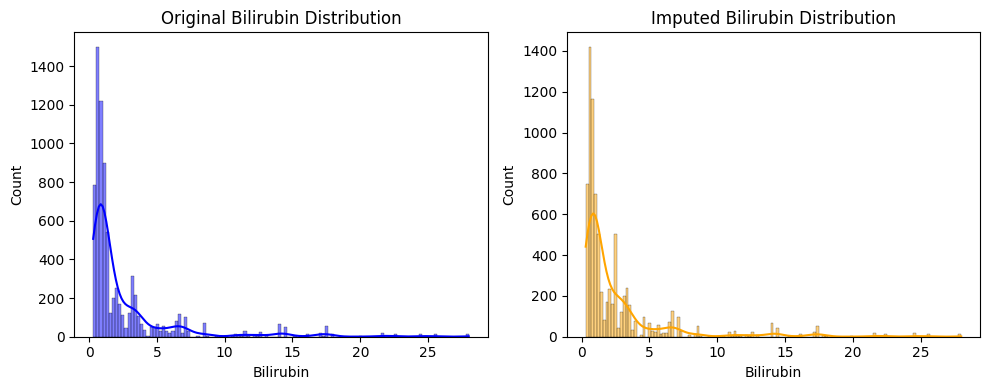

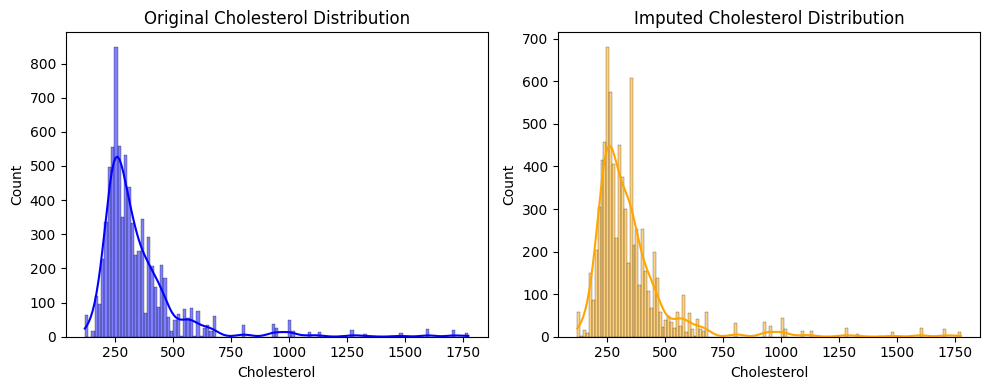

...

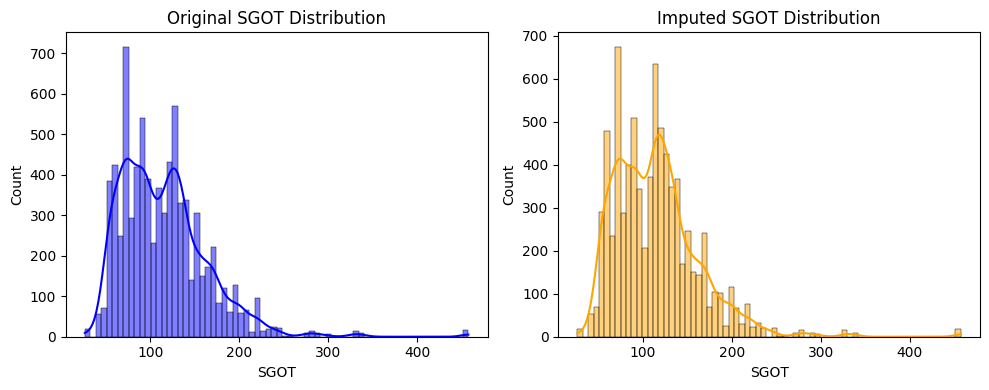

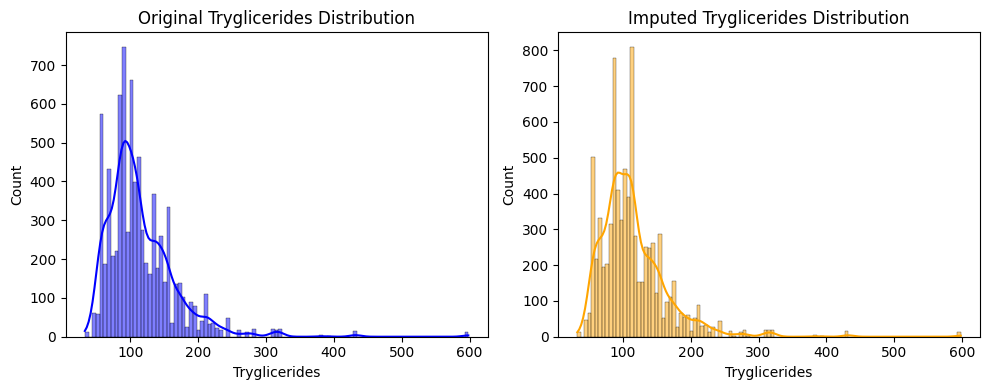

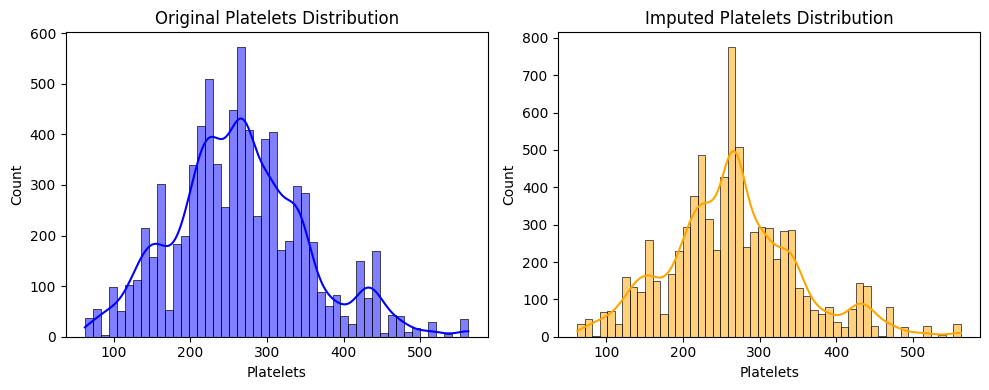

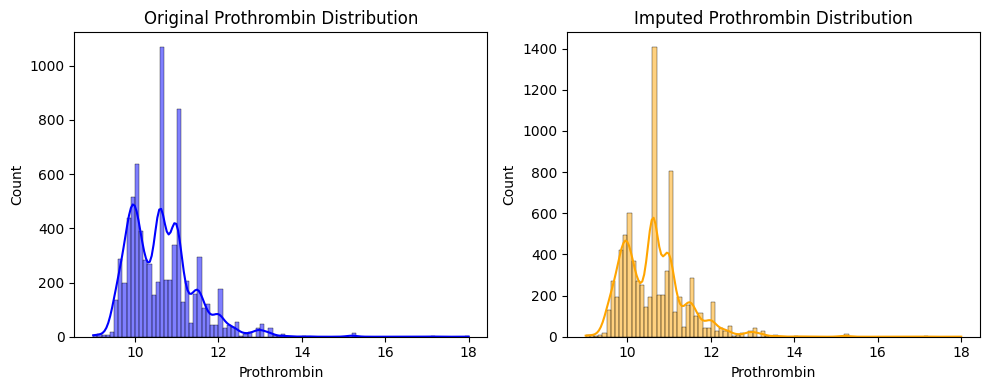

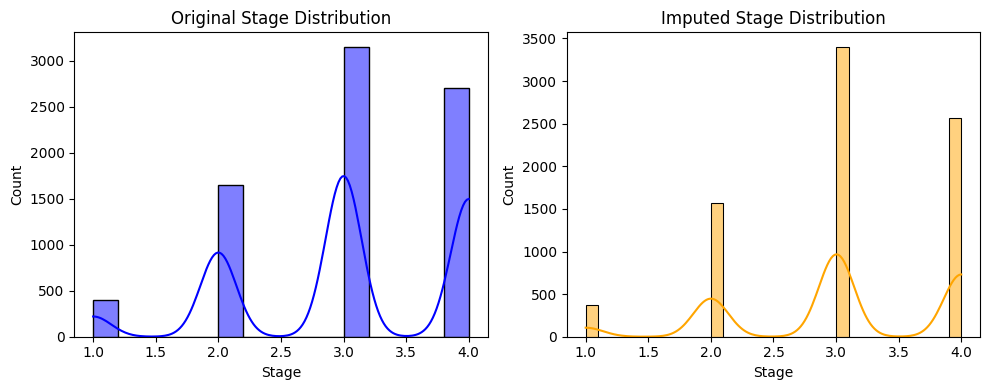

Original data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3952.000000,2030.173308,18373.146490,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511
std,2282.121272,1094.233744,3679.958739,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,1976.000000,1230.000000,15574.000000,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000
50%,3952.000000,1831.000000,18713.000000,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000
75%,5928.000000,2689.000000,20684.000000,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000



Imputed data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3945.935286,2029.038216,18375.905060,2.594727,350.667776,3.548768,84.281625,1818.035020,114.679389,115.346738,265.630892,10.628788,3.033422
std,2224.161603,1069.251422,3581.892165,3.718456,190.545262,0.337392,74.368450,1864.488947,47.788519,51.281867,85.417459,0.761750,0.842523
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,2083.000000,1250.000000,15694.000000,0.700000,251.000000,3.360000,39.000000,843.000000,77.500000,85.000000,213.000000,10.000000,3.000000
50%,3945.935286,1945.000000,18375.905060,1.100000,303.000000,3.570000,67.000000,1218.000000,111.600000,106.000000,265.630892,10.600000,3.000000
75%,5808.000000,2615.000000,20604.000000,2.800000,376.000000,3.760000,96.000000,1833.000000,137.950000,137.000000,311.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000


In [59]:
#copy of the original data
original_data = df_train
original_data_copy = original_data.copy()
#-------------------------------------------------------------------------------------#
#proportion of data to be removed
missing_proportion = 0.05  # 5% of data to be removed

#Randomly select indices to remove
missing_indices = np.random.choice(original_data.index, size=int(len(original_data) * missing_proportion), replace=False)

original_data_copy.loc[missing_indices] = np.nan
 #-------------------------------------------------------------------------------------#
numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),  # Imputation using mean
])

preprocessing_pipeline = ColumnTransformer([
    ('numeric', numeric_pipeline, original_data_copy.select_dtypes(include=[np.number]).columns)
])
#-------------------------------------------------------------------------------------#
imputed_data = preprocessing_pipeline.fit_transform(original_data_copy)


transformed_columns = preprocessing_pipeline.transformers_[0][2]

# Convert the imputed data back to a DataFrame with original column names
imputed_df = pd.DataFrame(imputed_data, columns=transformed_columns)
#-------------------------------------------------------------------------------------#
# Visual Comparison: Histograms
for column in original_data.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(original_data[column].dropna(), color='blue', kde=True)
    plt.title(f'Original {column} Distribution')

    plt.subplot(1, 2, 2)
    sns.histplot(imputed_df[column], color='orange', kde=True)
    plt.title(f'Imputed {column} Distribution')

    plt.tight_layout()
    plt.show()
#-------------------------------------------------------------------------------------#
# Statistical Summary Comparison
print("Original data summary statistics:")
display(HTML(original_data.describe().to_html()))

print("\nImputed data summary statistics:")
display(HTML(imputed_df.describe().to_html()))

## 2.2 K-Nearest neighbours imputaion method

Without one hot encoding as it is not required for KNN Imputation, try for different values of N nearest neighbours.

**K = 5:**

In [60]:
#data
train_data = df_train

#copy of the training data
train_data_copy = df_train.copy()

#proportion of data to be removed
missing_proportion = 0.05  # 5% of data to be removed

missing_indices = np.random.choice(train_data.index, size=int(len(train_data) * missing_proportion), replace=False)

# Remove values at selected indices
train_data_copy.loc[missing_indices] = np.nan
#-------------------------------------------------------------------------------------#

categorical_attributes = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Edema"]

# Define pipeline
numeric_pipeline = Pipeline([
    ('imputer', KNNImputer(n_neighbors=5)),  # Imputation using KNN
])

preprocessing_pipeline = ColumnTransformer([
    ('numeric', numeric_pipeline, train_data_copy.select_dtypes(include=[np.number]).columns)
])

#-------------------------------------------------------------------------------------#
imputed_data = preprocessing_pipeline.fit_transform(train_data_copy)

transformed_columns = preprocessing_pipeline.transformers_[0][2]

imputed_df = pd.DataFrame(imputed_data, columns=transformed_columns)

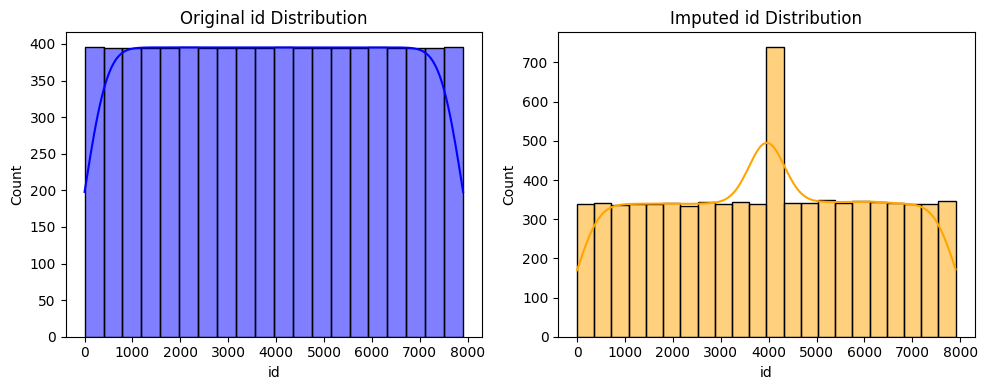

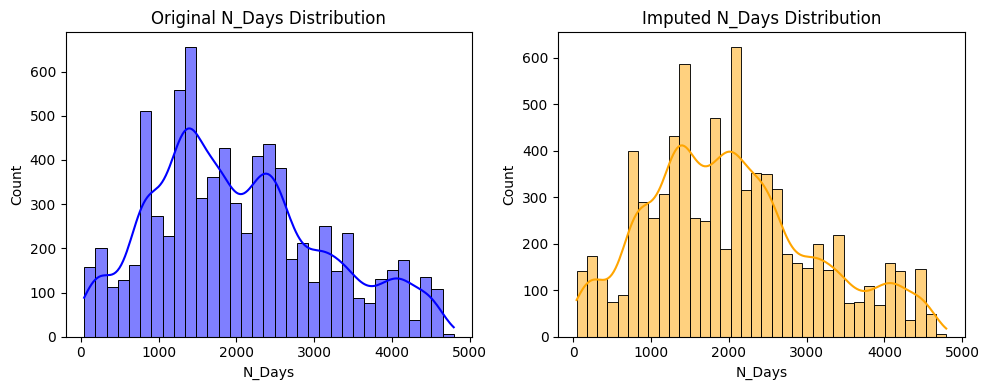

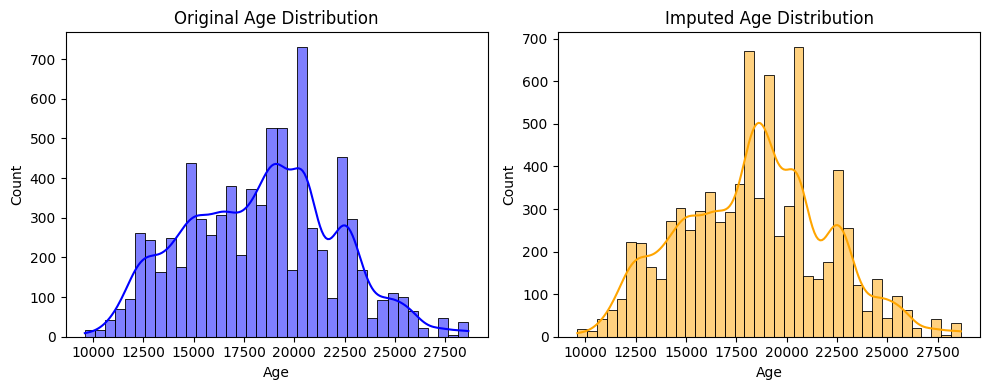

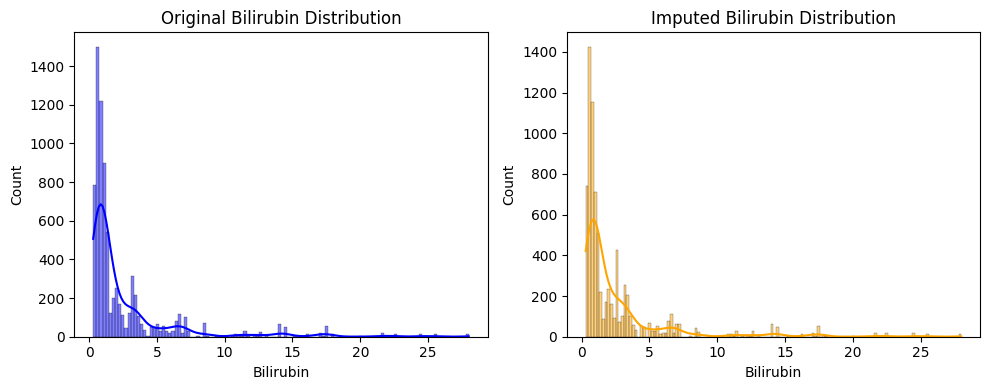

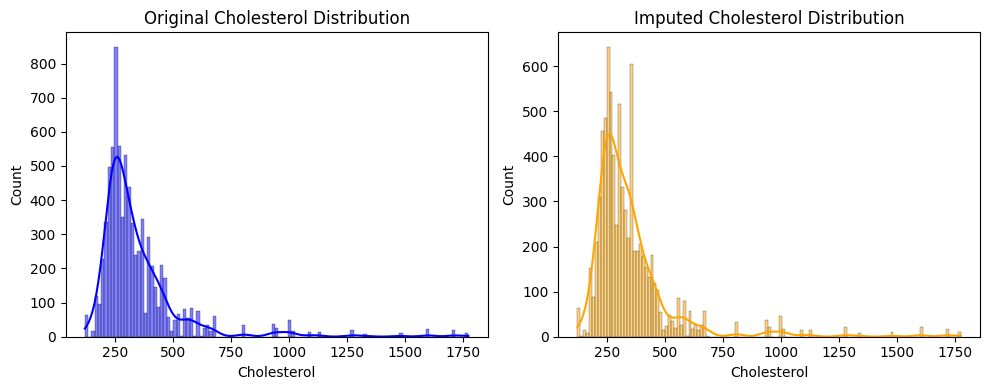

...

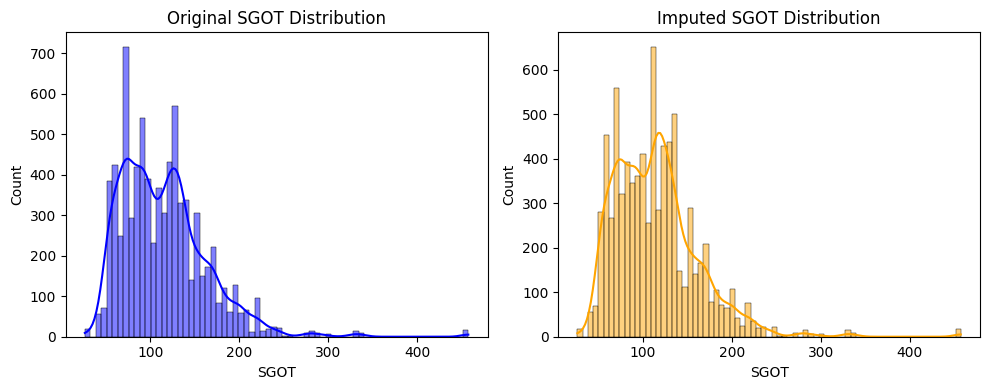

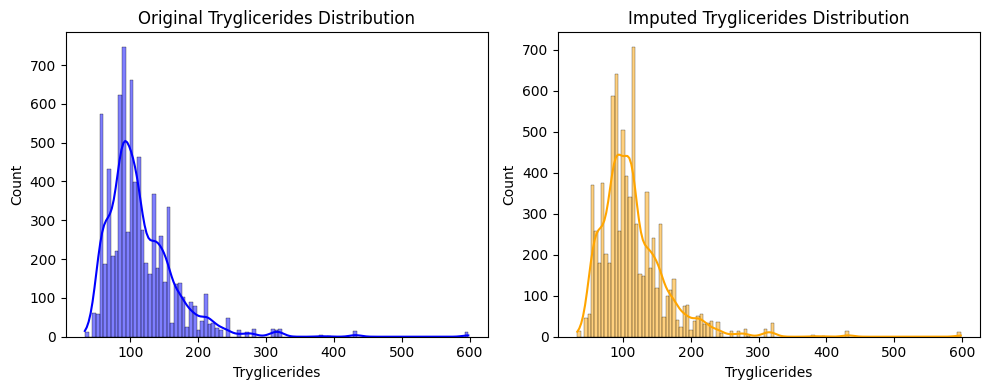

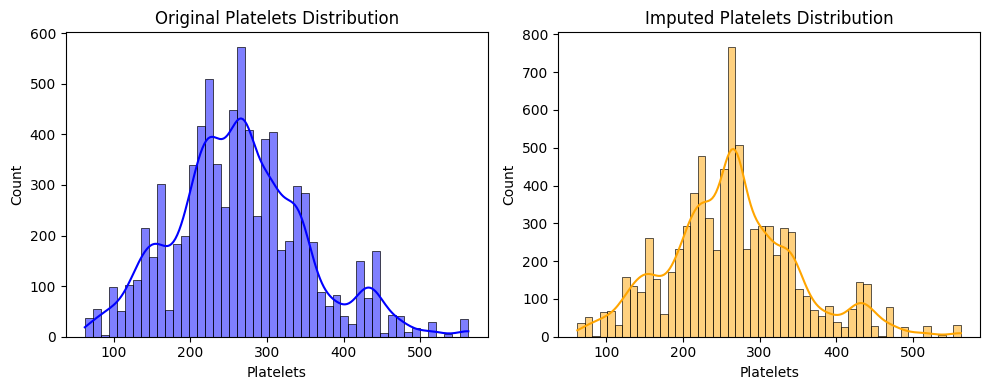

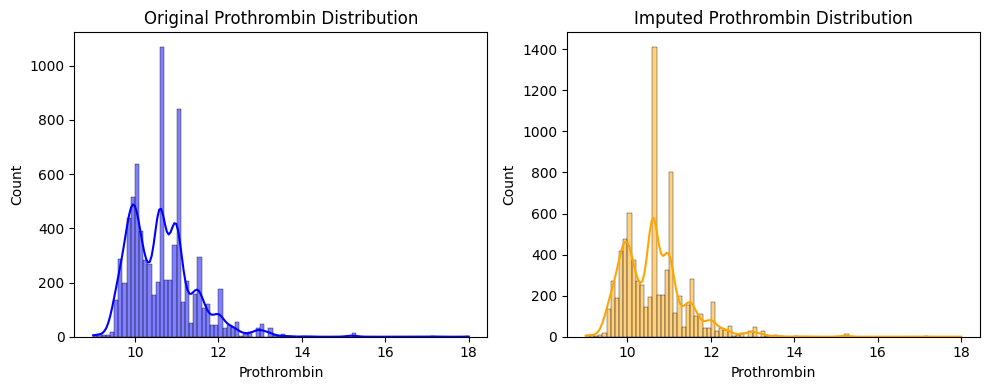

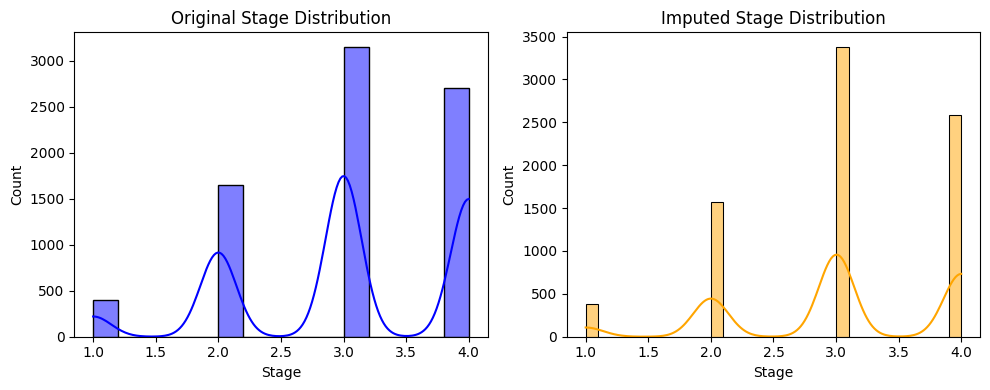

Original data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3952.000000,2030.173308,18373.146490,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511
std,2282.121272,1094.233744,3679.958739,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,1976.000000,1230.000000,15574.000000,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000
50%,3952.000000,1831.000000,18713.000000,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000
75%,5928.000000,2689.000000,20684.000000,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000



Imputed data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3960.200399,2031.139947,18372.487883,2.604035,350.671105,3.547454,83.993209,1820.075153,114.700915,115.105726,265.156591,10.633236,3.034088
std,2222.704770,1067.796139,3580.758845,3.736799,191.104926,0.337539,73.923957,1860.980626,47.689181,50.926355,85.350353,0.763511,0.845720
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,2090.000000,1271.000000,15694.000000,0.700000,250.000000,3.360000,39.000000,843.000000,79.050000,85.000000,213.000000,10.000000,3.000000
50%,3960.200399,1951.000000,18372.487883,1.100000,303.000000,3.560000,67.000000,1218.000000,112.000000,106.000000,265.156591,10.600000,3.000000
75%,5832.000000,2615.000000,20604.000000,2.700000,376.000000,3.760000,96.000000,1833.000000,137.950000,135.000000,311.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000


In [61]:
#original data
original_data = df_train.copy()

# copy of the original data
original_data_copy = original_data.copy()

#data with missing values
missing_data = imputed_df
#-------------------------------------------------------------------------------------#
#categorical attributes
categorical_attributes = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Edema"]

#-------------------------------------------------------------------------------------#
imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(missing_data.select_dtypes(include=[np.number]))
imputed_df = pd.DataFrame(imputed_data, columns=missing_data.select_dtypes(include=[np.number]).columns)
#-------------------------------------------------------------------------------------#
# Visual Comparison: Histograms
for column in original_data.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(original_data[column].dropna(), color='blue', kde=True)
    plt.title(f'Original {column} Distribution')

    plt.subplot(1, 2, 2)
    sns.histplot(imputed_df[column], color='orange', kde=True)
    plt.title(f'Imputed {column} Distribution')

    plt.tight_layout()
    plt.show()
#-------------------------------------------------------------------------------------#
# Statistical Summary Comparison
print("Original data summary statistics:")
display(HTML(original_data.describe().to_html()))

print("\nImputed data summary statistics:")
display(HTML(imputed_df.describe().to_html()))

**K = 10:**

In [62]:
#data
train_data = df_train

#copy of the training data
train_data_copy = train_data.copy()
#-------------------------------------------------------------------------------------#
#proportion of data to be removed
missing_proportion = 0.05  # 5% of data to be removed

missing_indices = np.random.choice(train_data.index, size=int(len(train_data) * missing_proportion), replace=False)

# Remove values at selected indices
train_data_copy.loc[missing_indices] = np.nan

#-------------------------------------------------------------------------------------#
categorical_attributes = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Edema"]

#pipeline
numeric_pipeline = Pipeline([
    ('imputer', KNNImputer(n_neighbors=10)),  # Imputation using KNN

])
preprocessing_pipeline = ColumnTransformer([
    ('numeric', numeric_pipeline, train_data_copy.select_dtypes(include=[np.number]).columns)
])
#-------------------------------------------------------------------------------------#
imputed_data = preprocessing_pipeline.fit_transform(train_data_copy)

transformed_columns = preprocessing_pipeline.transformers_[0][2]

imputed_df = pd.DataFrame(imputed_data, columns=transformed_columns)

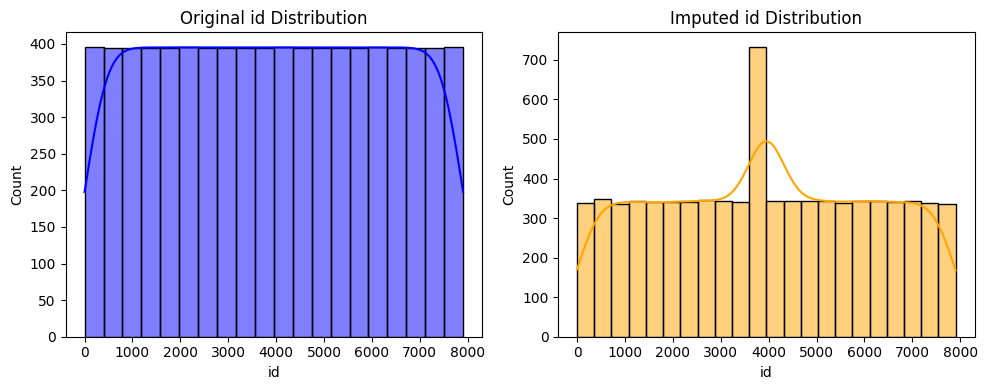

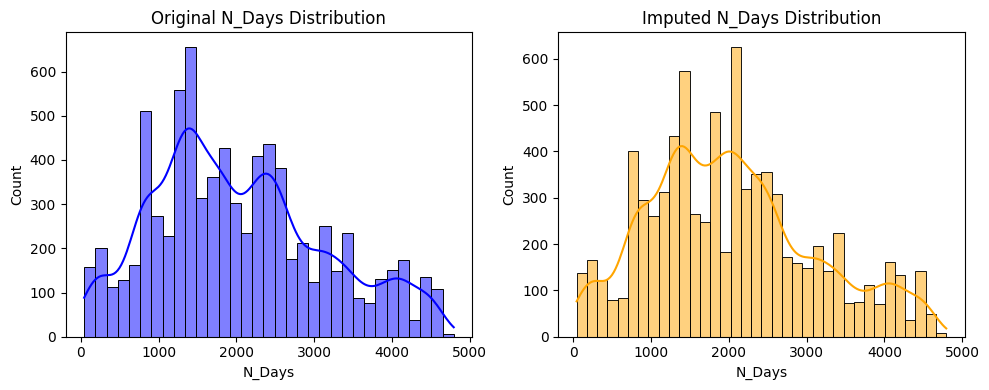

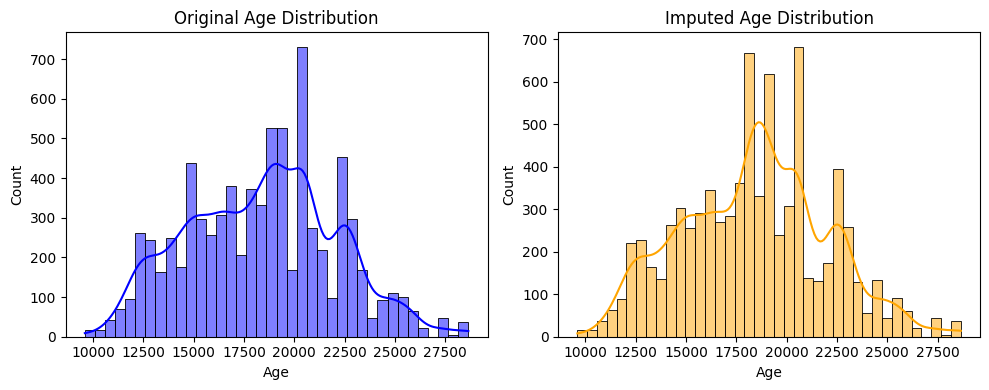

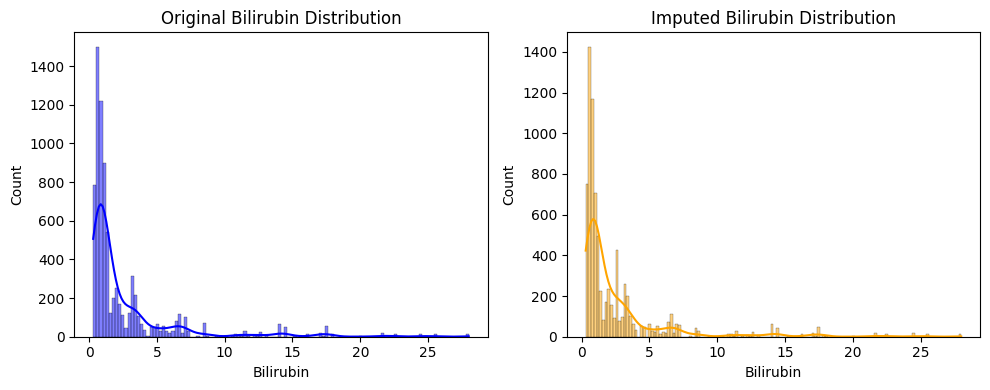

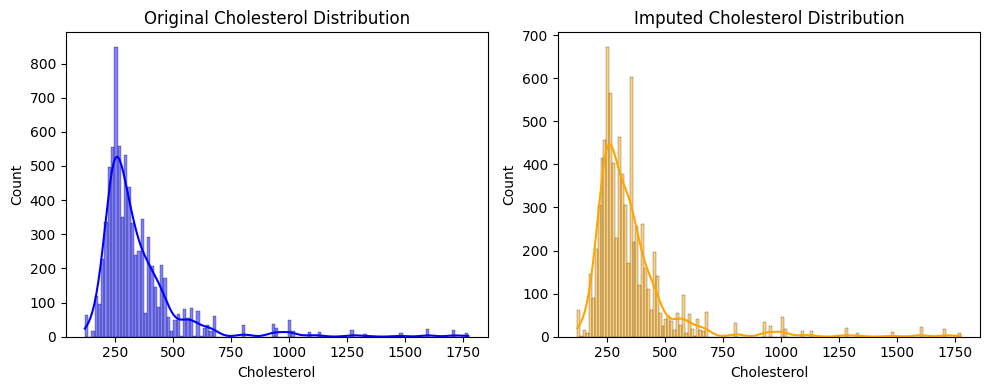

...

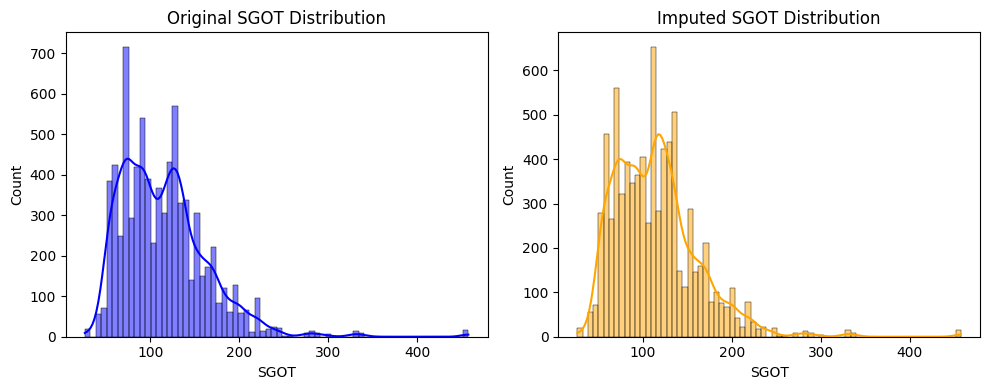

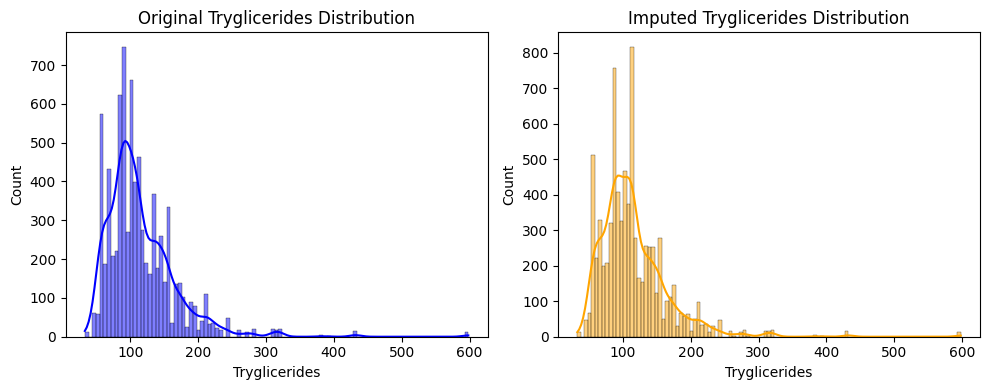

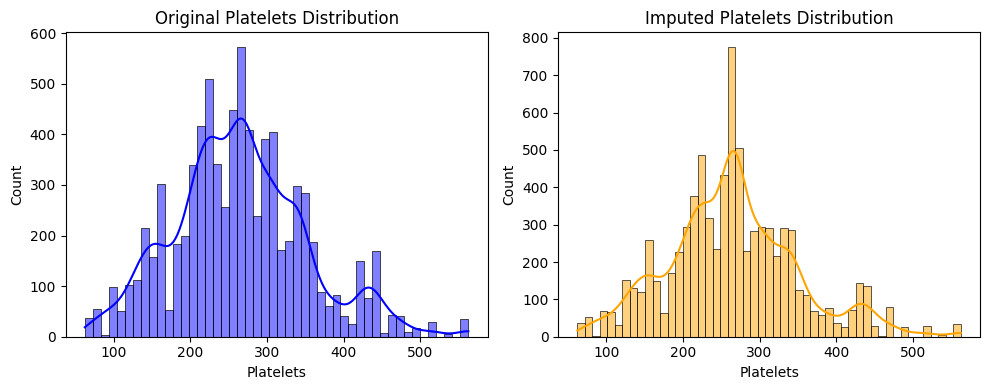

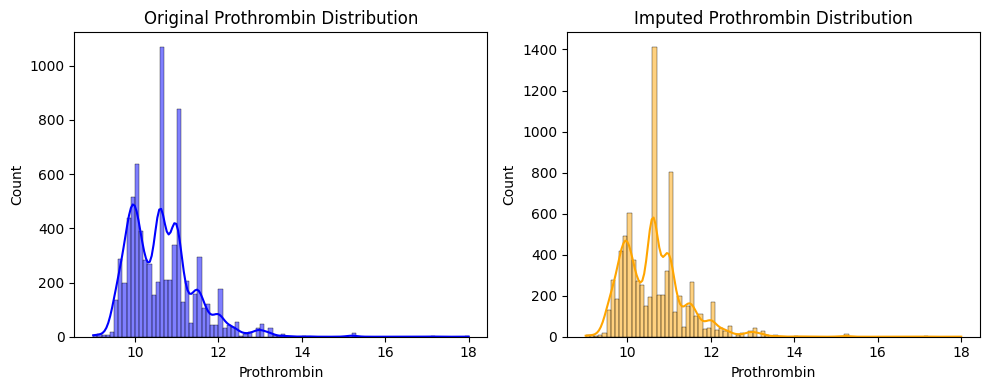

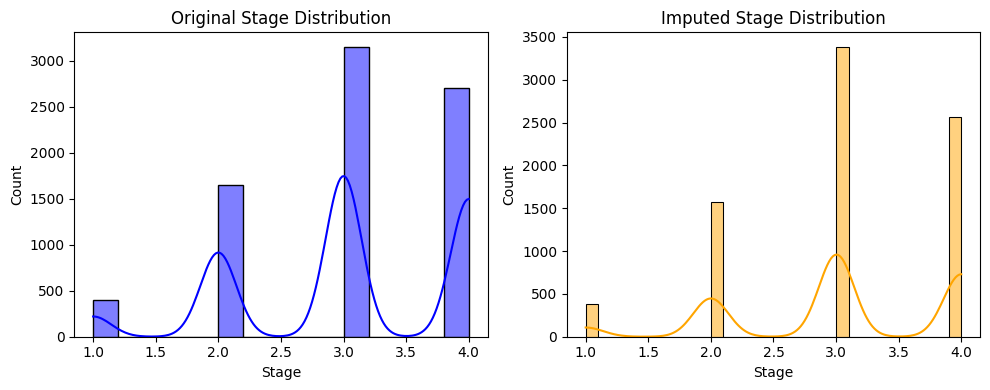

Original data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3952.000000,2030.173308,18373.146490,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511
std,2282.121272,1094.233744,3679.958739,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,1976.000000,1230.000000,15574.000000,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000
50%,3952.000000,1831.000000,18713.000000,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000
75%,5928.000000,2689.000000,20684.000000,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000



Imputed data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3948.598402,2030.623968,18375.722636,2.591598,350.448602,3.549936,83.730892,1825.980666,114.489088,115.389481,265.354993,10.626072,3.031558
std,2220.709463,1064.641339,3582.673017,3.725837,189.756585,0.337551,74.091489,1873.686619,47.301147,51.449463,85.294156,0.759571,0.845439
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,2086.000000,1271.000000,15694.000000,0.700000,251.000000,3.360000,39.000000,843.000000,79.050000,85.000000,213.000000,10.000000,3.000000
50%,3948.598402,1945.000000,18375.722636,1.100000,303.000000,3.570000,67.000000,1218.000000,111.600000,106.000000,265.354993,10.600000,3.000000
75%,5817.000000,2615.000000,20604.000000,2.700000,376.000000,3.760000,96.000000,1833.000000,137.950000,137.000000,311.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000


In [63]:
#original data
original_data = df_train

#copy of the original data
original_data_copy = original_data.copy()

#data with missing values
missing_data = imputed_df

#categorical attributes
categorical_attributes = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Edema"]

#-------------------------------------------------------------------------------------#
imputer = KNNImputer(n_neighbors=5)
imputed_data = imputer.fit_transform(missing_data.select_dtypes(include=[np.number]))

imputed_df = pd.DataFrame(imputed_data, columns=missing_data.select_dtypes(include=[np.number]).columns)
#-------------------------------------------------------------------------------------#
# Visual Comparison: Histograms
for column in original_data.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(original_data[column].dropna(), color='blue', kde=True)
    plt.title(f'Original {column} Distribution')

    plt.subplot(1, 2, 2)
    sns.histplot(imputed_df[column], color='orange', kde=True)
    plt.title(f'Imputed {column} Distribution')

    plt.tight_layout()
    plt.show()
#-------------------------------------------------------------------------------------#
# Statistical Summary Comparison
print("Original data summary statistics:")
display(HTML(original_data.describe().to_html()))

print("\nImputed data summary statistics:")
display(HTML(imputed_df.describe().to_html()))

## 2.3 Multivariate/iterative imputation

Multivariate imputation, on the other hand, focuses on imputing missing values in a multivariate manner, taking into account relationships among variables in the dataset. The goal of multivariate imputation is to impute missing values for all variables simultaneously, leveraging correlations and dependencies among variables to improve imputation accuracy. Techniques such as regression imputation, predictive mean matching, and iterative imputation fall under the umbrella of multivariate imputation. The iterative imputation approach, in particular, involves iteratively imputing missing values for all variables using models that incorporate information from other variables in the dataset. Multivariate imputation does not necessarily generate multiple imputed datasets; instead, it focuses on imputing missing values in a way that preserves relationships among variables.

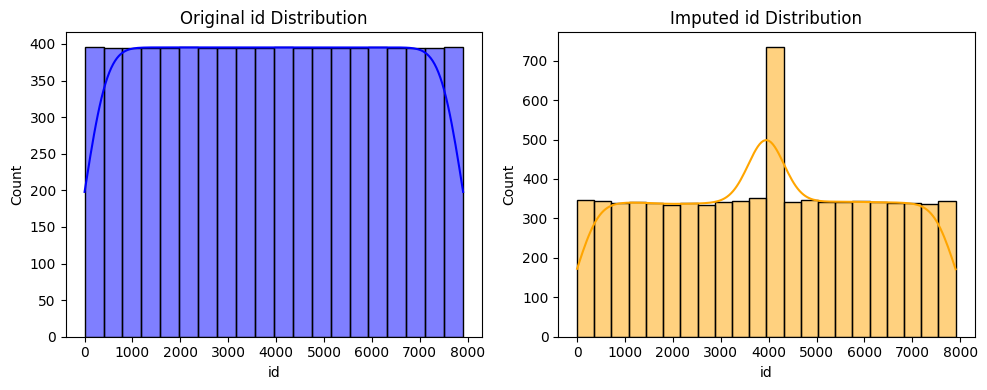

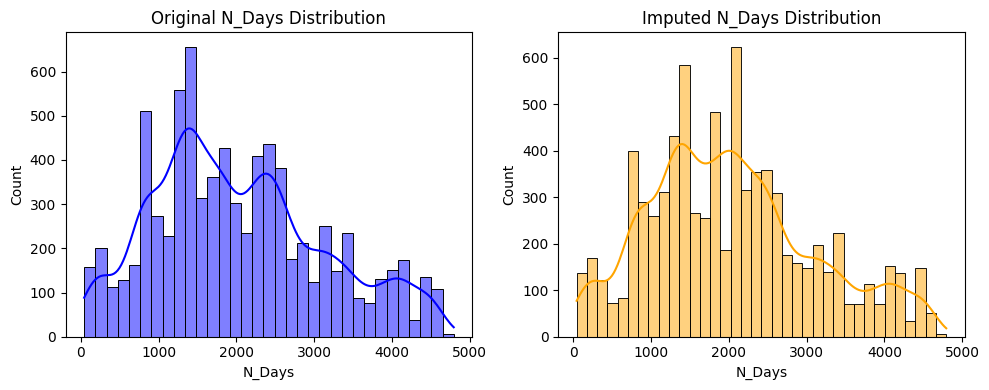

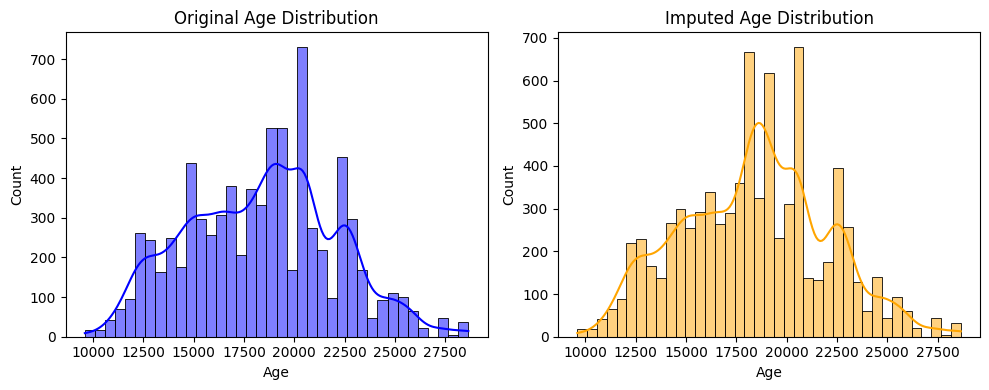

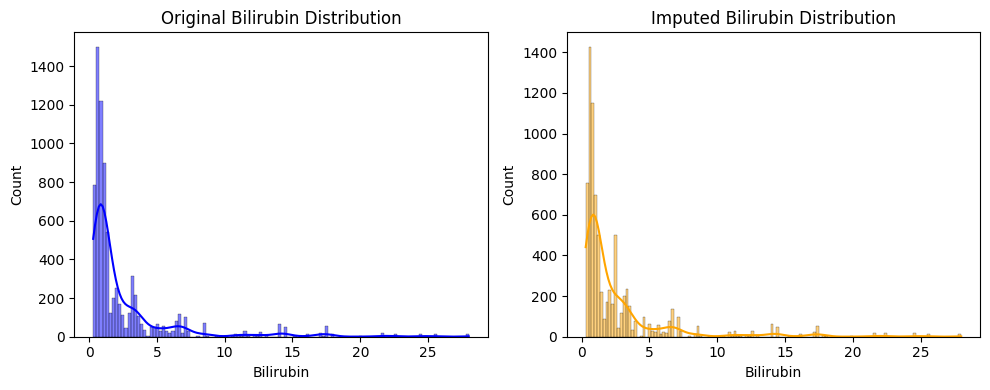

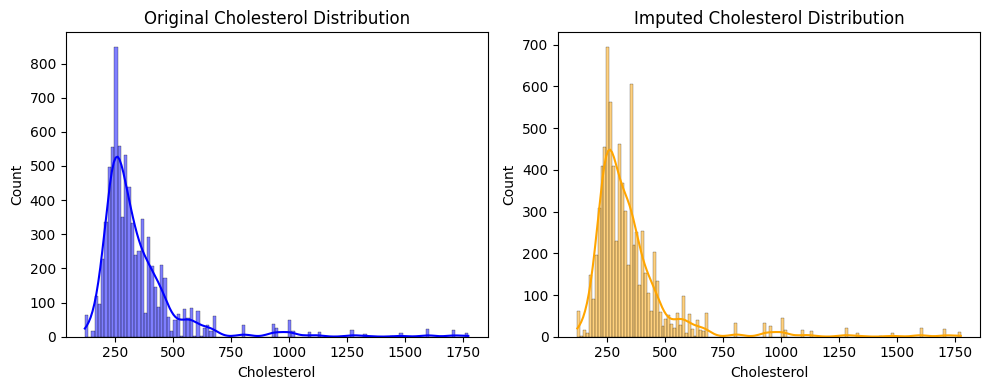

...

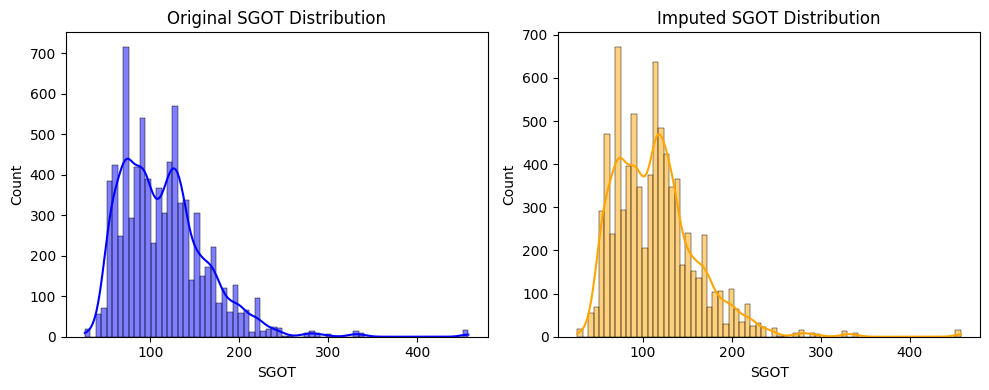

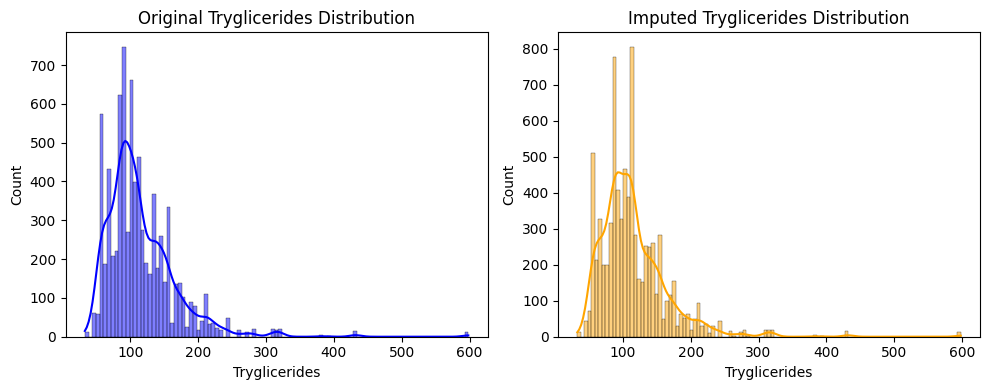

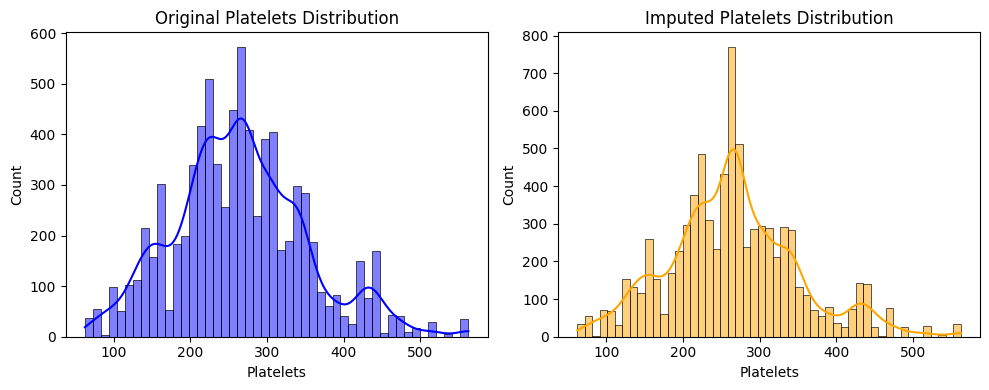

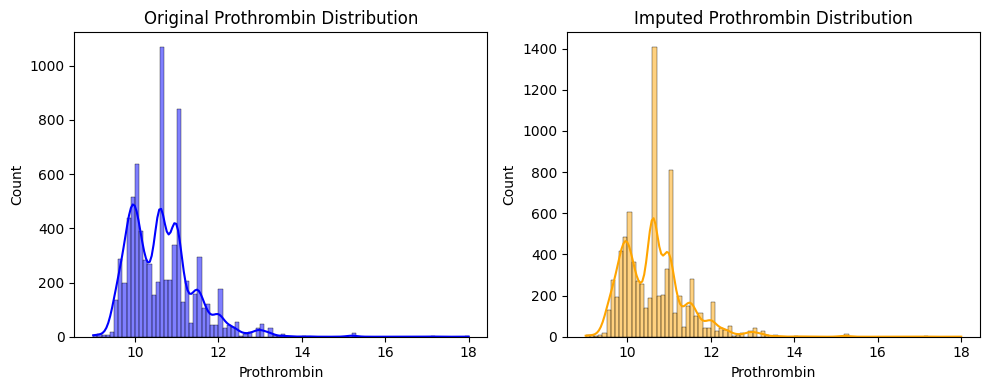

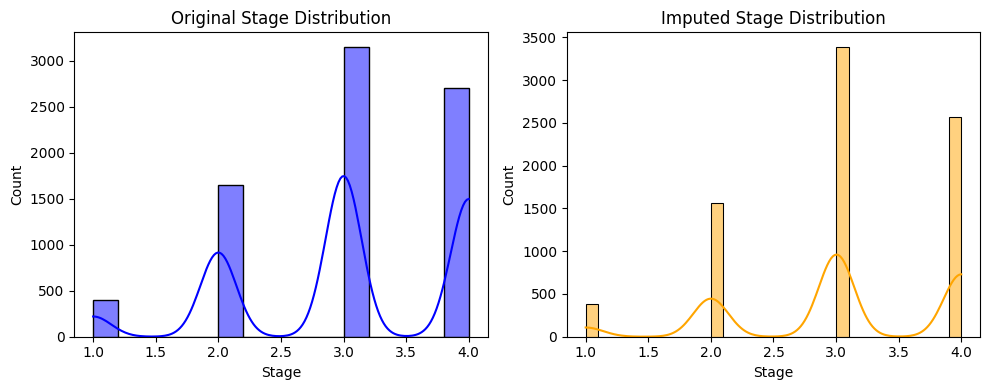

Original data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3952.000000,2030.173308,18373.146490,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511
std,2282.121272,1094.233744,3679.958739,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,1976.000000,1230.000000,15574.000000,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000
50%,3952.000000,1831.000000,18713.000000,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000
75%,5928.000000,2689.000000,20684.000000,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000



Imputed data summary statistics:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3953.338748,2031.733688,18372.701198,2.607031,350.900799,3.549186,84.037284,1813.420959,114.580563,115.480293,265.255925,10.630293,3.032091
std,2223.171705,1064.412680,3594.543373,3.744266,191.938528,0.337330,74.453600,1846.420652,47.623114,51.365775,85.167990,0.763245,0.845270
min,0.000000,41.000000,9598.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000
25%,2085.000000,1271.000000,15628.000000,0.700000,251.000000,3.360000,39.000000,843.000000,77.500000,85.000000,213.000000,10.000000,3.000000
50%,3953.338748,1945.000000,18372.701198,1.100000,303.000000,3.570000,67.000000,1218.000000,111.600000,106.000000,265.255925,10.600000,3.000000
75%,5818.000000,2615.000000,20604.000000,2.800000,376.000000,3.760000,96.000000,1828.000000,137.950000,137.000000,311.000000,11.000000,4.000000
max,7904.000000,4795.000000,28650.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000



Original data correlation matrix:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
id,1.000000,-0.011638,-0.008351,0.007194,-0.011046,-0.019808,0.008203,-0.004393,0.020395,-0.006650,-0.007707,0.007979,-0.011391
N_Days,-0.011638,1.000000,-0.102354,-0.346434,-0.145811,0.255724,-0.284355,-0.030874,-0.240918,-0.186453,0.147626,-0.156032,-0.216820
Age,-0.008351,-0.102354,1.000000,0.099016,-0.053876,-0.114848,0.095199,0.025879,-0.020768,0.021767,-0.094822,0.141705,0.118294
Bilirubin,0.007194,-0.346434,0.099016,1.000000,0.302153,-0.303191,0.442223,0.131317,0.368653,0.315681,-0.081987,0.294325,0.200134
Cholesterol,-0.011046,-0.145811,-0.053876,0.302153,1.000000,-0.091830,0.168266,0.129131,0.326864,0.274044,0.091455,0.023761,0.037372
Albumin,-0.019808,0.255724,-0.114848,-0.303191,-0.091830,1.000000,-0.218479,-0.083582,-0.200928,-0.112304,0.141284,-0.204600,-0.233245
Copper,0.008203,-0.284355,0.095199,0.442223,0.168266,-0.218479,1.000000,0.124058,0.323226,0.290435,-0.107894,0.238771,0.182007
Alk_Phos,-0.004393,-0.030874,0.025879,0.131317,0.129131,-0.083582,0.124058,1.000000,0.128746,0.087789,0.047869,0.079517,0.061326
SGOT,0.020395,-0.240918,-0.020768,0.368653,0.326864,-0.200928,0.323226,0.128746,1.000000,0.155287,-0.042004,0.136766,0.118419
Tryglicerides,-0.006650,-0.186453,0.021767,0.315681,0.274044,-0.112304,0.290435,0.087789,0.155287,1.000000,0.006511,0.063582,0.073614



Imputed data correlation matrix:


,id,N_Days,Age,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
id,1.000000,-0.009199,-0.007881,0.006991,-0.009913,-0.020412,0.007866,-0.004635,0.022682,-0.007229,-0.006508,0.007889,-0.013121
N_Days,-0.009199,1.000000,-0.103214,-0.346326,-0.145037,0.255825,-0.285735,-0.028773,-0.239179,-0.191580,0.148205,-0.159387,-0.214774
Age,-0.007881,-0.103214,1.000000,0.097176,-0.054183,-0.114645,0.092136,0.026300,-0.023003,0.020852,-0.094177,0.141083,0.115955
Bilirubin,0.006991,-0.346326,0.097176,1.000000,0.300218,-0.303638,0.442946,0.133580,0.369716,0.314137,-0.081846,0.294816,0.197106
Cholesterol,-0.009913,-0.145037,-0.054183,0.300218,1.000000,-0.092446,0.165612,0.132542,0.323667,0.273575,0.091549,0.025942,0.035849
Albumin,-0.020412,0.255825,-0.114645,-0.303638,-0.092446,1.000000,-0.220592,-0.083923,-0.200208,-0.111283,0.145243,-0.205750,-0.235316
Copper,0.007866,-0.285735,0.092136,0.442946,0.165612,-0.220592,1.000000,0.126027,0.324662,0.288157,-0.105649,0.241448,0.183165
Alk_Phos,-0.004635,-0.028773,0.026300,0.133580,0.132542,-0.083923,0.126027,1.000000,0.133449,0.086989,0.048100,0.082060,0.056952
SGOT,0.022682,-0.239179,-0.023003,0.369716,0.323667,-0.200208,0.324662,0.133449,1.000000,0.155946,-0.042821,0.138866,0.122507
Tryglicerides,-0.007229,-0.191580,0.020852,0.314137,0.273575,-0.111283,0.288157,0.086989,0.155946,1.000000,0.007054,0.064068,0.074496


In [64]:
#data
original_data = df_train

#copy of the original data
original_data_copy = original_data.copy()

# Set a proportion of data to be removed
missing_proportion = 0.05  # 5% of data to be removed

missing_indices = np.random.choice(original_data.index, size=int(len(original_data) * missing_proportion), replace=False)

original_data_copy.loc[missing_indices] = np.nan
#-------------------------------------------------------------------------------------#
categorical_attributes = ["Drug", "Sex", "Ascites", "Hepatomegaly", "Spiders", "Edema"]

#pipeline
numeric_pipeline = Pipeline([
    ('imputer', IterativeImputer()),  # Imputation using iterative imputer
])

preprocessing_pipeline = ColumnTransformer([
    ('numeric', numeric_pipeline, original_data_copy.select_dtypes(include=[np.number]).columns)
])
#-------------------------------------------------------------------------------------#

imputed_data = preprocessing_pipeline.fit_transform(original_data_copy)

transformed_columns = preprocessing_pipeline.transformers_[0][2]

imputed_df = pd.DataFrame(imputed_data, columns=transformed_columns)
#-------------------------------------------------------------------------------------#
# Visual Comparison: Histograms
for column in original_data.select_dtypes(include=[np.number]).columns:
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(original_data[column].dropna(), color='blue', kde=True)
    plt.title(f'Original {column} Distribution')

    plt.subplot(1, 2, 2)
    sns.histplot(imputed_df[column], color='orange', kde=True)
    plt.title(f'Imputed {column} Distribution')

    plt.tight_layout()
    plt.show()

# Statistical Summary Comparison
print("Original data summary statistics:")
display(HTML(original_data.describe().to_html()))

print("\nImputed data summary statistics:")
display(HTML(imputed_df.describe().to_html()))

# Correlation Analysis
original_corr = original_data.select_dtypes(include=[np.number]).corr()
imputed_corr = imputed_df.corr()

print("\nOriginal data correlation matrix:")
display(HTML(original_corr.to_html()))

print("\nImputed data correlation matrix:")
display(HTML(imputed_corr.to_html()))

## 2.4 Imputation methods summary

After assessing these three imputation methods, we compared the distribution of the original data against the imputed data to create a general understanding. We utilised information from the data exploration to focus on a feature which has the greatest correlation with our feature “status”. By analysing the feature “Stage” we compared the mean of the original data to the imputed data and discovered that KNN resulted in the best data closest to the original. KNN imputation with K=5 nearest neighbours was better than K=10.



# **3 Unbalanced Class Data**

The status label has three unbalanced classes (see the bar chart below).

,Status,Count
0,C,4965
1,D,2665
2,CL,275


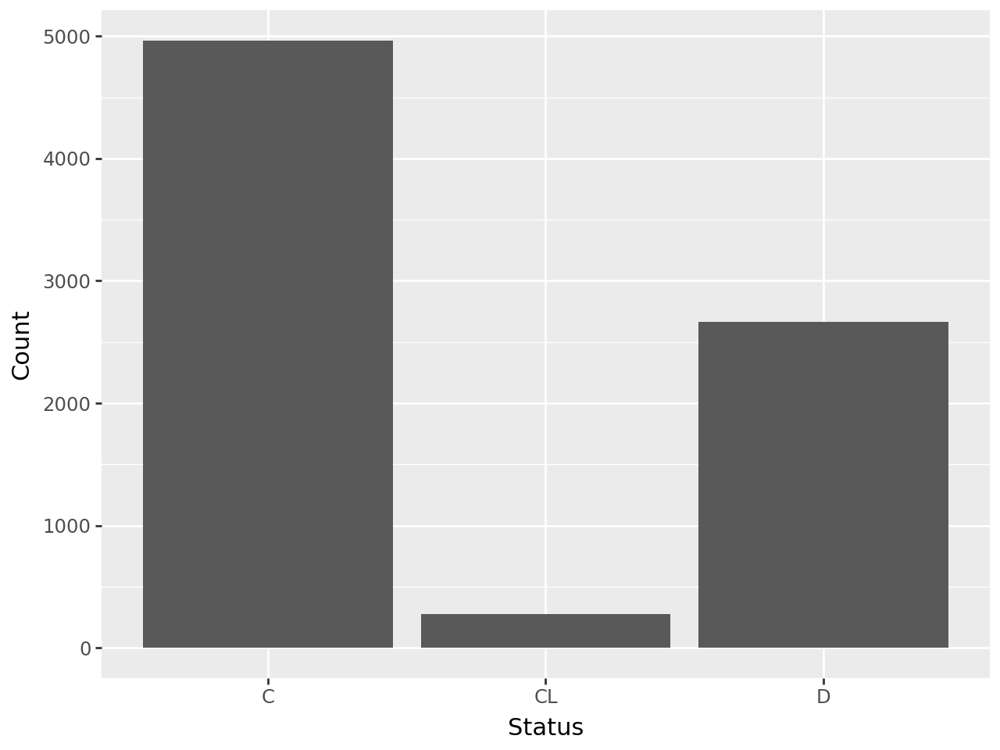

In [65]:
# Create a copy of data
data_raw = df_train.copy()

# Create bar chart of the Status label distribution
status_counts = data_raw['Status'].value_counts().reset_index()
status_counts.columns = ['Status', 'Count']

display(HTML(status_counts.to_html()))

p = ggplot(status_counts, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')

We will compare in detail three sampling methods dealing with unbalanced class data:
* Synthetic Minority Oversampling Technique (SMOTE)
* Random Undersampling
* Neighborhood Cleaning Rule (NCL)

We will fit a Gradient Boosting Decision Tree (GBDT) classifier on the resampled data to assess the effectiveness of these techniques.

But firstly, we need to preprocess the dataset. Categorical features will be one hot encoded. Only a subset of features with high correlation will be used. Split the dataset to training and testing sets using 80-20 train-test split.

In [66]:
# Convert days to years
data_raw['ageByYears'] = data_raw['Age'] / 365
data_raw['ageByYears'] = np.floor(data_raw['ageByYears'])

# Select a subset of features
data_selected = data_raw[['Ascites', 'Hepatomegaly', 'Edema', 'Stage', 'Copper', 'SGOT', 'ageByYears', 'Status']].copy()

# Ordinal encode 'Stage' column
ordinal_encoder = OrdinalEncoder()
data_selected["Stage"] = ordinal_encoder.fit_transform(data_selected[["Stage"]])

# One-hot encode selected columns
one_hot_encoder = OneHotEncoder(sparse_output=False)
data_categorical_encoded = pd.DataFrame(one_hot_encoder.fit_transform(data_selected[["Ascites", "Hepatomegaly", "Edema"]]),
                                        columns=one_hot_encoder.get_feature_names_out(["Ascites", "Hepatomegaly", "Edema"]))

# Drop original categorical columns
data_selected.drop(columns=["Ascites", "Hepatomegaly", "Edema"], inplace=True)

# Label encode 'Status' column
label_encoder = LabelEncoder()
data_selected["Status"] = label_encoder.fit_transform(data_selected["Status"])

# Concatenate one-hot encoded columns back to the dataframe
data_preprocessed = pd.concat([data_selected, data_categorical_encoded], axis=1)

# Splitting the dataset
X = data_preprocessed.drop('Status', axis=1)
y = data_preprocessed['Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=326)

## 3.1 No Resampling

To assess the resampling methods, we need to establish a benchmark of no resampling. Simply fit a GBDT classifier.

Recall: [0.80541625 0.20634921 0.65259117]
Precision: [0.7998008  0.20634921 0.6614786 ]


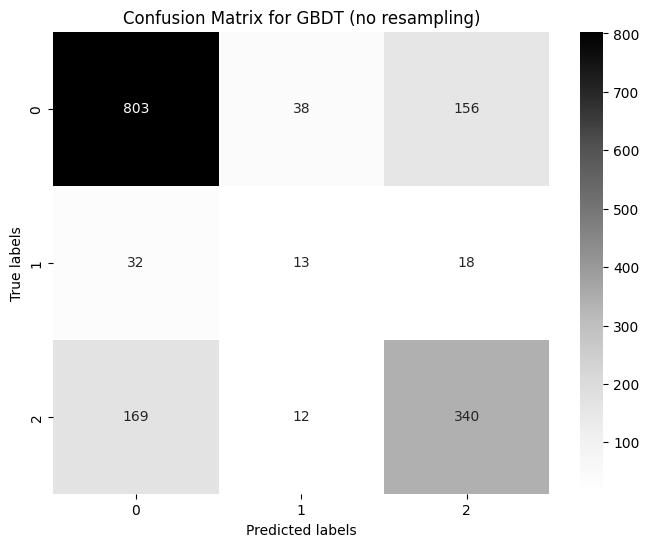

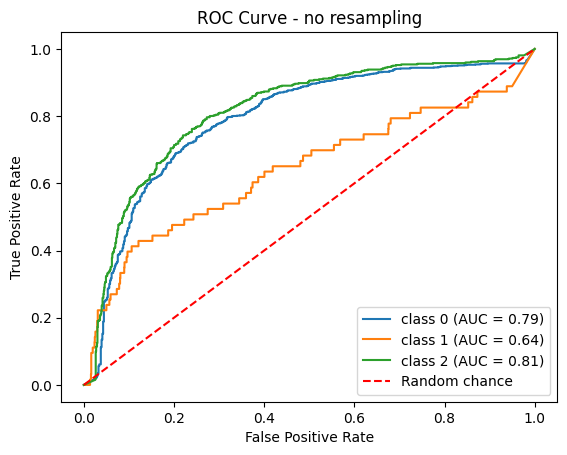

In [67]:
# Prepare your model
gb_clf = GradientBoostingClassifier(n_estimators=200,
                                    max_depth=4,
                                    learning_rate=0.5,
                                    subsample=0.5,
                                    random_state=42)
# Train the model
gb_clf.fit(X_train, y_train)

# Evaluate the model
y_pred = gb_clf.predict(X_test)
print(f'Recall: {recall_score(y_test, y_pred, average=None)}')
print(f'Precision: {precision_score(y_test, y_pred, average=None)}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for GBDT (no resampling)')
plt.show()

# ROC Curve
# Calculate the prediction probability and plot the ROC curve
y_prob = gb_clf.predict_proba(X_test)
plt.figure()
for i in range(len(y_test.unique())):
    fpr, tpr, thresholds = roc_curve(y_test == i, y_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'class {i} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - no resampling')
plt.legend(loc="lower right")
plt.show()


## 3.2 Synthetic Minority Oversampling Technique (SMOTE)

Resample the dataset using SMOTE and check the class label distribution.

,Status,Count
0,0,3968
1,2,3968
2,1,3968


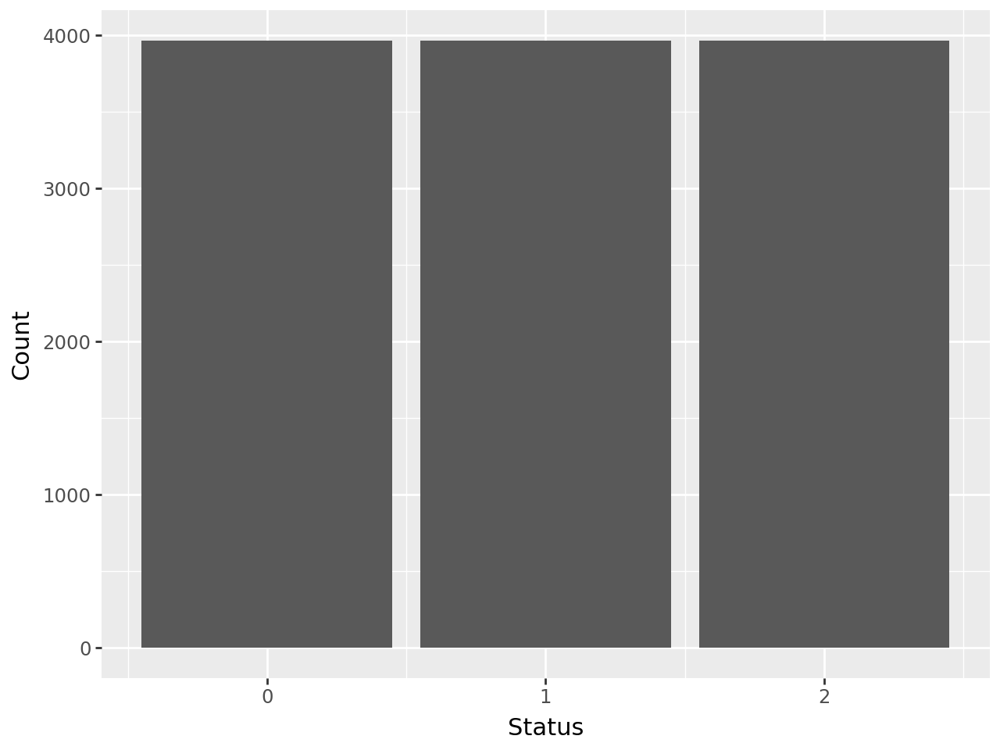

In [68]:
# Resample using SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=0)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

data_smote = pd.DataFrame(X_resampled, columns=X_resampled.columns)
data_smote['Status'] = y_resampled

status_counts_smote = data_smote['Status'].value_counts().reset_index()
status_counts_smote.columns = ['Status', 'Count']

# Show label distribution
display(HTML(status_counts_smote.to_html()))

# Bar chart
p = ggplot(status_counts_smote, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')


There are 3968 instances for each Status category in the resampled training set (oversampling).

Now, fit a GBDT model and evaluate its performance.

Recall: [0.82547643 0.17460317 0.66986564]
Precision: [0.80765456 0.275      0.66858238]


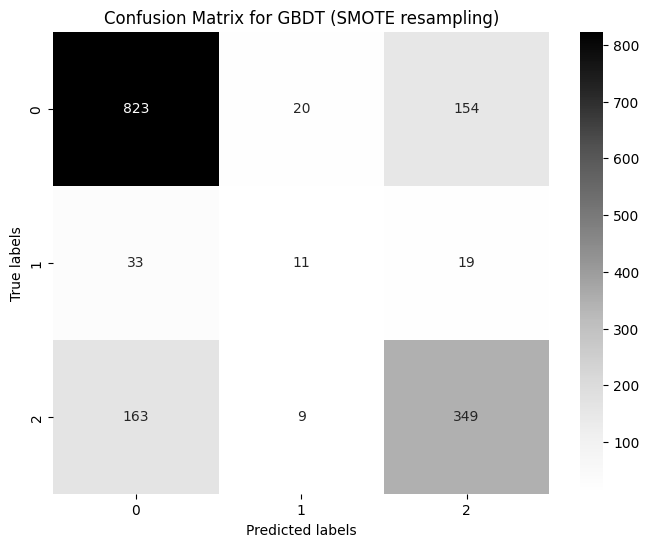

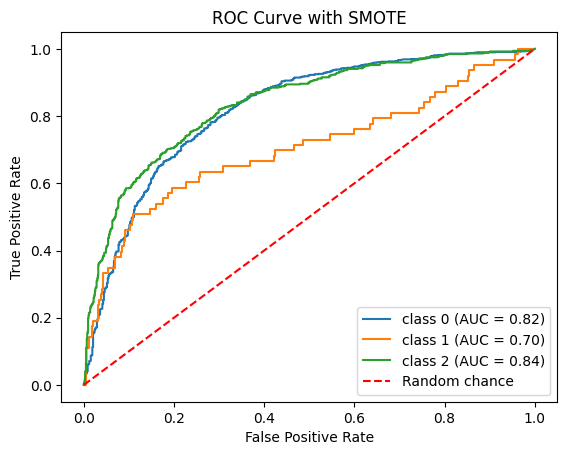

In [69]:
# Prepare your model
gb_clf = GradientBoostingClassifier(n_estimators=200,
                                    max_depth=4,
                                    learning_rate=0.5,
                                    subsample=0.5,
                                    random_state=42)
# Train the model
gb_clf.fit(X_resampled, y_resampled)

# Evaluate the model
y_pred = gb_clf.predict(X_test)
print(f'Recall: {recall_score(y_test, y_pred, average=None)}')
print(f'Precision: {precision_score(y_test, y_pred, average=None)}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for GBDT (SMOTE resampling)')
plt.show()

# ROC Curve
# Calculate the prediction probability and plot the ROC curve
y_prob = gb_clf.predict_proba(X_test)
plt.figure()
for i in range(len(y_test.unique())):
    fpr, tpr, thresholds = roc_curve(y_test == i, y_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'class {i} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve with SMOTE')
plt.legend(loc="lower right")
plt.show()



SMOTE resampling slightly improved the performance of the classifier, mainly for the least represented "CL" Status.

## 3.3 Random Undersampling

Resample the dataset using random undersampling strategy and check the class label distribution.

,Status,Count
0,0,212
1,1,212
2,2,212


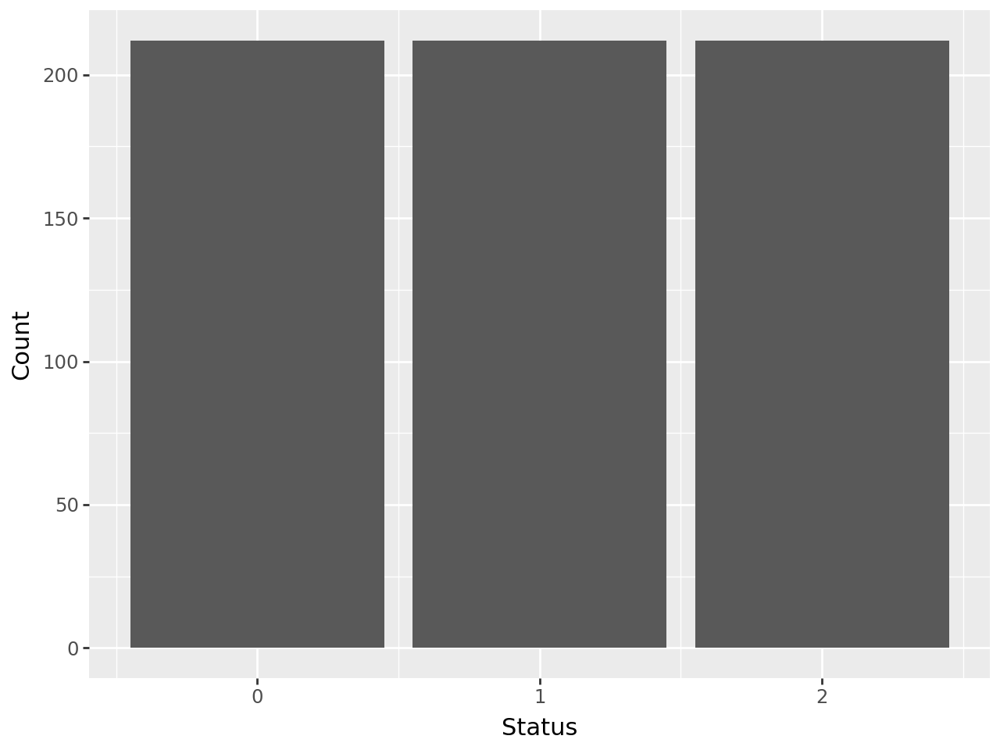

In [70]:
# The RandomUnderSampler is used for imbalance problems
random_undersampler = RandomUnderSampler(random_state=0)
X_resampled, y_resampled = random_undersampler.fit_resample(X_train, y_train)

# Combine the undersampled features and labels into a new data box: data_random_undersampled
data_random_undersampled = pd.DataFrame(X_resampled, columns=X_resampled.columns)
data_random_undersampled['Status'] = y_resampled

status_counts_undersample = data_random_undersampled['Status'].value_counts().reset_index()
status_counts_undersample.columns = ['Status', 'Count']


display(HTML(status_counts_undersample.to_html()))

p = ggplot(status_counts_undersample, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')


There are 212 instances for each Status category in the resampled training set. This is the same number as the amount of the least represented label ("CL") in the original train dataset.

Now, fit a GBDT model and evaluate its performance.

Recall: [0.52056169 0.57142857 0.55278311]
Precision: [0.80715397 0.08314088 0.57029703]


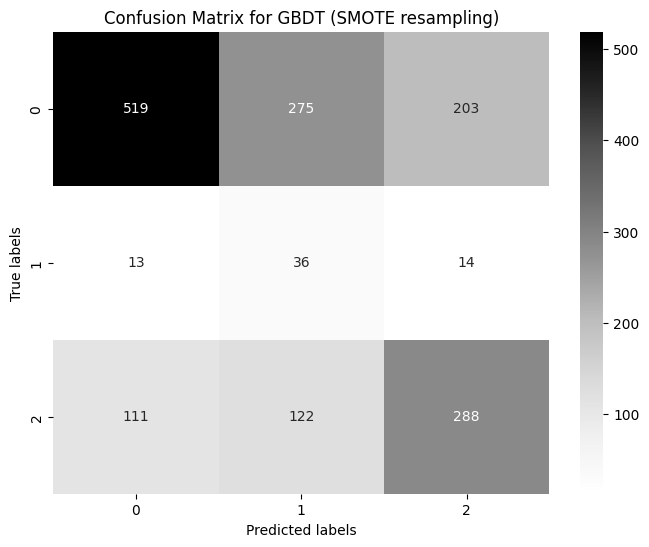

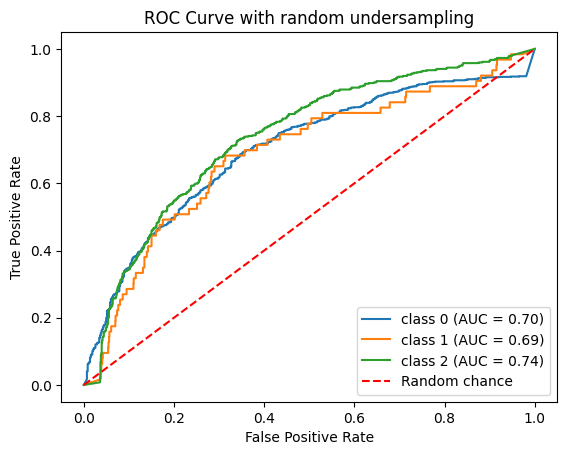

In [71]:
# Prepare your model
gb_clf = GradientBoostingClassifier(n_estimators=200,
                                    max_depth=4,
                                    learning_rate=0.5,
                                    subsample=0.5,
                                    random_state=42)
# Train the model
gb_clf.fit(X_resampled, y_resampled)

# Evaluate the model
y_pred = gb_clf.predict(X_test)
print(f'Recall: {recall_score(y_test, y_pred, average=None)}')
print(f'Precision: {precision_score(y_test, y_pred, average=None)}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for GBDT (SMOTE resampling)')
plt.show()

# ROC Curve
# Calculate the prediction probability and plot the ROC curve
y_prob = gb_clf.predict_proba(X_test)
plt.figure()
for i in range(len(y_test.unique())):
    fpr, tpr, thresholds = roc_curve(y_test == i, y_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'class {i} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve with random undersampling')
plt.legend(loc="lower right")
plt.show()

Compared to SMOTE, the random undersampling resulted in much worse AUC scores for each class. Random sampling is even worse than no sampling.

## 3.4 Neighborhood Cleaning Rule (NCL) Undersampling

Resample the dataset using random undersampling strategy and check the class label distribution.

   Status  Count
0       0   3191
1       2   1222
2       1    212


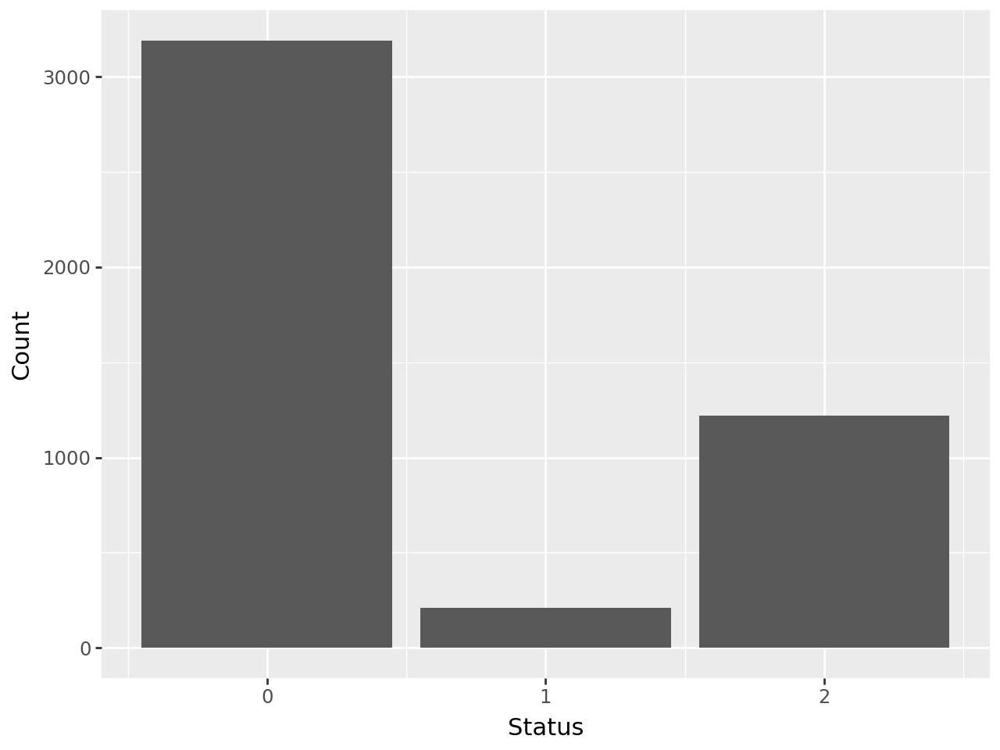

In [72]:
# The neighborhood cleaning rule
random.seed(0)
ncl_undersampler = NeighbourhoodCleaningRule()  # no random_state param
X_resampled, y_resampled = ncl_undersampler.fit_resample(X_train, y_train)

# Combine the undersampled features and labels into a new data box: data_random_undersampled
data_ncl = pd.DataFrame(X_resampled, columns=X_resampled.columns)
data_ncl['Status'] = y_resampled

status_counts_ncl = data_ncl['Status'].value_counts().reset_index()
status_counts_ncl.columns = ['Status', 'Count']

print(status_counts_ncl)

p = ggplot(status_counts_ncl, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')


Based on the previous step, the data can now be oversampled on the basis of NCL. The method for secondary sampling comes from the paper "Combine over-sampling and under-sampling technique for imbalance dataset" (https://dl.acm.org/doi/abs/10.1145/3055635.3056643), this step is to increase the number of minority classes. The aim is to increase the ability of the model to recognize this class.

Use SMOTE to oversample now.

   Status  Count
0       0   3191
1       2   3191
2       1   3191


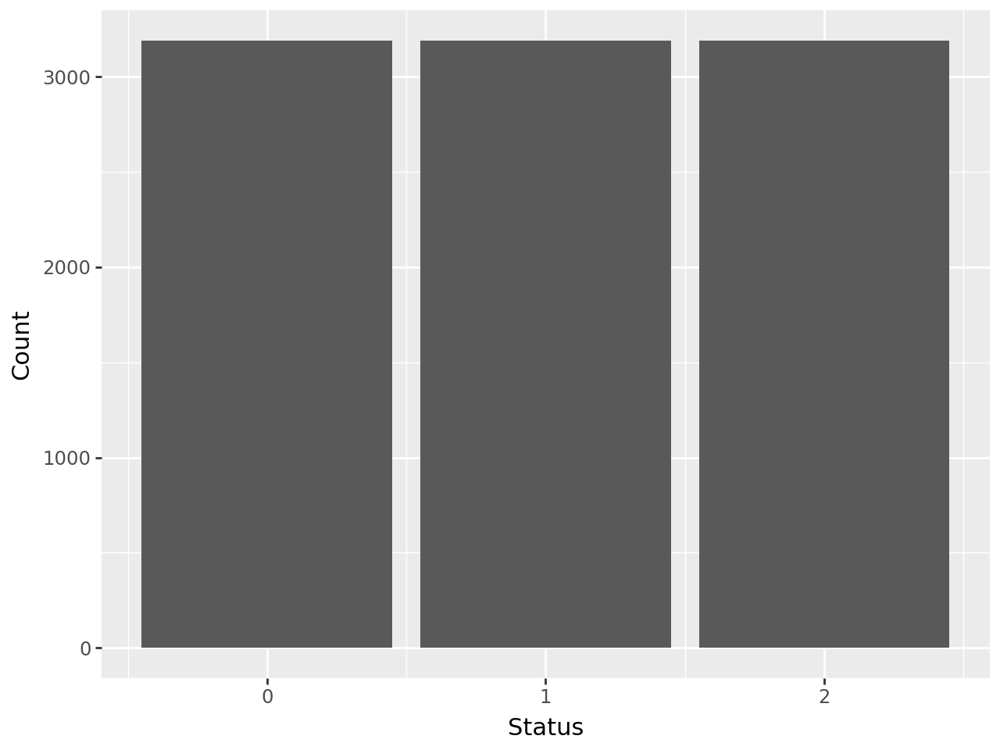

In [73]:
# Extract the label column (for example, the Status column) as the label y
y_train_ncl = data_ncl['Status']

# Feature columns
X_train_ncl = data_ncl.drop(columns=['Status'])


# SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=0)
X_resampled, y_resampled = smote.fit_resample(X_train_ncl, y_train_ncl)

# Combine the resamped features and labels into a new data box: data_smote
data_NCL_smote = pd.DataFrame(X_resampled, columns=X.columns)
data_NCL_smote['Status'] = y_resampled

status_counts_smote = data_NCL_smote['Status'].value_counts().reset_index()
status_counts_smote.columns = ['Status', 'Count']

print(status_counts_smote)

p = ggplot(status_counts_smote, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')

Recall: [0.8445336  0.3015873  0.59117083]
Precision: [0.79659413 0.20430108 0.71461717]


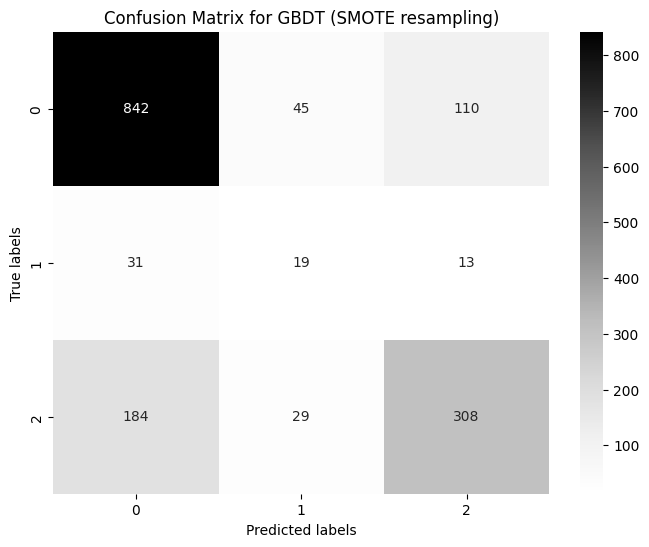

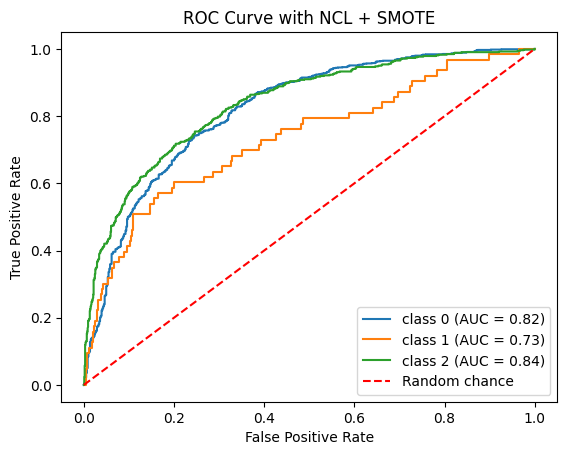

In [74]:
# Prepare your model
gb_clf = GradientBoostingClassifier(n_estimators=200,
                                    max_depth=4,
                                    learning_rate=0.5,
                                    subsample=0.5,
                                    random_state=42)
# Train the model
gb_clf.fit(X_resampled, y_resampled)

# Evaluate the model
y_pred = gb_clf.predict(X_test)
print(f'Recall: {recall_score(y_test, y_pred, average=None)}')
print(f'Precision: {precision_score(y_test, y_pred, average=None)}')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for GBDT (SMOTE resampling)')
plt.show()

# ROC Curve
# Calculate the prediction probability and plot the ROC curve
y_prob = gb_clf.predict_proba(X_test)
plt.figure()
for i in range(len(y_test.unique())):
    fpr, tpr, thresholds = roc_curve(y_test == i, y_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'class {i} (AUC = {auc_score:.2f})')

plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve with NCL + SMOTE')
plt.legend(loc="lower right")
plt.show()



Very similar results to SMOTE only. We can conclude that initial NCL undersampling does not improve the AUC scores.

### 3.4.1 NearMiss undersampling

In addition, there is an undersampling technique called NearMiss. It has a similar effect to NCL. Hence, we will not assess this method in detail.

   Status  Count
0       0   3191
1       2   1222
2       1    212


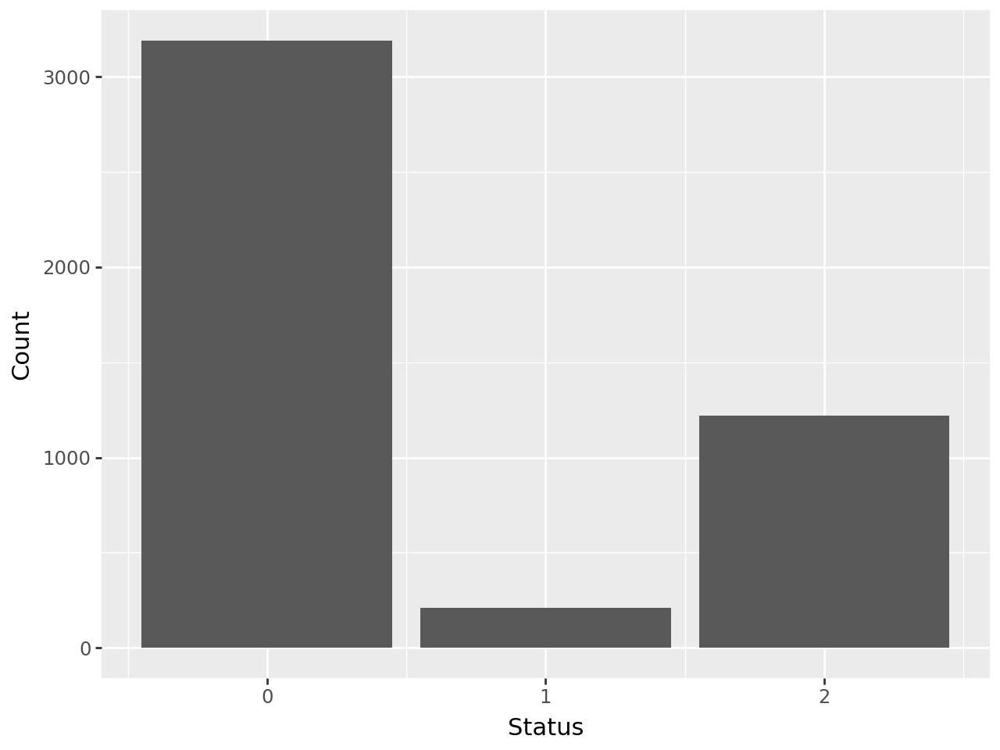

In [75]:
# NearMiss-1 undersampling
random.seed(0)
nearmiss = NearMiss(version=1)
X_resampled, y_resampled = nearmiss.fit_resample(X_train, y_train)

# Combine the undersampled features and labels into a new DataFrame: data_nearmiss_undersampled
data_nearmiss = pd.DataFrame(X_resampled, columns=X_resampled.columns)
data_nearmiss['Status'] = y_resampled

status_counts_nearmiss = data_ncl['Status'].value_counts().reset_index()
status_counts_nearmiss.columns = ['Status', 'Count']

print(status_counts_nearmiss)

p = ggplot(status_counts_nearmiss, aes(x='Status', y='Count'))

p + geom_bar(stat='identity')


# **4 Comparison of Decision Boundaries of Multi-Class Classifiers**

Before fitting models on our data, we will assess a range of classifiers on a randomly generated data to narrow the selection.

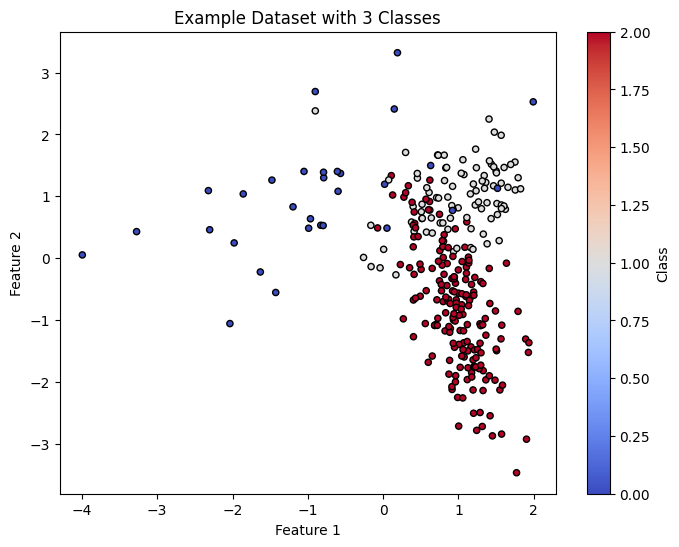

In [76]:
# Generate random data with 2 numerical features and 3 classes
np.random.seed(0)
# Want unbalanced classes
class_weights = {0: 0.1, 1: 0.3, 2: 0.6}
X, y = make_classification(n_samples=300, n_features=2, n_classes=3,
                           n_clusters_per_class=1, weights=class_weights,
                           random_state=0, n_informative=2, n_redundant=0,
                           n_repeated=0)

# Visual example data set
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Example Dataset with 3 Classes')
plt.colorbar(label='Class')
plt.show()


## 4.1 Logistic regression multi-classifier based on OvO strategy

In general, logistic regression is suitable for binary classification problems, but any binary classifier can be transformed into a multi-class classifier by using the one-VS-one(OvO) or one-VS-rest(OvR) strategy. Here we used the OvO strategy to transform logistic regression into a multi-class classifier.

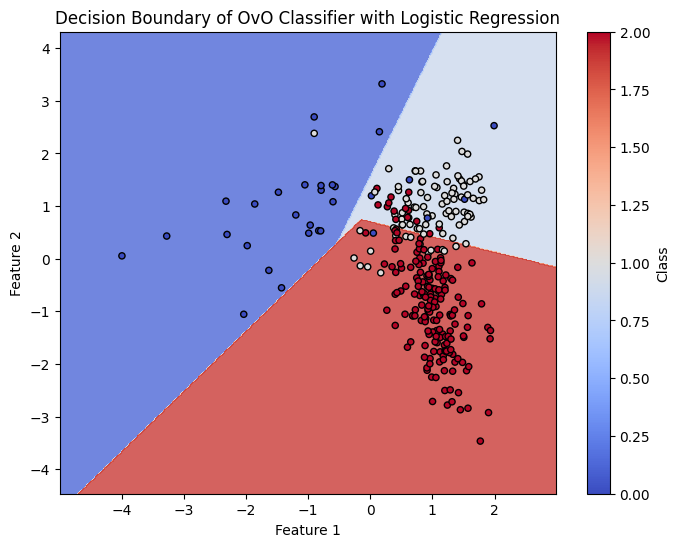

In [77]:
# Define an OvO Classifier class
class OvOClassifier:
    def __init__(self, base_classifier):
        self.base_classifier = base_classifier
        self.classifiers = {}

    def fit(self, X, y):
        unique_classes = set(y)
        for class_a in unique_classes:
            for class_b in unique_classes:
                if class_a < class_b:
                    class_indices = [i for i in range(len(y)) if y[i] == class_a or y[i] == class_b]
                    X_subset = X[class_indices]
                    y_subset = y[class_indices]
                    classifier = self.base_classifier()
                    classifier.fit(X_subset, y_subset)
                    self.classifiers[(class_a, class_b)] = classifier

    def predict(self, X):
        predictions = []
        for instance in X:
            votes = Counter()
            for (class_a, class_b), classifier in self.classifiers.items():
                prediction = classifier.predict([instance])[0]
                if prediction == class_a:
                    votes[class_a] += 1
                else:
                    votes[class_b] += 1
            most_common_class, _ = votes.most_common(1)[0]
            predictions.append(most_common_class)
        return predictions


# Using the OvO classifier to classifiy the data set
ovo_classifier = OvOClassifier(LogisticRegression)
ovo_classifier.fit(X, y)

# Drawing decision boundary
h = .02
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = np.array(ovo_classifier.predict(np.c_[xx.ravel(), yy.ravel()]))

Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of OvO Classifier with Logistic Regression')
plt.colorbar(label='Class')
plt.show()


## 4.2 SVM multi-class classification based on OvO strategy

We can transform the Support Vector Machine (SVM) to a multi-class classifier using the same strategy. We will use a linear SVM classifier.

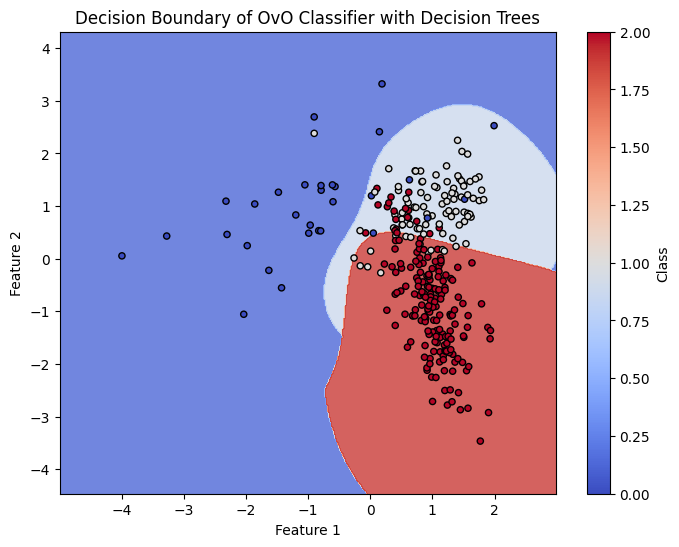

In [78]:
# SVM OvO classifier
ovo_classifier = OvOClassifier(SVC)
ovo_classifier.fit(X, y)

# Drawing decision boundary
h = .02
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = np.array(ovo_classifier.predict(np.c_[xx.ravel(), yy.ravel()]))

Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of OvO Classifier with Decision Trees')
plt.colorbar(label='Class')
plt.show()

## 4.3 Multi-class classifier based on Decision Tree

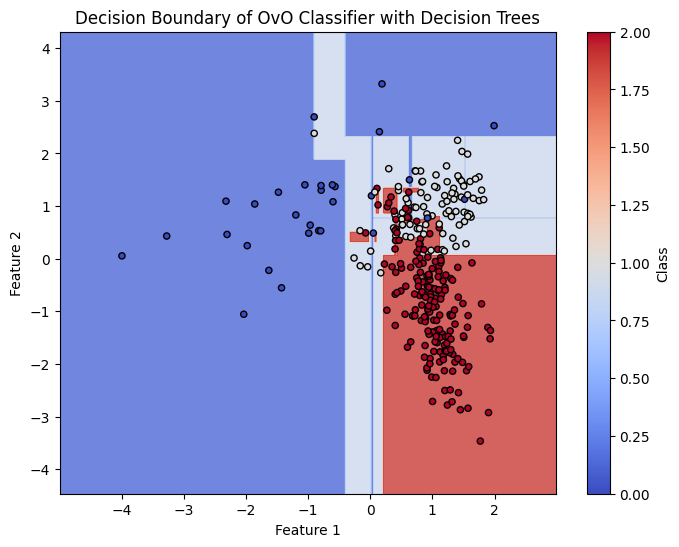

In [79]:
ovo_classifier = OvOClassifier(DecisionTreeClassifier)
ovo_classifier.fit(X, y)

h = .02
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = np.array(ovo_classifier.predict(np.c_[xx.ravel(), yy.ravel()]))

Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of OvO Classifier with Decision Trees')
plt.colorbar(label='Class')
plt.show()

Decision Tree classifier seems to be better suited to unbalanced data than the SVM or Logistic Regression classifiers.

Next, we focus on testing the ensemble learning methods. Similar to the random forest model, in which several decision trees are integrated. The idea of ensemble learning is to combine multiple weak learners together. The mainstream methods are adaptive boost (adaboost) algorithm and gradient decision tree (GBDT) method. The core idea of these two methods is similar, both of which are "each weak classifier performs better on the samples wrongly classified by the previous classifier, thus gradually improving the performance of the overall model". This can not only solve the multi-class classification problem, but also improve the recognition performance of imbalance data. Based on this idea, especially when the identification task of imbalanced data is carried out, the performance will be significantly improved.

## 4.4 Multi-class classifier based on AdaBoost algorithm

C:\Users\kathe\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.


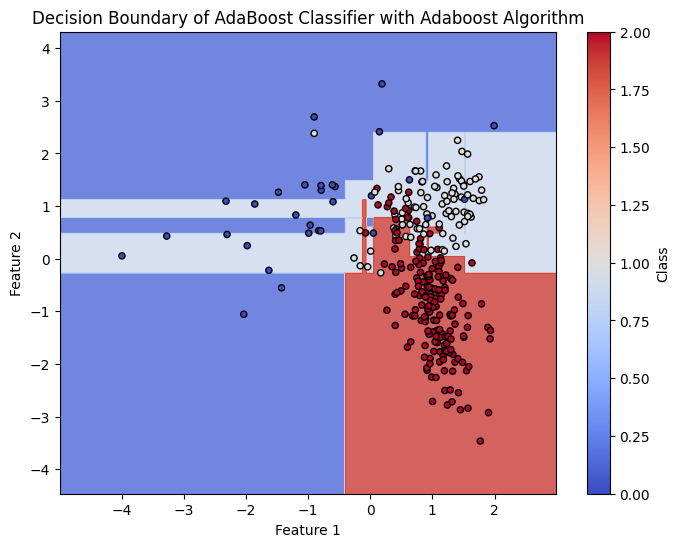

In [80]:
# Define the AdaBoost classifier with the decision tree as the base classifier
ada_clf = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=1),
    n_estimators=50,  # the number of base classifiers
    random_state=42
)

ada_clf.fit(X, y)

h = .02
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = ada_clf.predict(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of AdaBoost Classifier with Adaboost Algorithm')
plt.colorbar(label='Class')
plt.show()

## 4.5 Multi-class classifier based on Gredient Boosting Deciosion Tree

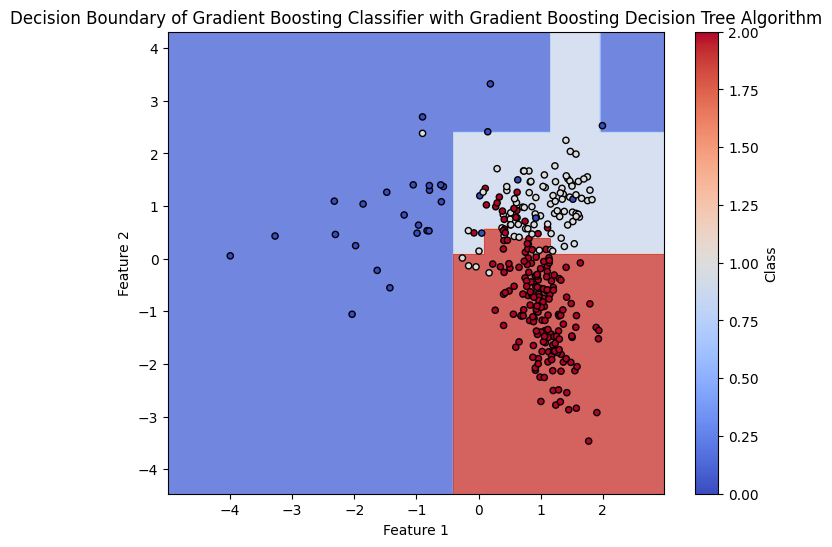

In [81]:
# GBDT classifier is defined with decision tree as the base classifier
gb_clf = GradientBoostingClassifier(
    n_estimators=50,  # number of base classifiers
    max_depth=1,  # max depth of the decision tree
    random_state=42
)

gb_clf.fit(X, y)

h = .02
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = gb_clf.predict(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of Gradient Boosting Classifier with Gradient Boosting Decision Tree Algorithm')
plt.colorbar(label='Class')
plt.show()

## 4.6 Multi-class classifier based on XGBoost

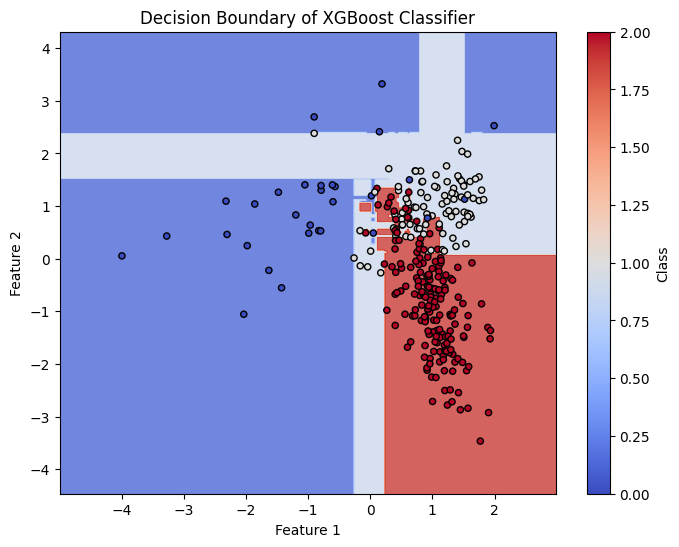

In [82]:
# Instantiation of the XGBoost classifier
xgb_model = XGBClassifier(objective="multi:softmax", num_class=3, random_state=42)
xgb_model.fit(X, y)

# draw decision boundary
h = .02  # step size
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = xgb_model.predict(np.c_[xx.ravel(), yy.ravel()])

# put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of XGBoost Classifier')
plt.colorbar(label='Class')
plt.show()

XGBoost seem to be the best so far, slightly better than AdaBoost and GBDT.

## 4.7 Logistic Regression + SVM + KNN Classifier

In addition to the above models, we have designed a multi-class classification system based on stack method in ensemble learning, which integrates logistic regression, support vector machine and K-nearest neighbor (KNN) algorithm.

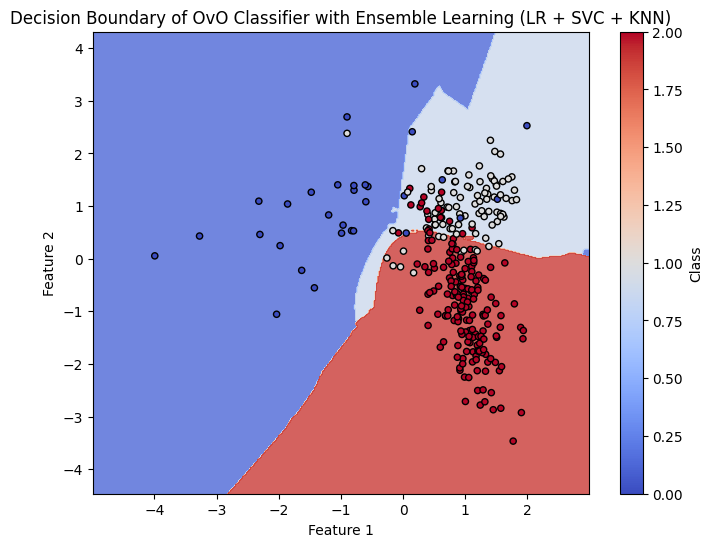

In [83]:
random.seed(42)

# use the OvO classifier to classify the data set
base_classifiers = [('lr', LogisticRegression()), ('svm', SVC()), ('knn', KNeighborsClassifier())] # base classifiers for ensemble learning with stacked method
voting_classifier = VotingClassifier(estimators=base_classifiers, voting='hard')
voting_classifier.fit(X, y)

# draw decision boundary
h = .02  # step size
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = np.array(voting_classifier.predict(np.c_[xx.ravel(), yy.ravel()]))

# put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(figsize=(8, 6))
plt.contourf(xx, yy, Z, cmap=plt.cm.coolwarm, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.cm.coolwarm, s=20, edgecolors='k')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Decision Boundary of OvO Classifier with Ensemble Learning (LR + SVC + KNN)')
plt.colorbar(label='Class')
plt.show()

Except for the difference in the shape of the decision boundary (which is caused by the decision boundary of the support vector machine), the classification effect is similar to that of GBDT.

# **5 Model Fitting and Comparison**

Following all previous sections, we now can fit suitable models to our data.

Following Section 1 (Data Exploration), we will use the following features that are correlated with Status which we want to predict:
* Ascites (categorical)
* Hepatomegaly (categorical)
* Edema (categorical)
* Spiders (categorical)
* Stage (ordinal)
* N_Days (numerical)
* Bilirubin (numerical)
* Albumin (numerical)
* Copper (numerical)
* SGOT (numerical)
* Prothrombin (numerical)

There are no missing values, hence, we do not need to use the imputation methods.

Following Section 3, we will use SMOTE oversampling for the Status.

Following Section 4, we will fit following three models:
* AdaBoost
* Gradient Boosting Decistion Tree (GBDT)
* XGBoost

We will use an exhaustive grid search and 5-cross validation to find the best parameters. Log loss will be used as the scoring metric (because Kaggle uses it), which we want to minimise.

In [84]:
# Select subset of features
df_selected = df_train[['N_Days', 'Bilirubin', 'Albumin', 'SGOT', 'Copper', 'Prothrombin', 'Stage', 'Ascites', 'Hepatomegaly', 'Spiders','Edema', 'Status']].copy()

# Split the dataset into training and testing sets
X = df_selected.drop('Status', axis=1)
y = df_selected['Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Specify categorical and ordinal features
categorical_features = ["Ascites", "Hepatomegaly", "Edema", "Spiders"]
ordinal_features = ['Stage']

# Specify column transformer for preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(sparse_output=False), categorical_features),
        ('ord', OrdinalEncoder(), ordinal_features)
    ],
    remainder='passthrough'
)

# Label encoding for the target variable should be applied outside the cross-validation and grid search process
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

## 5.1 AdaBoost classifier

In [85]:
# This might take several minutes

# Define the pipeline including preprocessing and SMOTE
pipeline_adaboost = ImblearnPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(sampling_strategy='auto', random_state=42)),
    ('classifier', AdaBoostClassifier(estimator=DecisionTreeClassifier(), random_state=42))
])

# Define the parameter grid
param_grid = {
    'classifier__algorithm': ['SAMME', 'SAMME.R'],
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.001, 0.01, 0.1],
    'classifier__estimator__max_depth': [1, 2, 4],
    'classifier__estimator__min_samples_split': [2, 4, 8]
}


# Setup GridSearchCV
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_adaboost = GridSearchCV(pipeline_adaboost, param_grid, cv=cv_strategy, scoring='neg_log_loss', n_jobs=-1, verbose=1)

# Perform the grid search on the training data
grid_search_adaboost.fit(X_train, y_train_encoded)

# Best parameters and score
print("Best parameters:", grid_search_adaboost.best_params_)
print("Best score (neg_log_loss):", grid_search_adaboost.best_score_)

Fitting 5 folds for each of 162 candidates, totalling 810 fits


C:\Users\kathe\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.


Best parameters: {'classifier__algorithm': 'SAMME.R', 'classifier__estimator__max_depth': 4, 'classifier__estimator__min_samples_split': 4, 'classifier__learning_rate': 0.01, 'classifier__n_estimators': 100}
Best score (neg_log_loss): -0.6366106951947916


We have fitted an AdaBoost classifier. The best model, i.e. the one with the best parameters, achieved cross validation log loss of 0.637 on the training data.

Let's evaluate the best model on unseen test data.

Log Loss: 0.6493734972542298
Accuracy: 0.7495256166982922
Recall: [0.82074522 0.34545455 0.65853659]
Precision: [0.85970464 0.12101911 0.73739496]



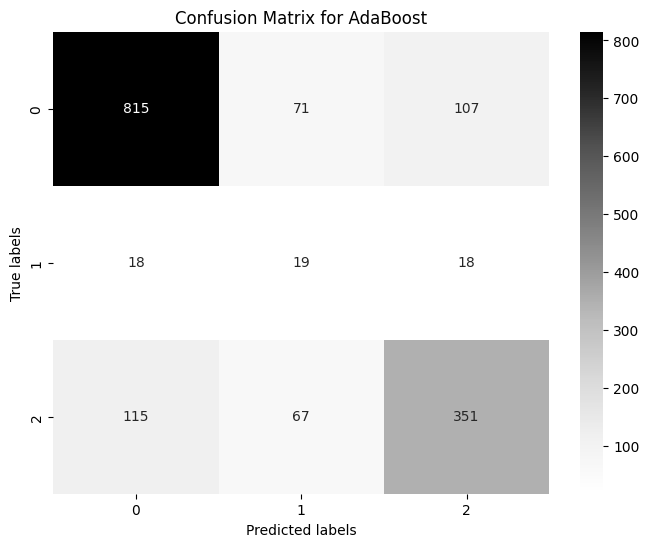

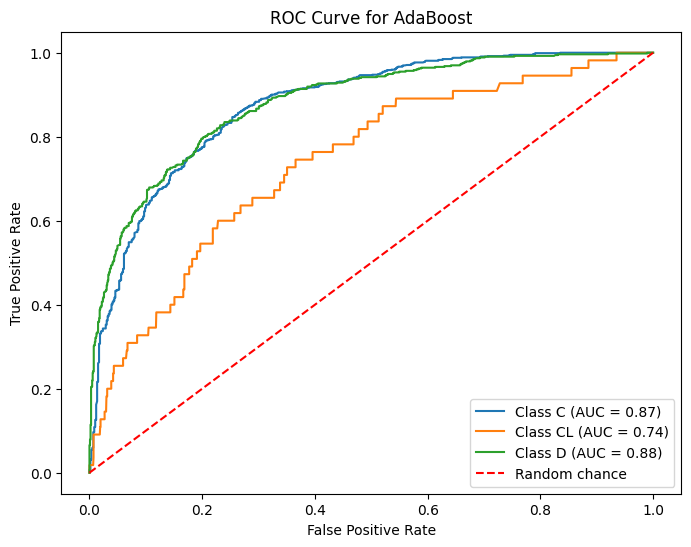

In [86]:
# Evaluate the model on the test set

# Log loss
y_pred_prob = grid_search_adaboost.predict_proba(X_test)
test_log_loss = log_loss(y_test_encoded, y_pred_prob)
print(f"Log Loss: {test_log_loss}")

# Accuracy, precision and recall
y_pred = grid_search_adaboost.predict(X_test)
accuracy = accuracy_score(y_test_encoded, y_pred)
recall = recall_score(y_test_encoded, y_pred, average=None)
precision = precision_score(y_test_encoded, y_pred, average=None)
print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')
print()

# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for AdaBoost')
plt.show()
print()

# ROC curves
plt.figure(figsize=(8, 6))
for i in range(len(label_encoder.classes_)):
    fpr, tpr, thresholds = roc_curve(y_test_encoded == i, y_pred_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {label_encoder.inverse_transform([i])[0]} (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for AdaBoost')
plt.legend(loc='lower right')
plt.show()

AdaBoost classifier seems to work quite well, but it struggles more with the underrepresented "CL" Status.

## 5.2 Gradient Boosting Decision Tree (GBDT) classifier

In [87]:
# This might take several minutes

# Define the pipeline including preprocessing and SMOTE
pipeline_gbdt = ImblearnPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(sampling_strategy='auto', random_state=42)),
    ('classifier', GradientBoostingClassifier(random_state=42))
])

# Define the parameter grid
param_grid = {
    'classifier__max_depth': [2, 4, 6],
    'classifier__n_estimators': [100, 200, 300],
    'classifier__learning_rate': [0.01, 0.1, 0.5]
}

# Setup GridSearchCV
cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_gbdt = GridSearchCV(pipeline_gbdt, param_grid, cv=cv_strategy, scoring='neg_log_loss', n_jobs=-1, verbose=1)

# Perform the grid search on the training data
grid_search_gbdt.fit(X_train, y_train_encoded)

# Best parameters and score
print("Best parameters:", grid_search_gbdt.best_params_)
print("Best score (- log loss):", grid_search_gbdt.best_score_)

Fitting 5 folds for each of 27 candidates, totalling 135 fits


Best parameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 4, 'classifier__n_estimators': 200}
Best score (- log loss): -0.49257683580174394


We have fitted a GBDT classifier. The best model achieved cross validation log loss of 0.493 on the training data, which is better than the score of AdaBoost.  

Let's evaluate the best GBDT model on unseen test data.

Log Loss: 0.5085433325697684
Accuracy: 0.7988614800759013
Recall: [0.86908359 0.23636364 0.7260788 ]
Precision: [0.85192498 0.23214286 0.75585938]



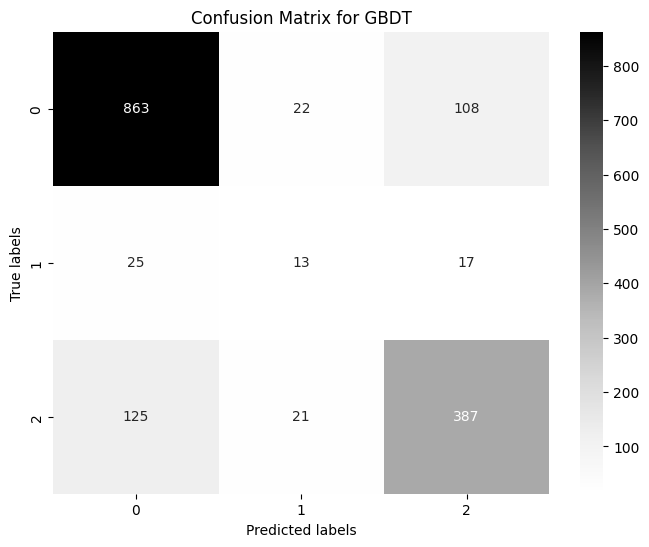

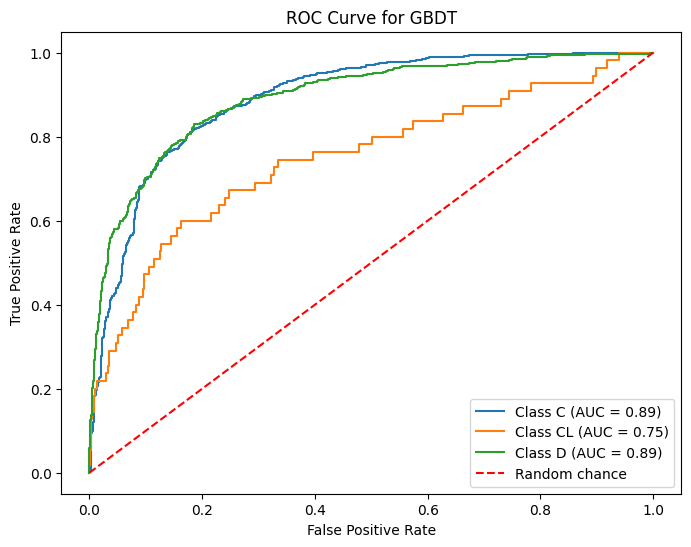

In [88]:
# Evaluate the model on the test set

# Log loss
y_pred_prob = grid_search_gbdt.predict_proba(X_test)
test_log_loss = log_loss(y_test_encoded, y_pred_prob)
print(f"Log Loss: {test_log_loss}")

# Accuracy, precision and recall
y_pred = grid_search_gbdt.predict(X_test)
accuracy = accuracy_score(y_test_encoded, y_pred)
recall = recall_score(y_test_encoded, y_pred, average=None)
precision = precision_score(y_test_encoded, y_pred, average=None)
print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')
print()

# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for GBDT')
plt.show()
print()

# ROC curves
plt.figure(figsize=(8, 6))
for i in range(len(label_encoder.classes_)):
    fpr, tpr, thresholds = roc_curve(y_test_encoded == i, y_pred_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {label_encoder.inverse_transform([i])[0]} (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for GBDT')
plt.legend(loc='lower right')
plt.show()

The GBDT classifier achieved better log loss and accuracy than the AdaBoost classifier. However, it was slightly worse regarding identification of the "CL" labeled instances.

## 5.3 XGBoost

In [89]:
# This might take several minutes

# Define the pipeline including preprocessing and SMOTE
pipeline_xgboost = ImblearnPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(sampling_strategy='auto', random_state=42)),
    ('classifier', XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss'))
])

# Define the parameter grid
param_grid_xgboost = {
    'classifier__learning_rate': [0.01, 0.1],
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [4,  8],
    'classifier__subsample': [0.5, 0.7, 0.9],
    'classifier__colsample_bytree': [0.5, 0.7, 0.9]
}

# Setup GridSearchCV
cv_strategy_xgboost = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search_xgboost = GridSearchCV(pipeline_xgboost, param_grid_xgboost, cv=cv_strategy_xgboost, scoring='neg_log_loss', n_jobs=-1, verbose=1)

# Perform the grid search on the training data
grid_search_xgboost.fit(X_train, y_train_encoded)

# Best parameters and score
print("Best parameters:", grid_search_xgboost.best_params_)
print("Best score (neg_log_loss):", grid_search_xgboost.best_score_)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'classifier__colsample_bytree': 0.5, 'classifier__learning_rate': 0.1, 'classifier__max_depth': 8, 'classifier__n_estimators': 100, 'classifier__subsample': 0.5}
Best score (neg_log_loss): -0.4803904441082558


We have fitted an XGBoost classifier. The best model achieved cross validation log loss of 0.565 on the training data, which is better than the scores of AdaBoost and GBDT classifiers.  

Let's evaluate the best XGBoost model on unseen test data.

Log Loss: 0.4940093381633217
Accuracy: 0.8140417457305503
Recall: [0.88922457 0.18181818 0.73921201]
Precision: [0.8523166  0.28571429 0.77254902]


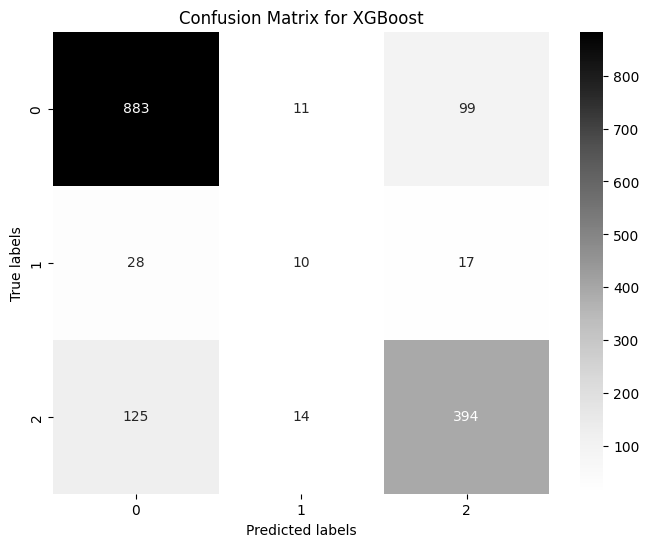

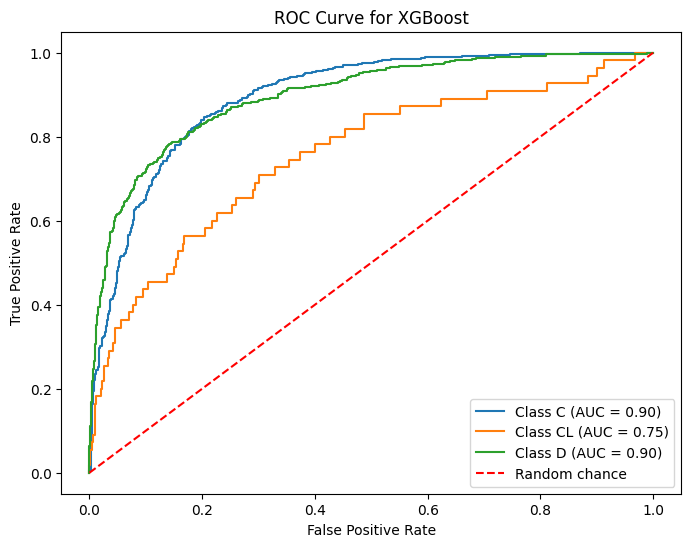

In [90]:
# Evaluate the model on the test set

# Log loss
y_pred_prob = grid_search_xgboost.predict_proba(X_test)
test_log_loss = log_loss(y_test_encoded, y_pred_prob)
print(f"Log Loss: {test_log_loss}")

# Accuracy, precision and recall
y_pred = grid_search_xgboost.predict(X_test)
accuracy = accuracy_score(y_test_encoded, y_pred)
recall = recall_score(y_test_encoded, y_pred, average=None)
precision = precision_score(y_test_encoded, y_pred, average=None)
print(f'Accuracy: {accuracy}')
print(f'Recall: {recall}')
print(f'Precision: {precision}')

# Confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix for XGBoost')
plt.show()
print()

plt.figure(figsize=(8, 6))
for i in range(len(label_encoder.classes_)):
    fpr, tpr, thresholds = roc_curve(y_test_encoded == i, y_pred_prob[:, i])
    auc_score = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {label_encoder.inverse_transform([i])[0]} (AUC = {auc_score:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label='Random chance')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for XGBoost')
plt.legend(loc='lower right')
plt.show()

The XGBoost classifier achieved the best results among the the three models. Still, the model predicts the "CL" Status less reliably. The ROC curves and AUC scores are very similar to GBDT. XGBoost has the lowest log loss.

Therefore, we will refit the XGBoost model with the best parameters on all data and prepare a CSV file for Kaggle submission.

In [91]:
# Select subset of features
X_test = df_test[['N_Days', 'Bilirubin', 'Albumin', 'SGOT', 'Copper', 'Prothrombin', 'Stage', 'Ascites', 'Hepatomegaly', 'Spiders','Edema']].copy()

# Prepare data
X_train = df_selected.drop('Status', axis=1)
y_train = df_selected['Status']

# Label encoding of Status
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)

print()

# Clone the pipeline and update with the best parameters
pipeline_xgboost_best = clone(pipeline_xgboost)
best_params = grid_search_xgboost.best_params_
pipeline_xgboost_best.set_params(**best_params)

# Refit pipeline on the entire training data
pipeline_xgboost_best.fit(X_train, y_train)

# Get prediction probabilities
y_pred_test_prob = pipeline_xgboost_best.predict_proba(X_test)

# Create a DataFrame as required by Kaggle
df_pred_test_prob = pd.DataFrame(y_pred_test_prob, columns=['Status_C', 'Status_CL', 'Status_D'])

# Assuming 'data_te_raw' contains the 'id' column to use as the DataFrame index
data_test_index = df_test['id']
df_pred_test_prob.index = data_test_index

# Save the DataFrame to a CSV File
df_pred_test_prob.to_csv('predicted_probabilities_xgboost.csv', index=True)

# Print the First Few Rows of the DataFrame
display(HTML(df_pred_test_prob.head(10).to_html()))

,Status_C,Status_CL,Status_D
id,,,
7905,0.386370,0.055869,0.557761
7906,0.542997,0.244487,0.212516
7907,0.021401,0.005043,0.973556
7908,0.949334,0.008310,0.042356
7909,0.789480,0.113044,0.097476
7910,0.991150,0.003681,0.005169
7911,0.945163,0.032740,0.022096
7912,0.256850,0.038677,0.704474
7913,0.011918,0.001442,0.986639
